# Домашнее задание №1

В этом домашнем задании вам предлагается обучить модель регрессии для предсказания стоимости автомобилей, а также реализовать веб-сервис для применения построенной модели на новых данных.

> Оценка за домашку = min(ваш балл, 10)


Задания, <font color='#9933CC'>выделенные фиолетовым</font>, требуют от вас написания кода.

А вопросы, <font color='#FF6600'>выделенные оранжевым</font>, текстового ответа.

Оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)
RANDOM_STATE=123

Ниже ответьте на вопрос <font color='#FF6600'>
"Для чего фиксируем сиды в домашках?"</font>

In [2]:
print("Сиды фиксируем для воспроизводимости результатов при многократных прогонах случайных генераторов.")

Сиды фиксируем для воспроизводимости результатов при многократных прогонах случайных генераторов.


# Часть 1 (2.5 балла + 0.75) | EDA

## Простейший EDA и обработка признаков (1.5 балла + 0.25)

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


(0.15 балла) <font color='#9933CC'>Отобразите 10 **случайных** строк тренировочного датасета</font>

In [4]:
# your code here
df_train.sample(n=10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


(0.1 балла) <font color='#9933CC'>Отобразите первые 5 и последние 5 объектов тестового датасета</font>

In [5]:
# your code here
# Первые 5
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [6]:
# Последние 5
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


(0.1 балла) <font color='#9933CC'>Посчитайте основные статистики как по числовым, так и по категориальным столбцам для трейна и теста</font>. 
> Подсказка: ``.describe()`` с нужным(и) аргументом(-ами)



In [7]:
# your code here
df_train.describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
count,6999,6999.000000,6.999000e+03,6.999000e+03,6999,6999,6999,6999,6797,6797,6803,6796,6797.000000
unique,1924,NaN,NaN,NaN,4,3,2,5,386,120,316,419,NaN
top,Maruti Swift Dzire VDI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,NaN
freq,116,NaN,NaN,NaN,3793,5826,6095,4587,197,885,330,468,NaN
mean,NaN,2013.818403,6.395152e+05,6.958462e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.419008
std,NaN,4.053095,8.089419e+05,5.772400e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965767
min,NaN,1983.000000,2.999900e+04,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000
25%,NaN,2011.000000,2.549990e+05,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
50%,NaN,2015.000000,4.500000e+05,6.000000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
75%,NaN,2017.000000,6.750000e+05,9.700000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000


In [8]:
df_test.describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
count,1000,1000.000000,1.000000e+03,1000.000000,1000,1000,1000,1000,981,981,981,981,981.000000
unique,621,NaN,NaN,NaN,4,3,2,5,237,88,182,226,NaN
top,Maruti Alto 800 LXI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm,NaN
freq,15,NaN,NaN,NaN,534,837,877,623,23,116,43,57,NaN
mean,NaN,2013.681000,6.179010e+05,71393.341000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.410805
std,NaN,4.012149,7.585539e+05,48486.218662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.919985
min,NaN,1995.000000,3.100000e+04,1303.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000
25%,NaN,2011.000000,2.500000e+05,37000.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
50%,NaN,2014.000000,4.349990e+05,61500.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
75%,NaN,2017.000000,6.700000e+05,100000.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000


(0.15 балла) <font color='#9933CC'>Посмотрите, есть ли в датасете пропуски.</font>

<font color='#FF6600'>Если есть, то в каких колонках?</font>

In [9]:
# your code here
df_train.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

In [10]:
df_test.isna().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

In [11]:
print('Пропуски есть в колонках "mileage" (202), "engine" (202), "max_power" (196), "torque" (203), "seats" (202) ' \
     'в трейне и в тех же колонках, но в каждой по 19 пропусков в тесте.')

Пропуски есть в колонках "mileage" (202), "engine" (202), "max_power" (196), "torque" (203), "seats" (202) в трейне и в тех же колонках, но в каждой по 19 пропусков в тесте.


(0.1 балла) <font color='#9933CC'>Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием</font> (целевую переменную следует исключить). Если есть, то сколько?

In [12]:
# your code here
print('Тренировочный сет содержит вот столько объектов с одинаковыми признаковыми описаниями:')
dupl_mask = df_train.drop(columns=["selling_price"]).duplicated(keep=False)
print(dupl_mask.sum())

Тренировочный сет содержит вот столько объектов с одинаковыми признаковыми описаниями:
1799


(0.15 балла) <font color='#9933CC'>Отобразите такие объекты</font>

In [13]:
# your code here
df_train[dupl_mask]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1 bhp,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2 bhp,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,750000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


(0.15 балла) <font color='#9933CC'>Удалите повторяющиеся строки</font>. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю

In [14]:
# your code here
df_train = df_train[~df_train.drop(columns=["selling_price"]).duplicated()]

In [15]:
assert df_train.shape == (5840, 13)

(0.1 балла) Чтоб все было по красоте, <font color='#9933CC'>обновите индексы строк таким образом, чтобы они шли от 0 без пропусков</font>

In [16]:
# your code here
df_train.reset_index(drop=True, inplace=True)
df_train.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не слава богу. Давайте починим.

(0.25 балла) Задача такая: 
<font color='#9933CC'>
* убрать единицы измерения для признаков ``mileage, engine, max_power``. 
* кастануть эти столбцы столбцы к ``float``.
* удалить столбец ``torque``
</font>

> Все действия нужно производить над обоими датасетами

---
**Доп (0.25 балла):**
* <font color='#9933CC'>Вместо удаления признак `torque` разделите на два: собственно `torque` и `max_torque_rpm`.</font> Учтите единицы измерения. Они разные ☹

In [17]:
# your code here
import re

def get_value(x: str):

    if not pd.notnull(x):
        return None

    value = re.search(r'\d+.\d+|\d+', x)
    if not value:
        return None

    return float(value.group())

df_train["mileage"] = df_train["mileage"].apply(get_value)
df_train["engine"] = df_train["engine"].apply(get_value)
df_train["max_power"] = df_train["max_power"].apply(get_value)

df_test["mileage"] = df_test["mileage"].apply(get_value)
df_test["engine"] = df_test["engine"].apply(get_value)
df_test["max_power"] = df_test["max_power"].apply(get_value)

In [18]:
df_train.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0
5,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.30,1061.0,57.50,"7.8@ 4,500(kgm@ rpm)",5.0
6,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.10,796.0,37.00,59Nm@ 2500rpm,4.0
7,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59,1364.0,67.10,170Nm@ 1800-2400rpm,5.0
8,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,160Nm@ 2000rpm,5.0
9,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.45,248Nm@ 2250rpm,5.0


In [19]:
def handle_torque(x: str):

    if not pd.notnull(x):
        return None, None
    
    xm = re.sub(r'at', '@', x.replace(' ', ''))
    xm = re.sub(r'\d+-|~', '', xm)
    xm = re.sub(r',', '', xm)
    xm = xm.lower()
    

    torque_units = re.search(r'((?<=\(|\d)[a-z]+(?=@))', xm)
    torque_units = torque_units.group() if torque_units else 'nm'
    torque_to_nm = 1 if torque_units == 'nm' else 9.8067
    
    values = list(map(float, re.findall(r'[0-9]+\.*[0-9]*', xm)))
    
    if len(values) == 2:
        torque, rpm = values
        return (round(torque * torque_to_nm, 1), rpm)
    
    elif len(values) == 1:
        if values[0] < 1000:
            torque, rpm = values[0], None
            return (round(torque * torque_to_nm, 1), rpm)
        else:
            torque, rpm = None, values[0]
            return (torque, rpm)
    elif len(values) == 0:
        return None, None
    

df_train[["torque", "max_torque_rpm"]] = pd.DataFrame(df_train["torque"].apply(handle_torque).to_list())
df_test[["torque", "max_torque_rpm"]] = pd.DataFrame(df_test["torque"].apply(handle_torque).to_list())

In [20]:
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
635,Mahindra XUV500 W8 2WD,2014,650000,90000,Diesel,Individual,Manual,Second Owner,15.10,2179.0,140.00,330.0,7.0,2800.0
3423,Hyundai Verna 1.6 VTVT S,2016,850000,25000,Petrol,Individual,Manual,First Owner,17.01,1591.0,121.30,154.9,5.0,4200.0
4744,Ford EcoSport 1.5 Petrol Titanium BSIV,2019,885000,10000,Petrol,Individual,Manual,Second Owner,17.00,1497.0,121.31,150.0,5.0,4500.0
2195,Maruti Vitara Brezza ZDi,2018,875000,50000,Diesel,Dealer,Manual,First Owner,24.30,1248.0,88.50,200.0,5.0,1750.0
4353,Hyundai Verna 1.6 CRDI,2012,409999,100000,Diesel,Individual,Manual,Second Owner,22.32,1582.0,126.30,259.9,5.0,2750.0
3413,Jeep Compass 2.0 Limited Plus 4X4,2019,2150000,25000,Diesel,Dealer,Manual,First Owner,16.30,1956.0,170.63,350.0,5.0,2500.0
1457,Nissan Micra XV CVT,2015,300000,71717,Petrol,Individual,Automatic,Second Owner,19.34,1198.0,76.00,104.0,5.0,4400.0
4360,Maruti Ciaz Zeta Diesel,2018,950000,7500,Diesel,Individual,Manual,First Owner,28.09,1248.0,88.50,200.0,5.0,1750.0
1039,Hyundai i10 Magna 1.2 iTech SE,2014,275000,53000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.7,5.0,4000.0
3398,Mahindra Bolero 2011-2019 Plus AC,2013,440000,120000,Diesel,Individual,Manual,First Owner,15.96,2523.0,62.10,195.0,9.0,2200.0


(0.15 балла) <font color='#9933CC'>Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось</font>

> Обратите внимание, что, по уму, нужно посчитать медиану по трейну и этим средним заполнять пропуски в тесте. Так же делаем, если, например, стандартизируем признаки.



In [21]:
# your code here
# Создадим фрейм-маски с указанием, где были пропуски. Это понадобится в 4 части задания feature-engineering.
# Переменную skips делаем только для train'a так как она нужна просто чтобы достать имена признаков с пропусками
# а они одинаковый как для трейна так и для теста

train_skips_mask = df_train.isna()
test_skips_mask = df_test.isna()

skips = df_train.isna().sum()
cols_to_fill = list(skips[skips > 0].index)

for col in cols_to_fill:
    train_median = df_train[col].median()
    df_train[col] = df_train[col].fillna(train_median)
    df_test[col] = df_test[col].fillna(train_median)

In [22]:
assert not df_train.isna().sum().any()
assert not df_test.isna().sum().any()


(0.1 балла) Теперь, когда не осталось пропусков, можно <font color='#9933CC'>преобразовать столбцы к более подходящим типам (``engnine`` и ``seats`` к int)
</font>

Ниже ответьте, <font color='#FF6600'>почему (хоть мы этого и не делаем) ``seats``, возможно, лучше сделать переменной категориальной, а не целочисленной.</font>

In [23]:
df_train.seats.unique()

array([ 5.,  4.,  7.,  8.,  6.,  9., 10., 14.,  2.])

In [24]:
print("Потому что признак 'seats' - это дискретная величина, которая принимает " \
      "фиксированное количество значений (9) и все автомобили с одинаковым значением " \
      "'seats' явно и однозначно можно сгруппировать и определить в одну категорию. " \
      "Иными словами, это признак, значения которого (даже без какой-либо кодировки) " \
      "означают принадлежность объекта к какой-либо категории.")

Потому что признак 'seats' - это дискретная величина, которая принимает фиксированное количество значений (9) и все автомобили с одинаковым значением 'seats' явно и однозначно можно сгруппировать и определить в одну категорию. Иными словами, это признак, значения которого (даже без какой-либо кодировки) означают принадлежность объекта к какой-либо категории.


In [25]:
# your code here
df_train[["engine", "seats"]] = df_train[["engine", "seats"]].astype('int')
df_test[["engine", "seats"]] = df_test[["engine", "seats"]].astype('int')

In [26]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   int64  
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   int64  
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(4), int64(5), object(5)
memory usage: 638.9+ KB


## Визуализации (1 балл + 0.5)

Визуализировать нам надо не так уж и много. Во-первых, хотелось бы, в принципе, увидеть как распределены значения признаков. Также хотелось бы понять, насколько признаки скоррелированы между собой и с целевой переменной. А ещё неплохо бы посмотреть, не оказалось ли так, что тестовые данные распределены иначе, чем трейн.

Этим всем и предлагаем вам заняться.

(0.25 балла) <font color='#9933CC'>Посторойте попарные распределения всех числовых признаков для трейна.</font>

> ``sns.paiplot()`` позволяет сделать это в одну строчку

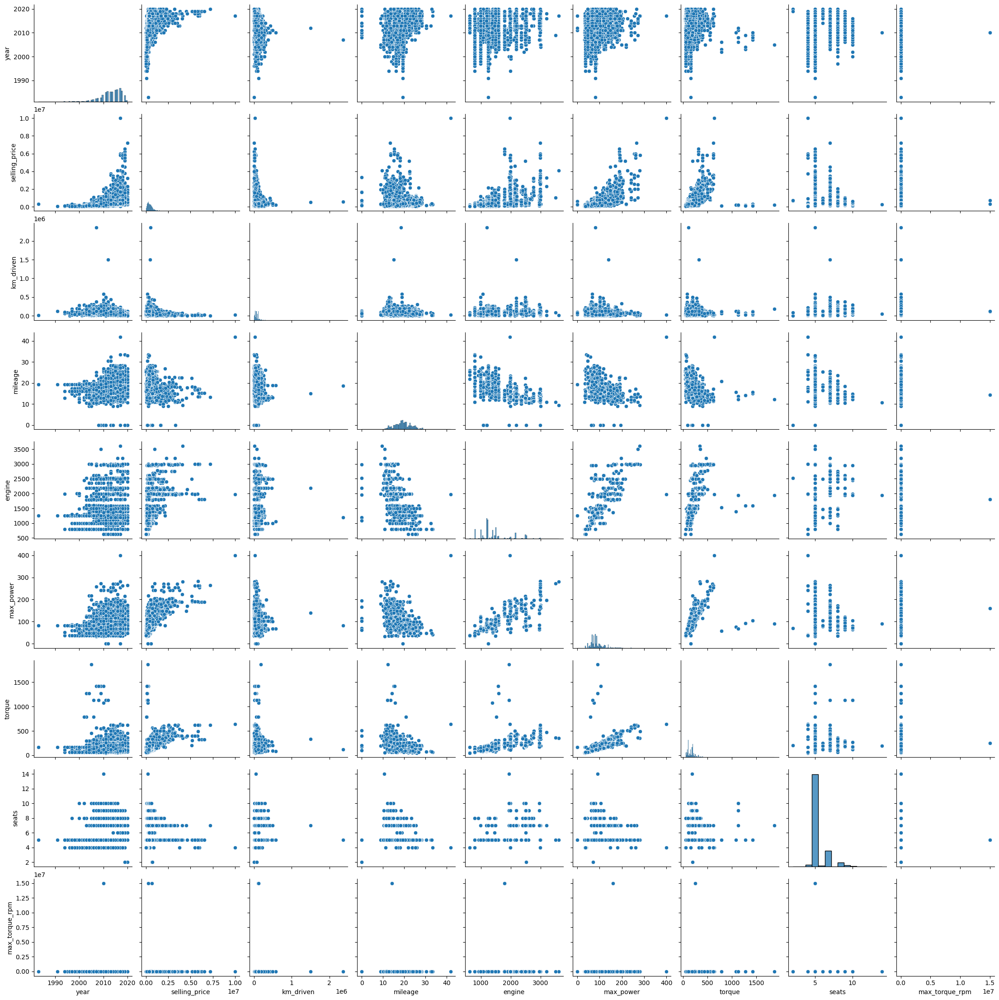

In [27]:
# your code here
sns.pairplot(df_train)
plt.show()

Этот график не такой информативный, как можно было бы построить, беря признаки по отдельности. Но он позволяет сделать некоторые (возможно, далеко идущие) выводы. Впрочем, со многими из них (если не со всеми) вы бы справились умозрительно. Однако всегда приятно делать выводы, основываясь на данных.



* <font color='#FF6600'> Что можно сказать о связи предикторов с целевой переменной?
* А о корреляциях признаков? </font>

In [28]:
print("Целевая переменная имеет довольно выраженную зависимость от некоторых предикторов, которая " \
      "напоминает линейную. Например, с увеличением признака 'year' максимальное значение целевой переменной " \
      "растет квадратично. А с увеличением признака 'km_driven' потолок цен наоборот резко" \
      "падает. Расход топлива, 'mileage', не показывает какой-либо выраженной корреляции с целевой переменной. " \
      "Максимальная стоимость показывает прямую линейную зависимость от признаков, характеризующих " \
      "в том или ином виде мощностные характеристики автомобиля: объем двигателя ('engine'), " \
      "максимальная мощность ('max_power') и крутящий момент ('torque'). Все эти связи вполне закономерны." \
      "Так, чем более новый автомобиль, тем дороже он будет стоить, и наоборот, чем больше у автомобиля пробег, " \
      "тем он дешевле." \
      "Видна так же зависимость цены от количества сидений: чем меньше мест, тем больше диапазон цен, а " \
      "автомобили с большим количеством мест продаются за очень близкие суммы.")

Целевая переменная имеет довольно выраженную зависимость от некоторых предикторов, которая напоминает линейную. Например, с увеличением признака 'year' максимальное значение целевой переменной растет квадратично. А с увеличением признака 'km_driven' потолок цен наоборот резкопадает. Расход топлива, 'mileage', не показывает какой-либо выраженной корреляции с целевой переменной. Максимальная стоимость показывает прямую линейную зависимость от признаков, характеризующих в том или ином виде мощностные характеристики автомобиля: объем двигателя ('engine'), максимальная мощность ('max_power') и крутящий момент ('torque'). Все эти связи вполне закономерны.Так, чем более новый автомобиль, тем дороже он будет стоить, и наоборот, чем больше у автомобиля пробег, тем он дешевле.Видна так же зависимость цены от количества сидений: чем меньше мест, тем больше диапазон цен, а автомобили с большим количеством мест продаются за очень близкие суммы.


In [29]:
print("Среди признаков наиболее явно коррелируют между собой те же мощностные характеристики: " \
      "объем двигателя ('engine'), максимальная мощность ('max_power'), крутящий момент ('torque') и " \
      "расход топлива ('mileage'). Попарно между этими признаками наблюдаются линейные корреляции, " \
      "где-то в меньше степени ('mileage' и 'torque'), где-то в большей ('torque' и 'max_power', 'torque' " \
      "и 'engine'). Так же видна корреляция признака 'seats' и признаков 'mileage' и 'max_power': чем " \
      "меньше количество сидений, тем больший диапазон значений может принимать расход топлива и макс. мощность. " \
      "Видимо это связано с тем, что спортивные автомобили с многомощными и прожорливыми двигателями " \
      "как правило имеют 2, максимум 4 места для пассажиров.")

Среди признаков наиболее явно коррелируют между собой те же мощностные характеристики: объем двигателя ('engine'), максимальная мощность ('max_power'), крутящий момент ('torque') и расход топлива ('mileage'). Попарно между этими признаками наблюдаются линейные корреляции, где-то в меньше степени ('mileage' и 'torque'), где-то в большей ('torque' и 'max_power', 'torque' и 'engine'). Так же видна корреляция признака 'seats' и признаков 'mileage' и 'max_power': чем меньше количество сидений, тем больший диапазон значений может принимать расход топлива и макс. мощность. Видимо это связано с тем, что спортивные автомобили с многомощными и прожорливыми двигателями как правило имеют 2, максимум 4 места для пассажиров.


(0.25 балла) <font color='#9933CC'>Постройте pairplot по тестовым данным</font> и ответьте на вопрос <font color='#FF6600'>"Похожими ли оказались совокупности при разделении на трейн и тест?"</font>

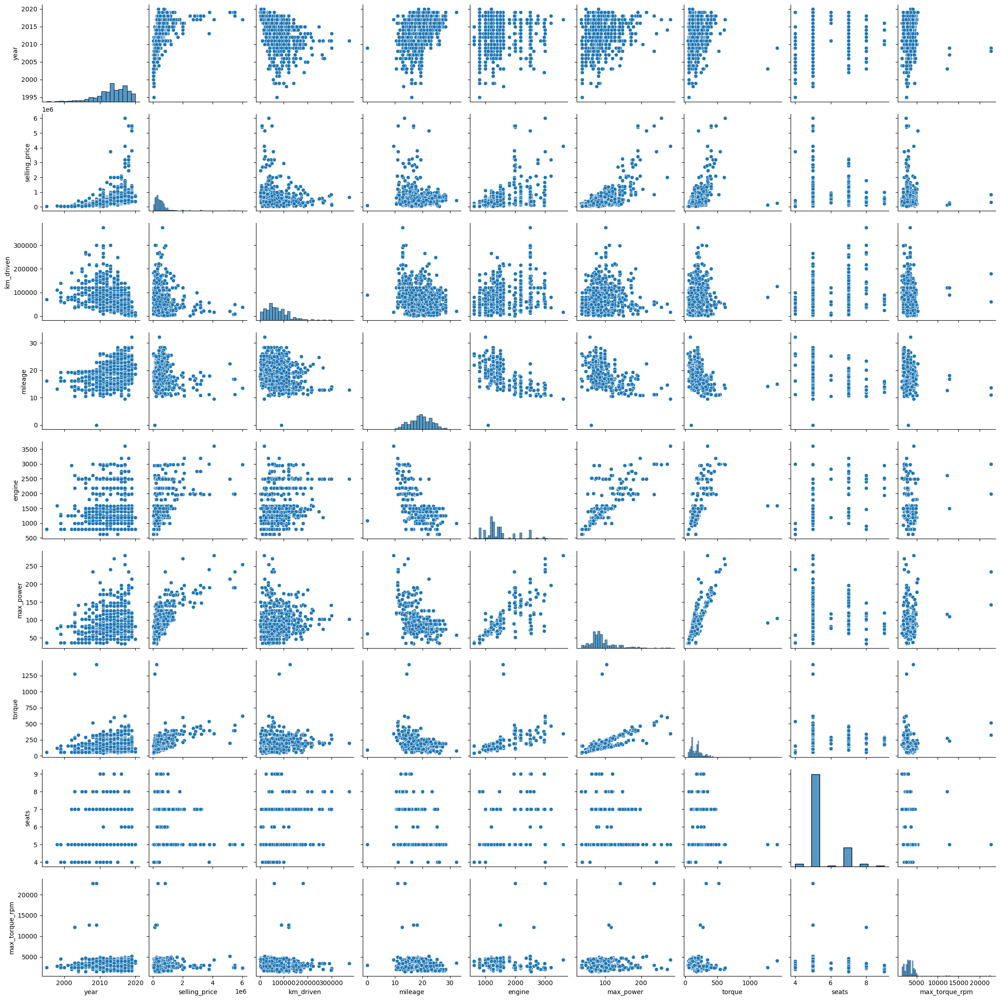

In [30]:
# your code here
sns.pairplot(df_test)
plt.show()

In [31]:
print("Да, совокупности очень похожи, все зависимости и корреляции аналогичны тренировочному набору.")

Да, совокупности очень похожи, все зависимости и корреляции аналогичны тренировочному набору.


(0.25 балла) <font color='#9933CC'>Для трейна давайте построим тепловую карту (heatmap из библиотеки seaborn) попарных корреляций числовых колонок</font>

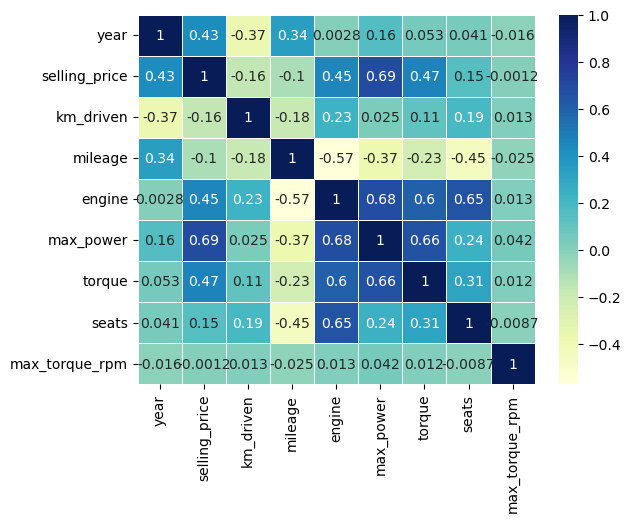

In [32]:
# your code here
sns.heatmap(df_train.corr(numeric_only=True), cmap="YlGnBu", annot=True, linewidth=0.5)
plt.show()

Ответьте, пожалуйста, на вопросы: 
* <font color='#FF6600'>Какие 2 признака наименее скоррелированы между собой?</font>
* <font color='#FF6600'>Между какими наблюдается довольно сильная положительная линейная зависимость?</font>
* <font color='#FF6600'>Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.</font>

### Ответ

- Наименее скоррелированы между собой признак "max_torque_rpm" и целевая переменная "selling_price", для которых коэффициент корреляции -0.0012. Если же не брать в расчет целевую переменную, то наименее скоррелированными окажутся признаки "year" и "engine" (0.0028)

- Целевая переменная сильнее всего положительно зависит от признака "max_power". Что касается непосредственно признаков, то наиболее сильно на общем фоне своей положительной корреляцией между собой отличаются признаки "engine", "max_power" и "torque", а так же "engine" и "seats".

- Да, так утверждать можно. У признаков "year" и "km_driven" довольно заметный отрицательный коэффициент корреляции -0.37.

(0.25 балла) <font color='#9933CC'> Отобразите диаграммe рассеяния для наиболее скореллированной пары **признаков** (на трейне) </font>

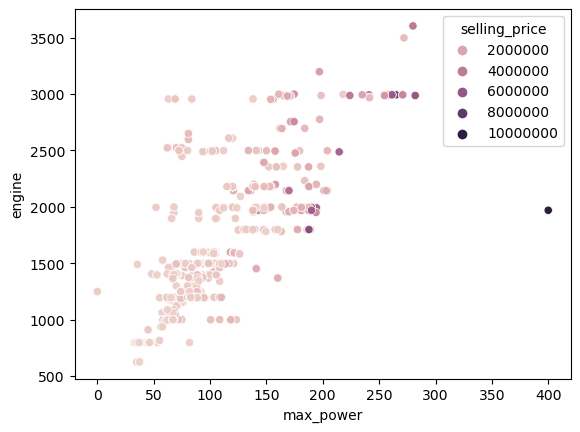

In [33]:
# your code here
sns.scatterplot(df_train, x="max_power", y="engine", hue="selling_price")
plt.show()

### Дополнительные визуализации (бонус 0.5 балла)

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [34]:
# your code here

# Часть 2 (1.25 балла) | Модель только на вещественных признаках

(0.05 балла) <font color='#9933CC'>В переменные ``y_train`` и ``y_test`` запишите значения целевых переменных. Столбцы ``selling_price`` из датафреймов необходимо удалить. Категориальные (все, кроме ``seats``) столбцы тоже.</font>

In [35]:
y_train = df_train["selling_price"]
X_train = df_train.drop(columns=["selling_price", "name", "fuel", "seller_type", "transmission", "owner"])

In [36]:
# Т.к. в части EDA я не удалил torque, a разбил на два столбца, то меняю assert соответствующим образом
# assert X_train.shape == (5840, 6)
assert X_train.shape == (5840, 8)

In [37]:
y_test = df_test["selling_price"]
X_test = df_test.drop(columns=["selling_price", "name", "fuel", "seller_type", "transmission", "owner"])

In [38]:
# Т.к. в части EDA я не удалил torque, a разбил на два столбца, то меняю assert соответствующим образом
# assert X_test.shape == (1000, 6)
assert X_test.shape == (1000, 8)

(0.2 балла) <font color='#9933CC'>Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и MSE для трейна и для теста</font>

**Замечание:** $R^2$ и MSE для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [39]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score as R2
from sklearn.metrics import mean_squared_error as MSE

# your code here
lr = LinearRegression()
lr.fit(X_train, y_train)

pred_train = lr.predict(X_train)
pred_test = lr.predict(X_test)

In [40]:
mse_train, r2_train = MSE(y_train, pred_train), R2(y_train, pred_train)
mse_test, r2_test = MSE(y_test, pred_test), R2(y_test, pred_test)

In [41]:
print(f"MSE train {mse_train}; R2 train: {r2_train}.")
print(f"MSE test {mse_test}; R2 test {r2_test}.")

MSE train 116487192746.16118; R2 train: 0.5936091682169907.
MSE test 232795188932.30057; R2 test 0.5950180507756054.


Запомните правило:

> Использую линейную модель -- стандартизирую фичи

(0.25 балла) <font color='#9933CC'>Воспользуемся им</font>


In [42]:
from sklearn.preprocessing import StandardScaler

# your code here

standard_scaler = StandardScaler()
standard_scaler.fit(X_train)
X_train = pd.DataFrame(standard_scaler.transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(standard_scaler.transform(X_test), columns=X_test.columns)

X_train.sample(5)

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
186,1.116306,-0.398765,2.250373,-0.373643,-0.438918,0.135466,-0.434419,-0.022547
5582,1.360490,-0.648491,-0.735352,0.130865,-0.565982,0.182203,1.601702,-0.021827
2669,-0.348799,0.100685,0.278289,0.347083,0.496042,0.696309,-0.434419,-0.020746
921,0.872122,-0.065798,-0.484450,-0.116241,0.100944,-0.425378,1.601702,-0.015342
733,-1.081351,2.098488,-1.663686,2.192143,0.445469,0.229874,1.601702,-0.017503


In [43]:
lr = LinearRegression()
lr.fit(X_train, y_train)

pred_train = lr.predict(X_train)
pred_test = lr.predict(X_test)

mse_train, r2_train = MSE(y_train, pred_train), R2(y_train, pred_train)
mse_test, r2_test = MSE(y_test, pred_test), R2(y_test, pred_test)

print(f"MSE train {mse_train}; R2 train: {r2_train}.")
print(f"MSE test {mse_test}; R2 test {r2_test}.")

MSE train 116487192746.16113; R2 train: 0.5936091682169908.
MSE test 232795188932.313; R2 test 0.5950180507755838.


Не очень результативно.

Зато уже сейчас можем интерпретировать модель. <font color='#FF6600'>"Какой признак оказался наиболее информативным в предсказании цены?"</font>

In [44]:
# your code here
for i in range(X_train.shape[1]):
    print(f"{lr.feature_names_in_[i]}: {lr.coef_[i]}")

year: 154835.89676217665
km_driven: -44339.349025177915
mileage: 23952.231175924637
engine: 54027.34993225644
max_power: 311828.3271775526
torque: 22342.372766957018
seats: -25224.164426242518
max_torque_rpm: -11486.047712923202


### Ответ

Исходя из подобранных коэффициентов, можем считать самым информативным признаком признак 'max_power', так как он имеет самый большой по модулю вес в модели. Это соответствует матрице корреляции, визуализированной выше.

(0.25 балла) <font color='#9933CC'>Теперь попробуем Lasso-регрессию.</font> Здесь и дальше обучайте модели на нормализованных признаках

In [45]:
from sklearn.linear_model import Lasso

# your code here

l1_lr = Lasso(alpha=1)
l1_lr.fit(X_train, y_train)

pred_train = l1_lr.predict(X_train)
pred_test = l1_lr.predict(X_test)

mse_train, r2_train = MSE(y_train, pred_train), R2(y_train, pred_train)
mse_test, r2_test = MSE(y_test, pred_test), R2(y_test, pred_test)

print(f"MSE train {mse_train}; R2 train: {r2_train}.")
print(f"MSE test {mse_test}; R2 test {r2_test}.")

MSE train 116487192757.11906; R2 train: 0.5936091681787616.
MSE test 232795880763.04; R2 test 0.5950168472328574.


<font color='#FF6600'>Занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Почему же?</font>

### Ответ

In [46]:
# your code here
print("Веса Lasso модели с параметрами по умолчанию!")
print()
for i in range(X_train.shape[1]):
    print(f"{l1_lr.feature_names_in_[i]}: {l1_lr.coef_[i]}")

Веса Lasso модели с параметрами по умолчанию!

year: 154835.73761599947
km_driven: -44338.23349968879
mileage: 23950.404534885314
engine: 54022.73475156223
max_power: 311829.2268806792
torque: 22342.08411826729
seats: -25221.30697084137
max_torque_rpm: -11485.057312759973


In [47]:
# Попробуем заставить зануляться веса при значениях alpha по умолчанию
# Для этого поделим целевую переменную на 10000, так как она принимает очень большие значения,
# Таким образом порядок весов сильно снизится, и L1 регуляризация должжна будет начать занулять некоторые из них

y_train_mod = y_train.apply(lambda x: x / 100000)
y_test_mod = y_test.apply(lambda x: x / 100000)

l1_lr = Lasso(alpha=0.1)
l1_lr.fit(X_train, y_train_mod)

pred_train = l1_lr.predict(X_train)
pred_test = l1_lr.predict(X_test)

mse_train, r2_train = MSE(y_train_mod, pred_train), R2(y_train_mod, pred_train)
mse_test, r2_test = MSE(y_test_mod, pred_test), R2(y_test_mod, pred_test)


print(f"MSE train {mse_train}; R2 train: {r2_train}.")
print(f"MSE test {mse_test}; R2 test {r2_test}.")
print("-"*40)
print("Веса модели с модифицированной целевой переменной:")
print()
for i in range(X_train.shape[1]):
    print(f"{l1_lr.feature_names_in_[i]}: {l1_lr.coef_[i]}")

MSE train 11.749014108022523; R2 train: 0.5901101654673592.
MSE test 24.03649423482852; R2 test 0.5818493357879214.
----------------------------------------
Веса модели с модифицированной целевой переменной:

year: 1.5342350761086976
km_driven: -0.33078912021378104
mileage: 0.05496322387525735
engine: 0.10532151873014918
max_power: 3.1978239521299643
torque: 0.19528389614191619
seats: -0.0
max_torque_rpm: -0.016066853219112116


Нет, никакие веса не занулились, потому что ни один из весов не близок к нулю. Это означает, что все признаки достаточно информативны. При этом стоит отметить, что большое значение весов по модулю, кажется, обусловлено большим значением целевой переменной (ее значения колеблются в пределах сотен тысяч) и очень малым значением признаков (они стандартизированы). С параметром $alpha=1$, который выставлен по умолчанию они лишь немного уменьшились.

Тем не менее, если мы увеличим alpha соразмерно значениям весов, то веса начнут зануляться. В частности, если взять $alpha=10000$, то получим первый нулевой коэффициент для признака 'seats'. Это, кстати, показалось мне странным, так как признак 'seats' хоть и имеет относительно небольшую корреляцию с целевой переменной, но далеко не самую маленькую. На порядок меньшее влияние на целевую переменную оказывает 'max_torue_rpm', и, кажется, он должен был занулиться первым.

Другой способ занулить веса при помощи L1 регуляризации - это сделать их изначально меньше. Так, если мы снизим порядок целевой переменной, поделив ее на $100000$, мы не потеряем в качестве модели (судя по метрикам), но Lasso начнет занулять веса даже при коэффициенте $alpha=0.1$, так как сами веса будут небольшими по модулю.

(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии</font>

Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

In [48]:
from sklearn.model_selection import GridSearchCV

# your code here

lasso = Lasso()
grid = {'alpha': np.arange(1, 100001, 100)}
lasso_cv = GridSearchCV(lasso, param_grid=grid, cv=10, scoring='r2', n_jobs=2, verbose=3)
lasso_cv.fit(X_train, y_train)

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits
[CV 1/10] END ..........................alpha=1;, score=0.562 total time=   0.0s
[CV 3/10] END ..........................alpha=1;, score=0.648 total time=   0.0s
[CV 4/10] END ..........................alpha=1;, score=0.584 total time=   0.0s
[CV 5/10] END ..........................alpha=1;, score=0.425 total time=   0.0s
[CV 6/10] END ..........................alpha=1;, score=0.662 total time=   0.0s
[CV 7/10] END ..........................alpha=1;, score=0.474 total time=   0.0s
[CV 8/10] END ..........................alpha=1;, score=0.627 total time=   0.0s
[CV 9/10] END ..........................alpha=1;, score=0.548 total time=   0.0s
[CV 10/10] END .........................alpha=1;, score=0.569 total time=   0.0s
[CV 1/10] END ........................alpha=101;, score=0.562 total time=   0.0s
[CV 2/10] END ........................alpha=101;, score=0.591 total time=   0.0s
[CV 3/10] END ........................alph

[CV 1/10] END .......................alpha=1601;, score=0.560 total time=   0.0s
[CV 2/10] END .......................alpha=1601;, score=0.590 total time=   0.0s
[CV 3/10] END .......................alpha=1601;, score=0.647 total time=   0.0s
[CV 4/10] END .......................alpha=1601;, score=0.585 total time=   0.0s
[CV 7/10] END .......................alpha=1901;, score=0.475 total time=   0.0s
[CV 8/10] END .......................alpha=1901;, score=0.627 total time=   0.0s
[CV 9/10] END .......................alpha=1901;, score=0.549 total time=   0.0s
[CV 10/10] END ......................alpha=1901;, score=0.570 total time=   0.0s
[CV 1/10] END .......................alpha=2001;, score=0.560 total time=   0.0s
[CV 2/10] END .......................alpha=2001;, score=0.589 total time=   0.0s
[CV 3/10] END .......................alpha=2001;, score=0.647 total time=   0.0s
[CV 4/10] END .......................alpha=2001;, score=0.585 total time=   0.0s
[CV 5/10] END ..............

[CV 10/10] END ......................alpha=3801;, score=0.570 total time=   0.0s
[CV 1/10] END .......................alpha=3901;, score=0.557 total time=   0.0s
[CV 2/10] END .......................alpha=3901;, score=0.588 total time=   0.0s
[CV 3/10] END .......................alpha=3901;, score=0.646 total time=   0.0s
[CV 4/10] END .......................alpha=3901;, score=0.586 total time=   0.0s
[CV 5/10] END .......................alpha=3901;, score=0.454 total time=   0.0s
[CV 6/10] END .......................alpha=3901;, score=0.657 total time=   0.0s
[CV 7/10] END .......................alpha=3901;, score=0.476 total time=   0.0s
[CV 8/10] END .......................alpha=3901;, score=0.626 total time=   0.0s
[CV 9/10] END .......................alpha=3901;, score=0.551 total time=   0.0s
[CV 10/10] END ......................alpha=3901;, score=0.570 total time=   0.0s
[CV 1/10] END .......................alpha=4001;, score=0.557 total time=   0.0s
[CV 2/10] END ..............

[CV 5/10] END .......................alpha=5501;, score=0.465 total time=   0.0s
[CV 6/10] END .......................alpha=5501;, score=0.655 total time=   0.0s
[CV 7/10] END .......................alpha=5501;, score=0.476 total time=   0.0s
[CV 8/10] END .......................alpha=5501;, score=0.626 total time=   0.0s
[CV 9/10] END .......................alpha=5501;, score=0.552 total time=   0.0s
[CV 10/10] END ......................alpha=5501;, score=0.570 total time=   0.0s
[CV 1/10] END .......................alpha=5601;, score=0.555 total time=   0.0s
[CV 2/10] END .......................alpha=5601;, score=0.586 total time=   0.0s
[CV 3/10] END .......................alpha=5601;, score=0.646 total time=   0.0s
[CV 4/10] END .......................alpha=5601;, score=0.587 total time=   0.0s
[CV 5/10] END .......................alpha=5601;, score=0.465 total time=   0.0s
[CV 6/10] END .......................alpha=5601;, score=0.655 total time=   0.0s
[CV 7/10] END ..............

[CV 4/10] END .......................alpha=7801;, score=0.587 total time=   0.0s
[CV 5/10] END .......................alpha=7801;, score=0.479 total time=   0.0s
[CV 6/10] END .......................alpha=7801;, score=0.652 total time=   0.0s
[CV 7/10] END .......................alpha=7801;, score=0.477 total time=   0.0s
[CV 8/10] END .......................alpha=7801;, score=0.627 total time=   0.0s
[CV 9/10] END .......................alpha=7801;, score=0.553 total time=   0.0s
[CV 10/10] END ......................alpha=7801;, score=0.570 total time=   0.0s
[CV 1/10] END .......................alpha=7901;, score=0.552 total time=   0.0s
[CV 2/10] END .......................alpha=7901;, score=0.584 total time=   0.0s
[CV 3/10] END .......................alpha=7901;, score=0.644 total time=   0.0s
[CV 4/10] END .......................alpha=7901;, score=0.587 total time=   0.0s
[CV 5/10] END .......................alpha=7901;, score=0.480 total time=   0.0s
[CV 6/10] END ..............

[CV 5/10] END .......................alpha=8801;, score=0.485 total time=   0.0s
[CV 6/10] END .......................alpha=8801;, score=0.651 total time=   0.0s
[CV 7/10] END .......................alpha=8801;, score=0.477 total time=   0.0s
[CV 8/10] END .......................alpha=8801;, score=0.627 total time=   0.0s
[CV 9/10] END .......................alpha=8801;, score=0.553 total time=   0.0s
[CV 10/10] END ......................alpha=8801;, score=0.570 total time=   0.0s
[CV 1/10] END .......................alpha=8901;, score=0.551 total time=   0.0s
[CV 2/10] END .......................alpha=8901;, score=0.584 total time=   0.0s
[CV 3/10] END .......................alpha=8901;, score=0.643 total time=   0.0s
[CV 4/10] END .......................alpha=8901;, score=0.587 total time=   0.0s
[CV 5/10] END .......................alpha=8901;, score=0.485 total time=   0.0s
[CV 6/10] END .......................alpha=8901;, score=0.651 total time=   0.0s
[CV 7/10] END ..............

[CV 4/10] END ......................alpha=11101;, score=0.587 total time=   0.0s
[CV 5/10] END ......................alpha=11101;, score=0.497 total time=   0.0s
[CV 6/10] END ......................alpha=11101;, score=0.649 total time=   0.0s
[CV 7/10] END ......................alpha=11101;, score=0.477 total time=   0.0s
[CV 8/10] END ......................alpha=11101;, score=0.626 total time=   0.0s
[CV 9/10] END ......................alpha=11101;, score=0.555 total time=   0.0s
[CV 10/10] END .....................alpha=11101;, score=0.570 total time=   0.0s
[CV 1/10] END ......................alpha=11201;, score=0.548 total time=   0.0s
[CV 2/10] END ......................alpha=11201;, score=0.583 total time=   0.0s
[CV 3/10] END ......................alpha=11201;, score=0.642 total time=   0.0s
[CV 4/10] END ......................alpha=11201;, score=0.587 total time=   0.0s
[CV 5/10] END ......................alpha=11201;, score=0.498 total time=   0.0s
[CV 6/10] END ..............

[CV 3/10] END ......................alpha=13401;, score=0.641 total time=   0.0s
[CV 4/10] END ......................alpha=13401;, score=0.587 total time=   0.0s
[CV 5/10] END ......................alpha=13401;, score=0.509 total time=   0.0s
[CV 6/10] END ......................alpha=13401;, score=0.648 total time=   0.0s
[CV 7/10] END ......................alpha=13401;, score=0.478 total time=   0.0s
[CV 8/10] END ......................alpha=13401;, score=0.626 total time=   0.0s
[CV 9/10] END ......................alpha=13401;, score=0.556 total time=   0.0s
[CV 10/10] END .....................alpha=13401;, score=0.569 total time=   0.0s
[CV 1/10] END ......................alpha=13501;, score=0.546 total time=   0.0s
[CV 2/10] END ......................alpha=13501;, score=0.583 total time=   0.0s
[CV 3/10] END ......................alpha=13501;, score=0.641 total time=   0.0s
[CV 4/10] END ......................alpha=13501;, score=0.587 total time=   0.0s
[CV 5/10] END ..............

[CV 6/10] END ......................alpha=15801;, score=0.646 total time=   0.0s
[CV 7/10] END ......................alpha=15801;, score=0.477 total time=   0.0s
[CV 8/10] END ......................alpha=15801;, score=0.626 total time=   0.0s
[CV 9/10] END ......................alpha=15801;, score=0.558 total time=   0.0s
[CV 10/10] END .....................alpha=15801;, score=0.568 total time=   0.0s
[CV 1/10] END ......................alpha=15901;, score=0.544 total time=   0.0s
[CV 2/10] END ......................alpha=15901;, score=0.584 total time=   0.0s
[CV 3/10] END ......................alpha=15901;, score=0.639 total time=   0.0s
[CV 4/10] END ......................alpha=15901;, score=0.588 total time=   0.0s
[CV 5/10] END ......................alpha=15901;, score=0.520 total time=   0.0s
[CV 6/10] END ......................alpha=15901;, score=0.646 total time=   0.0s
[CV 7/10] END ......................alpha=15901;, score=0.477 total time=   0.0s
[CV 8/10] END ..............

[CV 10/10] END .....................alpha=20201;, score=0.567 total time=   0.0s
[CV 1/10] END ......................alpha=20301;, score=0.539 total time=   0.0s
[CV 2/10] END ......................alpha=20301;, score=0.584 total time=   0.0s
[CV 3/10] END ......................alpha=20301;, score=0.637 total time=   0.0s
[CV 4/10] END ......................alpha=20301;, score=0.588 total time=   0.0s
[CV 5/10] END ......................alpha=20301;, score=0.535 total time=   0.0s
[CV 6/10] END ......................alpha=20301;, score=0.644 total time=   0.0s
[CV 7/10] END ......................alpha=20301;, score=0.477 total time=   0.0s
[CV 8/10] END ......................alpha=20301;, score=0.626 total time=   0.0s
[CV 9/10] END ......................alpha=20301;, score=0.562 total time=   0.0s
[CV 10/10] END .....................alpha=20301;, score=0.567 total time=   0.0s
[CV 1/10] END ......................alpha=20401;, score=0.539 total time=   0.0s
[CV 2/10] END ..............

[CV 5/10] END ......................alpha=21401;, score=0.539 total time=   0.0s
[CV 6/10] END ......................alpha=21401;, score=0.643 total time=   0.0s
[CV 7/10] END ......................alpha=21401;, score=0.477 total time=   0.0s
[CV 8/10] END ......................alpha=21401;, score=0.626 total time=   0.0s
[CV 9/10] END ......................alpha=21401;, score=0.562 total time=   0.0s
[CV 10/10] END .....................alpha=21401;, score=0.566 total time=   0.0s
[CV 1/10] END ......................alpha=21501;, score=0.538 total time=   0.0s
[CV 2/10] END ......................alpha=21501;, score=0.584 total time=   0.0s
[CV 3/10] END ......................alpha=21501;, score=0.636 total time=   0.0s
[CV 4/10] END ......................alpha=21501;, score=0.588 total time=   0.0s
[CV 5/10] END ......................alpha=21501;, score=0.539 total time=   0.0s
[CV 6/10] END ......................alpha=21501;, score=0.643 total time=   0.0s
[CV 7/10] END ..............

[CV 9/10] END ......................alpha=25801;, score=0.565 total time=   0.0s
[CV 10/10] END .....................alpha=25801;, score=0.564 total time=   0.0s
[CV 1/10] END ......................alpha=25901;, score=0.533 total time=   0.0s
[CV 2/10] END ......................alpha=25901;, score=0.585 total time=   0.0s
[CV 3/10] END ......................alpha=25901;, score=0.633 total time=   0.0s
[CV 4/10] END ......................alpha=25901;, score=0.588 total time=   0.0s
[CV 5/10] END ......................alpha=25901;, score=0.551 total time=   0.0s
[CV 6/10] END ......................alpha=25901;, score=0.640 total time=   0.0s
[CV 7/10] END ......................alpha=25901;, score=0.475 total time=   0.0s
[CV 8/10] END ......................alpha=25901;, score=0.625 total time=   0.0s
[CV 9/10] END ......................alpha=25901;, score=0.565 total time=   0.0s
[CV 10/10] END .....................alpha=25901;, score=0.564 total time=   0.0s
[CV 1/10] END ..............

[CV 10/10] END .....................alpha=29501;, score=0.562 total time=   0.0s
[CV 1/10] END ......................alpha=29601;, score=0.528 total time=   0.0s
[CV 2/10] END ......................alpha=29601;, score=0.584 total time=   0.0s
[CV 3/10] END ......................alpha=29601;, score=0.630 total time=   0.0s
[CV 4/10] END ......................alpha=29601;, score=0.588 total time=   0.0s
[CV 5/10] END ......................alpha=29601;, score=0.560 total time=   0.0s
[CV 6/10] END ......................alpha=29601;, score=0.637 total time=   0.0s
[CV 7/10] END ......................alpha=29601;, score=0.474 total time=   0.0s
[CV 8/10] END ......................alpha=29601;, score=0.624 total time=   0.0s
[CV 9/10] END ......................alpha=29601;, score=0.566 total time=   0.0s
[CV 10/10] END .....................alpha=29601;, score=0.562 total time=   0.0s
[CV 1/10] END ......................alpha=29701;, score=0.528 total time=   0.0s
[CV 2/10] END ..............

[CV 6/10] END ......................alpha=32701;, score=0.635 total time=   0.0s
[CV 7/10] END ......................alpha=32701;, score=0.473 total time=   0.0s
[CV 8/10] END ......................alpha=32701;, score=0.623 total time=   0.0s
[CV 9/10] END ......................alpha=32701;, score=0.567 total time=   0.0s
[CV 10/10] END .....................alpha=32701;, score=0.561 total time=   0.0s
[CV 1/10] END ......................alpha=32801;, score=0.525 total time=   0.0s
[CV 2/10] END ......................alpha=32801;, score=0.584 total time=   0.0s
[CV 3/10] END ......................alpha=32801;, score=0.627 total time=   0.0s
[CV 4/10] END ......................alpha=32801;, score=0.587 total time=   0.0s
[CV 5/10] END ......................alpha=32801;, score=0.567 total time=   0.0s
[CV 6/10] END ......................alpha=32801;, score=0.635 total time=   0.0s
[CV 7/10] END ......................alpha=32801;, score=0.473 total time=   0.0s
[CV 8/10] END ..............

[CV 5/10] END ......................alpha=35001;, score=0.571 total time=   0.0s
[CV 6/10] END ......................alpha=35001;, score=0.633 total time=   0.0s
[CV 7/10] END ......................alpha=35001;, score=0.472 total time=   0.0s
[CV 8/10] END ......................alpha=35001;, score=0.622 total time=   0.0s
[CV 9/10] END ......................alpha=35001;, score=0.568 total time=   0.0s
[CV 10/10] END .....................alpha=35001;, score=0.559 total time=   0.0s
[CV 1/10] END ......................alpha=35101;, score=0.522 total time=   0.0s
[CV 2/10] END ......................alpha=35101;, score=0.583 total time=   0.0s
[CV 3/10] END ......................alpha=35101;, score=0.625 total time=   0.0s
[CV 4/10] END ......................alpha=35101;, score=0.587 total time=   0.0s
[CV 5/10] END ......................alpha=35101;, score=0.571 total time=   0.0s
[CV 6/10] END ......................alpha=35101;, score=0.633 total time=   0.0s
[CV 7/10] END ..............

[CV 10/10] END .....................alpha=36101;, score=0.559 total time=   0.0s
[CV 1/10] END ......................alpha=36201;, score=0.521 total time=   0.0s
[CV 2/10] END ......................alpha=36201;, score=0.583 total time=   0.0s
[CV 3/10] END ......................alpha=36201;, score=0.624 total time=   0.0s
[CV 4/10] END ......................alpha=36201;, score=0.587 total time=   0.0s
[CV 5/10] END ......................alpha=36201;, score=0.573 total time=   0.0s
[CV 6/10] END ......................alpha=36201;, score=0.632 total time=   0.0s
[CV 7/10] END ......................alpha=36201;, score=0.471 total time=   0.0s
[CV 8/10] END ......................alpha=36201;, score=0.622 total time=   0.0s
[CV 9/10] END ......................alpha=36201;, score=0.568 total time=   0.0s
[CV 10/10] END .....................alpha=36201;, score=0.559 total time=   0.0s
[CV 1/10] END ......................alpha=36301;, score=0.520 total time=   0.0s
[CV 2/10] END ..............

[CV 4/10] END ......................alpha=40601;, score=0.585 total time=   0.0s
[CV 5/10] END ......................alpha=40601;, score=0.580 total time=   0.0s
[CV 6/10] END ......................alpha=40601;, score=0.628 total time=   0.0s
[CV 7/10] END ......................alpha=40601;, score=0.469 total time=   0.0s
[CV 8/10] END ......................alpha=40601;, score=0.621 total time=   0.0s
[CV 9/10] END ......................alpha=40601;, score=0.569 total time=   0.0s
[CV 10/10] END .....................alpha=40601;, score=0.556 total time=   0.0s
[CV 1/10] END ......................alpha=40701;, score=0.515 total time=   0.0s
[CV 2/10] END ......................alpha=40701;, score=0.583 total time=   0.0s
[CV 3/10] END ......................alpha=40701;, score=0.621 total time=   0.0s
[CV 4/10] END ......................alpha=40701;, score=0.585 total time=   0.0s
[CV 5/10] END ......................alpha=40701;, score=0.580 total time=   0.0s
[CV 6/10] END ..............

[CV 9/10] END ......................alpha=41701;, score=0.569 total time=   0.0s
[CV 10/10] END .....................alpha=41701;, score=0.556 total time=   0.0s
[CV 1/10] END ......................alpha=41801;, score=0.514 total time=   0.0s
[CV 2/10] END ......................alpha=41801;, score=0.582 total time=   0.0s
[CV 3/10] END ......................alpha=41801;, score=0.620 total time=   0.0s
[CV 4/10] END ......................alpha=41801;, score=0.585 total time=   0.0s
[CV 5/10] END ......................alpha=41801;, score=0.581 total time=   0.0s
[CV 6/10] END ......................alpha=41801;, score=0.627 total time=   0.0s
[CV 7/10] END ......................alpha=41801;, score=0.468 total time=   0.0s
[CV 8/10] END ......................alpha=41801;, score=0.621 total time=   0.0s
[CV 9/10] END ......................alpha=41801;, score=0.569 total time=   0.0s
[CV 10/10] END .....................alpha=41801;, score=0.556 total time=   0.0s
[CV 1/10] END ..............

[CV 3/10] END ......................alpha=46201;, score=0.618 total time=   0.0s
[CV 4/10] END ......................alpha=46201;, score=0.583 total time=   0.0s
[CV 5/10] END ......................alpha=46201;, score=0.586 total time=   0.0s
[CV 6/10] END ......................alpha=46201;, score=0.623 total time=   0.0s
[CV 7/10] END ......................alpha=46201;, score=0.466 total time=   0.0s
[CV 8/10] END ......................alpha=46201;, score=0.619 total time=   0.0s
[CV 9/10] END ......................alpha=46201;, score=0.570 total time=   0.0s
[CV 10/10] END .....................alpha=46201;, score=0.553 total time=   0.0s
[CV 1/10] END ......................alpha=46301;, score=0.508 total time=   0.0s
[CV 2/10] END ......................alpha=46301;, score=0.581 total time=   0.0s
[CV 3/10] END ......................alpha=46301;, score=0.618 total time=   0.0s
[CV 4/10] END ......................alpha=46301;, score=0.583 total time=   0.0s
[CV 5/10] END ..............

[CV 6/10] END ......................alpha=48601;, score=0.621 total time=   0.0s
[CV 7/10] END ......................alpha=48601;, score=0.464 total time=   0.0s
[CV 8/10] END ......................alpha=48601;, score=0.618 total time=   0.0s
[CV 7/10] END ......................alpha=49901;, score=0.463 total time=   0.0s
[CV 8/10] END ......................alpha=49901;, score=0.618 total time=   0.0s
[CV 9/10] END ......................alpha=49901;, score=0.570 total time=   0.0s
[CV 10/10] END .....................alpha=49901;, score=0.551 total time=   0.0s
[CV 1/10] END ......................alpha=50001;, score=0.503 total time=   0.0s
[CV 2/10] END ......................alpha=50001;, score=0.581 total time=   0.0s
[CV 3/10] END ......................alpha=50001;, score=0.616 total time=   0.0s
[CV 4/10] END ......................alpha=50001;, score=0.582 total time=   0.0s
[CV 5/10] END ......................alpha=50001;, score=0.589 total time=   0.0s
[CV 6/10] END ..............

[CV 2/10] END ......................alpha=51801;, score=0.580 total time=   0.0s
[CV 3/10] END ......................alpha=51801;, score=0.614 total time=   0.0s
[CV 4/10] END ......................alpha=51801;, score=0.581 total time=   0.0s
[CV 5/10] END ......................alpha=51801;, score=0.590 total time=   0.0s
[CV 6/10] END ......................alpha=51801;, score=0.618 total time=   0.0s
[CV 7/10] END ......................alpha=51801;, score=0.462 total time=   0.0s
[CV 8/10] END ......................alpha=51801;, score=0.617 total time=   0.0s
[CV 9/10] END ......................alpha=51801;, score=0.571 total time=   0.0s
[CV 10/10] END .....................alpha=51801;, score=0.550 total time=   0.0s
[CV 1/10] END ......................alpha=51901;, score=0.501 total time=   0.0s
[CV 2/10] END ......................alpha=51901;, score=0.580 total time=   0.0s
[CV 3/10] END ......................alpha=51901;, score=0.614 total time=   0.0s
[CV 4/10] END ..............

[CV 3/10] END ......................alpha=55501;, score=0.612 total time=   0.0s
[CV 4/10] END ......................alpha=55501;, score=0.580 total time=   0.0s
[CV 5/10] END ......................alpha=55501;, score=0.591 total time=   0.0s
[CV 6/10] END ......................alpha=55501;, score=0.615 total time=   0.0s
[CV 7/10] END ......................alpha=55501;, score=0.460 total time=   0.0s
[CV 8/10] END ......................alpha=55501;, score=0.616 total time=   0.0s
[CV 9/10] END ......................alpha=55501;, score=0.572 total time=   0.0s
[CV 10/10] END .....................alpha=55501;, score=0.548 total time=   0.0s
[CV 1/10] END ......................alpha=55601;, score=0.496 total time=   0.0s
[CV 2/10] END ......................alpha=55601;, score=0.580 total time=   0.0s
[CV 3/10] END ......................alpha=55601;, score=0.612 total time=   0.0s
[CV 4/10] END ......................alpha=55601;, score=0.580 total time=   0.0s
[CV 5/10] END ..............

[CV 1/10] END ......................alpha=57401;, score=0.494 total time=   0.0s
[CV 2/10] END ......................alpha=57401;, score=0.579 total time=   0.0s
[CV 3/10] END ......................alpha=57401;, score=0.611 total time=   0.0s
[CV 4/10] END ......................alpha=57401;, score=0.579 total time=   0.0s
[CV 5/10] END ......................alpha=57401;, score=0.591 total time=   0.0s
[CV 6/10] END ......................alpha=57401;, score=0.613 total time=   0.0s
[CV 7/10] END ......................alpha=57401;, score=0.458 total time=   0.0s
[CV 8/10] END ......................alpha=57401;, score=0.615 total time=   0.0s
[CV 9/10] END ......................alpha=57401;, score=0.572 total time=   0.0s
[CV 10/10] END .....................alpha=57401;, score=0.547 total time=   0.0s
[CV 1/10] END ......................alpha=57501;, score=0.493 total time=   0.0s
[CV 2/10] END ......................alpha=57501;, score=0.579 total time=   0.0s
[CV 3/10] END ..............

[CV 2/10] END ......................alpha=61101;, score=0.578 total time=   0.0s
[CV 3/10] END ......................alpha=61101;, score=0.608 total time=   0.0s
[CV 4/10] END ......................alpha=61101;, score=0.577 total time=   0.0s
[CV 5/10] END ......................alpha=61101;, score=0.591 total time=   0.0s
[CV 6/10] END ......................alpha=61101;, score=0.610 total time=   0.0s
[CV 7/10] END ......................alpha=61101;, score=0.456 total time=   0.0s
[CV 8/10] END ......................alpha=61101;, score=0.614 total time=   0.0s
[CV 9/10] END ......................alpha=61101;, score=0.572 total time=   0.0s
[CV 10/10] END .....................alpha=61101;, score=0.544 total time=   0.0s
[CV 1/10] END ......................alpha=61201;, score=0.488 total time=   0.0s
[CV 2/10] END ......................alpha=61201;, score=0.578 total time=   0.0s
[CV 3/10] END ......................alpha=61201;, score=0.608 total time=   0.0s
[CV 4/10] END ..............

[CV 8/10] END ......................alpha=64201;, score=0.612 total time=   0.0s
[CV 9/10] END ......................alpha=64201;, score=0.572 total time=   0.0s
[CV 10/10] END .....................alpha=64201;, score=0.542 total time=   0.0s
[CV 1/10] END ......................alpha=64301;, score=0.484 total time=   0.0s
[CV 2/10] END ......................alpha=64301;, score=0.577 total time=   0.0s
[CV 3/10] END ......................alpha=64301;, score=0.606 total time=   0.0s
[CV 4/10] END ......................alpha=64301;, score=0.576 total time=   0.0s
[CV 5/10] END ......................alpha=64301;, score=0.591 total time=   0.0s
[CV 6/10] END ......................alpha=64301;, score=0.607 total time=   0.0s
[CV 7/10] END ......................alpha=64301;, score=0.453 total time=   0.0s
[CV 8/10] END ......................alpha=64301;, score=0.612 total time=   0.0s
[CV 9/10] END ......................alpha=64301;, score=0.572 total time=   0.0s
[CV 10/10] END .............

[CV 9/10] END ......................alpha=67901;, score=0.571 total time=   0.0s
[CV 10/10] END .....................alpha=67901;, score=0.539 total time=   0.0s
[CV 1/10] END ......................alpha=68001;, score=0.479 total time=   0.0s
[CV 2/10] END ......................alpha=68001;, score=0.575 total time=   0.0s
[CV 3/10] END ......................alpha=68001;, score=0.603 total time=   0.0s
[CV 4/10] END ......................alpha=68001;, score=0.573 total time=   0.0s
[CV 5/10] END ......................alpha=68001;, score=0.591 total time=   0.0s
[CV 6/10] END ......................alpha=68001;, score=0.603 total time=   0.0s
[CV 7/10] END ......................alpha=68001;, score=0.450 total time=   0.0s
[CV 8/10] END ......................alpha=68001;, score=0.610 total time=   0.0s
[CV 9/10] END ......................alpha=68001;, score=0.571 total time=   0.0s
[CV 10/10] END .....................alpha=68001;, score=0.539 total time=   0.0s
[CV 1/10] END ..............

[CV 7/10] END ......................alpha=69801;, score=0.449 total time=   0.0s
[CV 8/10] END ......................alpha=69801;, score=0.609 total time=   0.0s
[CV 9/10] END ......................alpha=69801;, score=0.571 total time=   0.0s
[CV 10/10] END .....................alpha=69801;, score=0.538 total time=   0.0s
[CV 1/10] END ......................alpha=69901;, score=0.476 total time=   0.0s
[CV 2/10] END ......................alpha=69901;, score=0.574 total time=   0.0s
[CV 3/10] END ......................alpha=69901;, score=0.601 total time=   0.0s
[CV 4/10] END ......................alpha=69901;, score=0.572 total time=   0.0s
[CV 5/10] END ......................alpha=69901;, score=0.591 total time=   0.0s
[CV 6/10] END ......................alpha=69901;, score=0.601 total time=   0.0s
[CV 7/10] END ......................alpha=69901;, score=0.449 total time=   0.0s
[CV 8/10] END ......................alpha=69901;, score=0.609 total time=   0.0s
[CV 9/10] END ..............

[CV 8/10] END ......................alpha=73501;, score=0.607 total time=   0.0s
[CV 9/10] END ......................alpha=73501;, score=0.570 total time=   0.0s
[CV 10/10] END .....................alpha=73501;, score=0.535 total time=   0.0s
[CV 1/10] END ......................alpha=73601;, score=0.471 total time=   0.0s
[CV 2/10] END ......................alpha=73601;, score=0.572 total time=   0.0s
[CV 3/10] END ......................alpha=73601;, score=0.598 total time=   0.0s
[CV 4/10] END ......................alpha=73601;, score=0.570 total time=   0.0s
[CV 5/10] END ......................alpha=73601;, score=0.590 total time=   0.0s
[CV 6/10] END ......................alpha=73601;, score=0.597 total time=   0.0s
[CV 7/10] END ......................alpha=73601;, score=0.446 total time=   0.0s
[CV 8/10] END ......................alpha=73601;, score=0.607 total time=   0.0s
[CV 9/10] END ......................alpha=73601;, score=0.570 total time=   0.0s
[CV 10/10] END .............

[CV 6/10] END ......................alpha=75401;, score=0.595 total time=   0.0s
[CV 7/10] END ......................alpha=75401;, score=0.444 total time=   0.0s
[CV 8/10] END ......................alpha=75401;, score=0.606 total time=   0.0s
[CV 9/10] END ......................alpha=75401;, score=0.570 total time=   0.0s
[CV 10/10] END .....................alpha=75401;, score=0.533 total time=   0.0s
[CV 1/10] END ......................alpha=75501;, score=0.468 total time=   0.0s
[CV 2/10] END ......................alpha=75501;, score=0.571 total time=   0.0s
[CV 3/10] END ......................alpha=75501;, score=0.596 total time=   0.0s
[CV 4/10] END ......................alpha=75501;, score=0.569 total time=   0.0s
[CV 5/10] END ......................alpha=75501;, score=0.590 total time=   0.0s
[CV 6/10] END ......................alpha=75501;, score=0.595 total time=   0.0s
[CV 5/10] END ......................alpha=76801;, score=0.589 total time=   0.0s
[CV 6/10] END ..............

[CV 7/10] END ......................alpha=79101;, score=0.441 total time=   0.0s
[CV 8/10] END ......................alpha=79101;, score=0.603 total time=   0.0s
[CV 9/10] END ......................alpha=79101;, score=0.569 total time=   0.0s
[CV 10/10] END .....................alpha=79101;, score=0.530 total time=   0.0s
[CV 1/10] END ......................alpha=79201;, score=0.463 total time=   0.0s
[CV 2/10] END ......................alpha=79201;, score=0.569 total time=   0.0s
[CV 3/10] END ......................alpha=79201;, score=0.593 total time=   0.0s
[CV 4/10] END ......................alpha=79201;, score=0.566 total time=   0.0s
[CV 5/10] END ......................alpha=79201;, score=0.588 total time=   0.0s
[CV 6/10] END ......................alpha=79201;, score=0.590 total time=   0.0s
[CV 7/10] END ......................alpha=79201;, score=0.441 total time=   0.0s
[CV 8/10] END ......................alpha=79201;, score=0.603 total time=   0.0s
[CV 9/10] END ..............

[CV 3/10] END ......................alpha=82301;, score=0.590 total time=   0.0s
[CV 4/10] END ......................alpha=82301;, score=0.563 total time=   0.0s
[CV 5/10] END ......................alpha=82301;, score=0.587 total time=   0.0s
[CV 6/10] END ......................alpha=82301;, score=0.587 total time=   0.0s
[CV 7/10] END ......................alpha=82301;, score=0.438 total time=   0.0s
[CV 8/10] END ......................alpha=82301;, score=0.600 total time=   0.0s
[CV 9/10] END ......................alpha=82301;, score=0.567 total time=   0.0s
[CV 10/10] END .....................alpha=82301;, score=0.527 total time=   0.0s
[CV 1/10] END ......................alpha=82401;, score=0.458 total time=   0.0s
[CV 2/10] END ......................alpha=82401;, score=0.566 total time=   0.0s
[CV 3/10] END ......................alpha=82401;, score=0.589 total time=   0.0s
[CV 4/10] END ......................alpha=82401;, score=0.563 total time=   0.0s
[CV 5/10] END ..............

[CV 4/10] END ......................alpha=86001;, score=0.560 total time=   0.0s
[CV 5/10] END ......................alpha=86001;, score=0.586 total time=   0.0s
[CV 6/10] END ......................alpha=86001;, score=0.582 total time=   0.0s
[CV 7/10] END ......................alpha=86001;, score=0.434 total time=   0.0s
[CV 8/10] END ......................alpha=86001;, score=0.597 total time=   0.0s
[CV 9/10] END ......................alpha=86001;, score=0.565 total time=   0.0s
[CV 10/10] END .....................alpha=86001;, score=0.524 total time=   0.0s
[CV 1/10] END ......................alpha=86101;, score=0.452 total time=   0.0s
[CV 2/10] END ......................alpha=86101;, score=0.563 total time=   0.0s
[CV 3/10] END ......................alpha=86101;, score=0.586 total time=   0.0s
[CV 4/10] END ......................alpha=86101;, score=0.560 total time=   0.0s
[CV 5/10] END ......................alpha=86101;, score=0.586 total time=   0.0s
[CV 6/10] END ..............

[CV 2/10] END ......................alpha=87901;, score=0.562 total time=   0.0s
[CV 3/10] END ......................alpha=87901;, score=0.584 total time=   0.0s
[CV 4/10] END ......................alpha=87901;, score=0.559 total time=   0.0s
[CV 5/10] END ......................alpha=87901;, score=0.585 total time=   0.0s
[CV 6/10] END ......................alpha=87901;, score=0.580 total time=   0.0s
[CV 7/10] END ......................alpha=87901;, score=0.432 total time=   0.0s
[CV 8/10] END ......................alpha=87901;, score=0.595 total time=   0.0s
[CV 9/10] END ......................alpha=87901;, score=0.564 total time=   0.0s
[CV 10/10] END .....................alpha=87901;, score=0.522 total time=   0.0s
[CV 1/10] END ......................alpha=88001;, score=0.449 total time=   0.0s
[CV 2/10] END ......................alpha=88001;, score=0.562 total time=   0.0s
[CV 3/10] END ......................alpha=88001;, score=0.584 total time=   0.0s
[CV 4/10] END ..............

[CV 3/10] END ......................alpha=91601;, score=0.579 total time=   0.0s
[CV 4/10] END ......................alpha=91601;, score=0.555 total time=   0.0s
[CV 5/10] END ......................alpha=91601;, score=0.583 total time=   0.0s
[CV 6/10] END ......................alpha=91601;, score=0.575 total time=   0.0s
[CV 7/10] END ......................alpha=91601;, score=0.429 total time=   0.0s
[CV 8/10] END ......................alpha=91601;, score=0.592 total time=   0.0s
[CV 9/10] END ......................alpha=91601;, score=0.562 total time=   0.0s
[CV 10/10] END .....................alpha=91601;, score=0.518 total time=   0.0s
[CV 1/10] END ......................alpha=91701;, score=0.443 total time=   0.0s
[CV 2/10] END ......................alpha=91701;, score=0.559 total time=   0.0s
[CV 3/10] END ......................alpha=91701;, score=0.579 total time=   0.0s
[CV 4/10] END ......................alpha=91701;, score=0.555 total time=   0.0s
[CV 5/10] END ..............

[CV 2/10] END ......................alpha=93901;, score=0.557 total time=   0.0s
[CV 3/10] END ......................alpha=93901;, score=0.577 total time=   0.0s
[CV 4/10] END ......................alpha=93901;, score=0.553 total time=   0.0s
[CV 5/10] END ......................alpha=93901;, score=0.581 total time=   0.0s
[CV 6/10] END ......................alpha=93901;, score=0.572 total time=   0.0s
[CV 7/10] END ......................alpha=93901;, score=0.426 total time=   0.0s
[CV 8/10] END ......................alpha=93901;, score=0.590 total time=   0.0s
[CV 9/10] END ......................alpha=93901;, score=0.560 total time=   0.0s
[CV 10/10] END .....................alpha=93901;, score=0.516 total time=   0.0s
[CV 1/10] END ......................alpha=94001;, score=0.440 total time=   0.0s
[CV 2/10] END ......................alpha=94001;, score=0.557 total time=   0.0s
[CV 3/10] END ......................alpha=94001;, score=0.577 total time=   0.0s
[CV 4/10] END ..............

[CV 1/10] END ......................alpha=96201;, score=0.436 total time=   0.0s
[CV 2/10] END ......................alpha=96201;, score=0.554 total time=   0.0s
[CV 3/10] END ......................alpha=96201;, score=0.574 total time=   0.0s
[CV 4/10] END ......................alpha=96201;, score=0.551 total time=   0.0s
[CV 5/10] END ......................alpha=96201;, score=0.580 total time=   0.0s
[CV 6/10] END ......................alpha=96201;, score=0.568 total time=   0.0s
[CV 7/10] END ......................alpha=96201;, score=0.424 total time=   0.0s
[CV 8/10] END ......................alpha=96201;, score=0.587 total time=   0.0s
[CV 9/10] END ......................alpha=96201;, score=0.559 total time=   0.0s
[CV 10/10] END .....................alpha=96201;, score=0.513 total time=   0.0s
[CV 1/10] END ......................alpha=96301;, score=0.436 total time=   0.0s
[CV 2/10] END ......................alpha=96301;, score=0.554 total time=   0.0s
[CV 3/10] END ..............

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=2,
             param_grid={'alpha': array([    1,   101,   201,   301,   401,   501,   601,   701,   801,
         901,  1001,  1101,  1201,  1301,  1401,  1501,  1601,  1701,
        1801,  1901,  2001,  2101,  2201,  2301,  2401,  2501,  2601,
        2701,  2801,  2901,  3001,  3101,  3201,  3301,  3401,  3501,
        3601,  3701,  3801,  3901,  4001,  4101,  4201,  4301,  4401,
        4501,  4601,  4701,  4801,  4901,  5001,  5101,  5201,  5301,
        5401,  5501,  5601,  5701...
       94501, 94601, 94701, 94801, 94901, 95001, 95101, 95201, 95301,
       95401, 95501, 95601, 95701, 95801, 95901, 96001, 96101, 96201,
       96301, 96401, 96501, 96601, 96701, 96801, 96901, 97001, 97101,
       97201, 97301, 97401, 97501, 97601, 97701, 97801, 97901, 98001,
       98101, 98201, 98301, 98401, 98501, 98601, 98701, 98801, 98901,
       99001, 99101, 99201, 99301, 99401, 99501, 99601, 99701, 99801,
       99901])},
             scoring='r2', verbose=3)

In [49]:
print(f"best estimator: {lasso_cv.best_estimator_}")
print(f"best params: {lasso_cv.best_params_}")
print(f"best score: {lasso_cv.best_score_}")
print(f"scorer: {lasso_cv.scorer_}")
print(f"n_splits: {lasso_cv.n_splits_}")

best estimator: Lasso(alpha=24001)
best params: {'alpha': 24001}
best score: 0.5759664684974719
scorer: make_scorer(r2_score)
n_splits: 10


In [50]:
# Проверим на test

pred = lasso_cv.predict(X_test)

mse_test, r2_test = MSE(y_test, pred), R2(y_test, pred)

print(f"MSE test {mse_test}; R2 test {r2_test}.")

MSE test 248590216760.36838; R2 test 0.5675402442659327.


<font color='#FF6600'>Сколько грид-сёрчу пришлось обучать моделей?</font>

In [51]:
print(len(np.arange(1, 100001, 100))*10)

10000


### Ответ

Всего ему пришлось обучить $10000$ моделей

<font color='#FF6600'>Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?</font>

In [52]:
# your code here

print(f"Коэффициент регуляризации у лучшей подобранной модели: {lasso_cv.best_params_}")
print()
print(f"Веса лучшей подобранной модели: ")
print()

for i in range(X_train.shape[1]):
    print(f"{lasso_cv.best_estimator_.feature_names_in_[i]}: {lasso_cv.best_estimator_.coef_[i]}")

Коэффициент регуляризации у лучшей подобранной модели: {'alpha': 24001}

Веса лучшей подобранной модели: 

year: 147492.67368325917
km_driven: -18857.82133699684
mileage: 0.0
engine: 0.0
max_power: 316979.84156320954
torque: 11069.217993313143
seats: -0.0
max_torque_rpm: -0.0


### Ответ

Да, веса признаков 'mileage', 'engine', 'seats' и 'max_torque' занулились

(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html)-регрессии</font>

In [53]:
# your code here

from sklearn.linear_model import ElasticNet

ela_net = ElasticNet()
grid = {"alpha" : np.arange(0.1, 100.1, 0.1), "l1_ratio": np.arange(0.1, 1, 0.1)}
ela_net_cv = GridSearchCV(ela_net, param_grid=grid, cv=10, scoring='r2', n_jobs=2, verbose=3)
ela_net_cv.fit(X_train, y_train)


Fitting 10 folds for each of 9000 candidates, totalling 90000 fits
[CV 9/10] END ......................alpha=98001;, score=0.557 total time=   0.0s
[CV 10/10] END .....................alpha=98001;, score=0.511 total time=   0.0s
[CV 1/10] END ......................alpha=98101;, score=0.433 total time=   0.0s
[CV 2/10] END ......................alpha=98101;, score=0.553 total time=   0.0s
[CV 3/10] END ......................alpha=98101;, score=0.572 total time=   0.0s
[CV 4/10] END ......................alpha=98101;, score=0.549 total time=   0.0s
[CV 5/10] END ......................alpha=98101;, score=0.578 total time=   0.0s
[CV 6/10] END ......................alpha=98101;, score=0.566 total time=   0.0s
[CV 7/10] END ......................alpha=98101;, score=0.422 total time=   0.0s
[CV 8/10] END ......................alpha=98101;, score=0.585 total time=   0.0s
[CV 9/10] END ......................alpha=98101;, score=0.557 total time=   0.0s
[CV 10/10] END .....................alpha=

[CV 3/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.649 total time=   0.0s
[CV 4/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.585 total time=   0.0s
[CV 5/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.431 total time=   0.0s
[CV 6/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.661 total time=   0.0s
[CV 7/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.473 total time=   0.0s
[CV 8/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.629 total time=   0.0s
[CV 9/10] END ..........alpha=0.1, l1_ratio=0.9;, score=0.552 total time=   0.0s
[CV 10/10] END .........alpha=0.1, l1_ratio=0.9;, score=0.570 total time=   0.0s
[CV 1/10] END ..........alpha=0.2, l1_ratio=0.1;, score=0.515 total time=   0.0s
[CV 2/10] END ..........alpha=0.2, l1_ratio=0.1;, score=0.612 total time=   0.0s
[CV 9/10] END ..........alpha=0.2, l1_ratio=0.2;, score=0.592 total time=   0.0s
[CV 10/10] END .........alpha=0.2, l1_ratio=0.2;, score=0.570 total time=   0.0s
[CV 1/10] END alpha=0.2, l1_

[CV 2/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.612 total time=   0.0s
[CV 3/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.652 total time=   0.0s
[CV 4/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.583 total time=   0.0s
[CV 5/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.493 total time=   0.0s
[CV 6/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.641 total time=   0.0s
[CV 7/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.453 total time=   0.0s
[CV 8/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.642 total time=   0.0s
[CV 9/10] END ..........alpha=0.4, l1_ratio=0.6;, score=0.592 total time=   0.0s
[CV 10/10] END .........alpha=0.4, l1_ratio=0.6;, score=0.570 total time=   0.0s
[CV 1/10] END alpha=0.4, l1_ratio=0.7000000000000001;, score=0.529 total time=   0.0s
[CV 2/10] END alpha=0.4, l1_ratio=0.7000000000000001;, score=0.610 total time=   0.0s
[CV 3/10] END alpha=0.4, l1_ratio=0.7000000000000001;, score=0.653 total time=   0.0s
[CV 4/10] END

[CV 5/10] END ..........alpha=0.6, l1_ratio=0.4;, score=0.538 total time=   0.0s
[CV 6/10] END ..........alpha=0.6, l1_ratio=0.4;, score=0.610 total time=   0.0s
[CV 7/10] END ..........alpha=0.6, l1_ratio=0.4;, score=0.431 total time=   0.0s
[CV 8/10] END ..........alpha=0.6, l1_ratio=0.4;, score=0.639 total time=   0.0s
[CV 9/10] END ..........alpha=0.6, l1_ratio=0.4;, score=0.606 total time=   0.0s
[CV 10/10] END .........alpha=0.6, l1_ratio=0.4;, score=0.558 total time=   0.0s
[CV 1/10] END ..........alpha=0.6, l1_ratio=0.5;, score=0.490 total time=   0.0s
[CV 2/10] END ..........alpha=0.6, l1_ratio=0.5;, score=0.610 total time=   0.0s
[CV 3/10] END ..........alpha=0.6, l1_ratio=0.5;, score=0.643 total time=   0.0s
[CV 4/10] END ..........alpha=0.6, l1_ratio=0.5;, score=0.576 total time=   0.0s
[CV 5/10] END ..........alpha=0.6, l1_ratio=0.5;, score=0.528 total time=   0.0s
[CV 6/10] END ..........alpha=0.6, l1_ratio=0.5;, score=0.619 total time=   0.0s
[CV 7/10] END ..........alph

[CV 10/10] END .........alpha=0.8, l1_ratio=0.4;, score=0.548 total time=   0.0s
[CV 1/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.471 total time=   0.0s
[CV 2/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.604 total time=   0.0s
[CV 3/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.634 total time=   0.0s
[CV 4/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.569 total time=   0.0s
[CV 5/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.544 total time=   0.0s
[CV 6/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.605 total time=   0.0s
[CV 7/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.427 total time=   0.0s
[CV 8/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.637 total time=   0.0s
[CV 9/10] END ..........alpha=0.8, l1_ratio=0.5;, score=0.607 total time=   0.0s
[CV 10/10] END .........alpha=0.8, l1_ratio=0.5;, score=0.555 total time=   0.0s
[CV 1/10] END ..........alpha=0.8, l1_ratio=0.6;, score=0.486 total time=   0.0s
[CV 2/10] END ..........alph

[CV 3/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.612 total time=   0.0s
[CV 4/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.554 total time=   0.0s
[CV 5/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.562 total time=   0.0s
[CV 6/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.576 total time=   0.0s
[CV 7/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.407 total time=   0.0s
[CV 8/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.623 total time=   0.0s
[CV 9/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.603 total time=   0.0s
[CV 10/10] END alpha=1.2000000000000002, l1_ratio=0.5;, score=0.537 total time=   0.0s
[CV 1/10] END alpha=1.2000000000000002, l1_ratio=0.6;, score=0.458 total time=   0.0s
[CV 2/10] END alpha=1.2000000000000002, l1_ratio=0.6;, score=0.599 total time=   0.0s
[CV 3/10] END alpha=1.2000000000000002, l1_ratio=0.6;, score=0.625 total time=   0.0s
[CV 4/10] END alpha=1.2000000000000002, l1_ratio=0.6;

[CV 3/10] END alpha=1.5000000000000002, l1_ratio=0.2;, score=0.547 total time=   0.0s
[CV 4/10] END alpha=1.5000000000000002, l1_ratio=0.2;, score=0.505 total time=   0.0s
[CV 5/10] END alpha=1.5000000000000002, l1_ratio=0.2;, score=0.562 total time=   0.0s
[CV 6/10] END alpha=1.5000000000000002, l1_ratio=0.2;, score=0.503 total time=   0.0s
[CV 1/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.522 total time=   0.0s
[CV 2/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.611 total time=   0.0s
[CV 3/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.653 total time=   0.0s
[CV 4/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.584 total time=   0.0s
[CV 5/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.490 total time=   0.0s
[CV 6/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.642 total time=   0.0s
[CV 7/10] END alpha=1.5000000000000002, l1_ratio=0.9;, score=0.455 total time=   0.0s
[CV 8/10] END alpha=1.5000000000000002, l1_ratio=0.9;,

[CV 4/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.515 total time=   0.0s
[CV 5/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.566 total time=   0.0s
[CV 6/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.516 total time=   0.0s
[CV 7/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.368 total time=   0.0s
[CV 8/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.579 total time=   0.0s
[CV 9/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.574 total time=   0.0s
[CV 10/10] END alpha=1.8000000000000003, l1_ratio=0.4;, score=0.491 total time=   0.0s
[CV 1/10] END alpha=1.8000000000000003, l1_ratio=0.5;, score=0.397 total time=   0.0s
[CV 2/10] END alpha=1.8000000000000003, l1_ratio=0.5;, score=0.561 total time=   0.0s
[CV 3/10] END alpha=1.8000000000000003, l1_ratio=0.5;, score=0.579 total time=   0.0s
[CV 4/10] END alpha=1.8000000000000003, l1_ratio=0.5;, score=0.530 total time=   0.0s
[CV 5/10] END alpha=1.8000000000000003, l1_ratio=0.5;

[CV 8/10] END ..........alpha=2.1, l1_ratio=0.8;, score=0.636 total time=   0.0s
[CV 9/10] END ..........alpha=2.1, l1_ratio=0.8;, score=0.607 total time=   0.0s
[CV 10/10] END .........alpha=2.1, l1_ratio=0.8;, score=0.553 total time=   0.0s
[CV 1/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.509 total time=   0.0s
[CV 2/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.612 total time=   0.0s
[CV 3/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.650 total time=   0.0s
[CV 4/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.581 total time=   0.0s
[CV 5/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.507 total time=   0.0s
[CV 6/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.633 total time=   0.0s
[CV 7/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.447 total time=   0.0s
[CV 8/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.643 total time=   0.0s
[CV 9/10] END ..........alpha=2.1, l1_ratio=0.9;, score=0.598 total time=   0.0s
[CV 10/10] END .........alph

[CV 5/10] END alpha=2.4000000000000004, l1_ratio=0.4;, score=0.551 total time=   0.0s
[CV 6/10] END alpha=2.4000000000000004, l1_ratio=0.4;, score=0.478 total time=   0.0s
[CV 7/10] END alpha=2.4000000000000004, l1_ratio=0.4;, score=0.342 total time=   0.0s
[CV 8/10] END alpha=2.4000000000000004, l1_ratio=0.4;, score=0.546 total time=   0.0s
[CV 3/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.472 total time=   0.0s
[CV 4/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.443 total time=   0.0s
[CV 5/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.519 total time=   0.0s
[CV 6/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.428 total time=   0.0s
[CV 7/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.309 total time=   0.0s
[CV 8/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.497 total time=   0.0s
[CV 9/10] END alpha=2.5000000000000004, l1_ratio=0.2;, score=0.502 total time=   0.0s
[CV 10/10] END alpha=2.5000000000000004, l1_ratio=0.2;

[CV 1/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.496 total time=   0.0s
[CV 2/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.611 total time=   0.0s
[CV 3/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.645 total time=   0.0s
[CV 4/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.578 total time=   0.0s
[CV 5/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.522 total time=   0.0s
[CV 6/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.624 total time=   0.0s
[CV 7/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.441 total time=   0.0s
[CV 8/10] END ..........alpha=2.7, l1_ratio=0.9;, score=0.642 total time=   0.0s
[CV 3/10] END alpha=2.8000000000000003, l1_ratio=0.7000000000000001;, score=0.586 total time=   0.0s
[CV 4/10] END alpha=2.8000000000000003, l1_ratio=0.7000000000000001;, score=0.535 total time=   0.0s
[CV 5/10] END alpha=2.8000000000000003, l1_ratio=0.7000000000000001;, score=0.569 total time=   0.0s
[CV 6/10] END alpha=2.8000000000000003, l1_ratio=

[CV 5/10] END ..........alpha=3.1, l1_ratio=0.1;, score=0.472 total time=   0.0s
[CV 6/10] END ..........alpha=3.1, l1_ratio=0.1;, score=0.372 total time=   0.0s
[CV 7/10] END ..........alpha=3.1, l1_ratio=0.1;, score=0.271 total time=   0.0s
[CV 8/10] END ..........alpha=3.1, l1_ratio=0.1;, score=0.440 total time=   0.0s
[CV 9/10] END ..........alpha=3.1, l1_ratio=0.1;, score=0.447 total time=   0.0s
[CV 10/10] END .........alpha=3.1, l1_ratio=0.1;, score=0.363 total time=   0.0s
[CV 1/10] END ..........alpha=3.1, l1_ratio=0.2;, score=0.265 total time=   0.0s
[CV 2/10] END ..........alpha=3.1, l1_ratio=0.2;, score=0.429 total time=   0.0s
[CV 3/10] END ..........alpha=3.1, l1_ratio=0.2;, score=0.436 total time=   0.0s
[CV 4/10] END ..........alpha=3.1, l1_ratio=0.2;, score=0.412 total time=   0.0s
[CV 5/10] END ..........alpha=3.1, l1_ratio=0.2;, score=0.490 total time=   0.0s
[CV 6/10] END ..........alpha=3.1, l1_ratio=0.2;, score=0.392 total time=   0.0s
[CV 7/10] END ..........alph

[CV 10/10] END alpha=3.4000000000000004, l1_ratio=0.5;, score=0.437 total time=   0.0s
[CV 1/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.347 total time=   0.0s
[CV 2/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.518 total time=   0.0s
[CV 3/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.530 total time=   0.0s
[CV 4/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.492 total time=   0.0s
[CV 5/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.555 total time=   0.0s
[CV 6/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.486 total time=   0.0s
[CV 7/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.348 total time=   0.0s
[CV 8/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.553 total time=   0.0s
[CV 9/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.552 total time=   0.0s
[CV 10/10] END alpha=3.4000000000000004, l1_ratio=0.6;, score=0.465 total time=   0.0s
[CV 1/10] END alpha=3.4000000000000004, l1_ratio=0.7

[CV 4/10] END ..........alpha=3.7, l1_ratio=0.1;, score=0.364 total time=   0.0s
[CV 5/10] END ..........alpha=3.7, l1_ratio=0.1;, score=0.442 total time=   0.0s
[CV 6/10] END ..........alpha=3.7, l1_ratio=0.1;, score=0.341 total time=   0.0s
[CV 7/10] END ..........alpha=3.7, l1_ratio=0.1;, score=0.250 total time=   0.0s
[CV 8/10] END ..........alpha=3.7, l1_ratio=0.1;, score=0.406 total time=   0.0s
[CV 9/10] END ..........alpha=3.7, l1_ratio=0.1;, score=0.414 total time=   0.0s
[CV 10/10] END .........alpha=3.7, l1_ratio=0.1;, score=0.334 total time=   0.0s
[CV 1/10] END ..........alpha=3.7, l1_ratio=0.2;, score=0.241 total time=   0.0s
[CV 2/10] END ..........alpha=3.7, l1_ratio=0.2;, score=0.398 total time=   0.0s
[CV 3/10] END ..........alpha=3.7, l1_ratio=0.2;, score=0.404 total time=   0.0s
[CV 4/10] END ..........alpha=3.7, l1_ratio=0.2;, score=0.384 total time=   0.0s
[CV 5/10] END ..........alpha=3.7, l1_ratio=0.2;, score=0.462 total time=   0.0s
[CV 6/10] END ..........alph

[CV 1/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.326 total time=   0.0s
[CV 2/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.497 total time=   0.0s
[CV 3/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.507 total time=   0.0s
[CV 4/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.473 total time=   0.0s
[CV 5/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.542 total time=   0.0s
[CV 6/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.462 total time=   0.0s
[CV 7/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.332 total time=   0.0s
[CV 8/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.531 total time=   0.0s
[CV 9/10] END ..........alpha=4.0, l1_ratio=0.6;, score=0.533 total time=   0.0s
[CV 10/10] END .........alpha=4.0, l1_ratio=0.6;, score=0.445 total time=   0.0s
[CV 1/10] END alpha=4.0, l1_ratio=0.7000000000000001;, score=0.363 total time=   0.0s
[CV 2/10] END alpha=4.0, l1_ratio=0.7000000000000001;, score=0.533 total time=   0.0s
[CV 3/10] END alph

[CV 2/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.565 total time=   0.0s
[CV 3/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.583 total time=   0.0s
[CV 4/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.533 total time=   0.0s
[CV 5/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.569 total time=   0.0s
[CV 6/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.542 total time=   0.0s
[CV 7/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.385 total time=   0.0s
[CV 8/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.600 total time=   0.0s
[CV 9/10] END ..........alpha=4.3, l1_ratio=0.8;, score=0.589 total time=   0.0s
[CV 10/10] END .........alpha=4.3, l1_ratio=0.8;, score=0.512 total time=   0.0s
[CV 1/10] END ..........alpha=4.3, l1_ratio=0.9;, score=0.466 total time=   0.0s
[CV 2/10] END ..........alpha=4.3, l1_ratio=0.9;, score=0.602 total time=   0.0s
[CV 3/10] END ..........alpha=4.3, l1_ratio=0.9;, score=0.631 total time=   0.0s
[CV 4/10] END ..........alph

[CV 3/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.413 total time=   0.0s
[CV 4/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.391 total time=   0.0s
[CV 5/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.470 total time=   0.0s
[CV 6/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.370 total time=   0.0s
[CV 7/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.269 total time=   0.0s
[CV 8/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.438 total time=   0.0s
[CV 9/10] END ..........alpha=4.7, l1_ratio=0.4;, score=0.445 total time=   0.0s
[CV 10/10] END .........alpha=4.7, l1_ratio=0.4;, score=0.361 total time=   0.0s
[CV 1/10] END ..........alpha=4.7, l1_ratio=0.5;, score=0.273 total time=   0.0s
[CV 2/10] END ..........alpha=4.7, l1_ratio=0.5;, score=0.438 total time=   0.0s
[CV 3/10] END ..........alpha=4.7, l1_ratio=0.5;, score=0.445 total time=   0.0s
[CV 4/10] END ..........alpha=4.7, l1_ratio=0.5;, score=0.420 total time=   0.0s
[CV 5/10] END ..........alph

[CV 3/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.624 total time=   0.0s
[CV 4/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.563 total time=   0.0s
[CV 5/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.554 total time=   0.0s
[CV 6/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.592 total time=   0.0s
[CV 7/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.418 total time=   0.0s
[CV 8/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.631 total time=   0.0s
[CV 9/10] END ..........alpha=4.9, l1_ratio=0.9;, score=0.606 total time=   0.0s
[CV 10/10] END .........alpha=4.9, l1_ratio=0.9;, score=0.547 total time=   0.0s
[CV 1/10] END ..........alpha=5.0, l1_ratio=0.1;, score=0.184 total time=   0.0s
[CV 2/10] END ..........alpha=5.0, l1_ratio=0.1;, score=0.322 total time=   0.0s
[CV 7/10] END alpha=5.0, l1_ratio=0.7000000000000001;, score=0.338 total time=   0.0s
[CV 8/10] END alpha=5.0, l1_ratio=0.7000000000000001;, score=0.540 total time=   0.0s
[CV 9/10] END alph

[CV 6/10] END ..........alpha=5.3, l1_ratio=0.5;, score=0.381 total time=   0.0s
[CV 7/10] END ..........alpha=5.3, l1_ratio=0.5;, score=0.277 total time=   0.0s
[CV 8/10] END ..........alpha=5.3, l1_ratio=0.5;, score=0.449 total time=   0.0s
[CV 9/10] END ..........alpha=5.3, l1_ratio=0.5;, score=0.456 total time=   0.0s
[CV 10/10] END .........alpha=5.3, l1_ratio=0.5;, score=0.371 total time=   0.0s
[CV 1/10] END ..........alpha=5.3, l1_ratio=0.6;, score=0.287 total time=   0.0s
[CV 2/10] END ..........alpha=5.3, l1_ratio=0.6;, score=0.455 total time=   0.0s
[CV 7/10] END alpha=5.4, l1_ratio=0.30000000000000004;, score=0.234 total time=   0.0s
[CV 8/10] END alpha=5.4, l1_ratio=0.30000000000000004;, score=0.382 total time=   0.0s
[CV 9/10] END alpha=5.4, l1_ratio=0.30000000000000004;, score=0.390 total time=   0.0s
[CV 10/10] END alpha=5.4, l1_ratio=0.30000000000000004;, score=0.313 total time=   0.0s
[CV 1/10] END ..........alpha=5.4, l1_ratio=0.4;, score=0.228 total time=   0.0s
[CV

[CV 10/10] END alpha=5.6, l1_ratio=0.7000000000000001;, score=0.438 total time=   0.0s
[CV 1/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.372 total time=   0.0s
[CV 2/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.540 total time=   0.0s
[CV 3/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.555 total time=   0.0s
[CV 4/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.511 total time=   0.0s
[CV 5/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.564 total time=   0.0s
[CV 6/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.511 total time=   0.0s
[CV 7/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.365 total time=   0.0s
[CV 8/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.576 total time=   0.0s
[CV 9/10] END ..........alpha=5.6, l1_ratio=0.8;, score=0.571 total time=   0.0s
[CV 10/10] END .........alpha=5.6, l1_ratio=0.8;, score=0.487 total time=   0.0s
[CV 1/10] END ..........alpha=5.6, l1_ratio=0.9;, score=0.445 total time=   0.0s
[CV 2/10] END ........

[CV 3/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.368 total time=   0.0s
[CV 4/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.351 total time=   0.0s
[CV 5/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.427 total time=   0.0s
[CV 6/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.328 total time=   0.0s
[CV 7/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.240 total time=   0.0s
[CV 8/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.392 total time=   0.0s
[CV 9/10] END ..........alpha=6.0, l1_ratio=0.4;, score=0.400 total time=   0.0s
[CV 10/10] END .........alpha=6.0, l1_ratio=0.4;, score=0.321 total time=   0.0s
[CV 1/10] END ..........alpha=6.0, l1_ratio=0.5;, score=0.239 total time=   0.0s
[CV 2/10] END ..........alpha=6.0, l1_ratio=0.5;, score=0.396 total time=   0.0s
[CV 3/10] END ..........alpha=6.0, l1_ratio=0.5;, score=0.402 total time=   0.0s
[CV 4/10] END ..........alpha=6.0, l1_ratio=0.5;, score=0.381 total time=   0.0s
[CV 5/10] END ..........alph

[CV 8/10] END ..........alpha=6.3, l1_ratio=0.6;, score=0.458 total time=   0.0s
[CV 9/10] END ..........alpha=6.3, l1_ratio=0.6;, score=0.465 total time=   0.0s
[CV 10/10] END .........alpha=6.3, l1_ratio=0.6;, score=0.379 total time=   0.0s
[CV 1/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.303 total time=   0.0s
[CV 2/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.473 total time=   0.0s
[CV 3/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.482 total time=   0.0s
[CV 4/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.451 total time=   0.0s
[CV 5/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.526 total time=   0.0s
[CV 6/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.437 total time=   0.0s
[CV 7/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.315 total time=   0.0s
[CV 8/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.506 total time=   0.0s
[CV 9/10] END alpha=6.3, l1_ratio=0.7000000000000001;, score=0.511 to

[CV 1/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.179 total time=   0.0s
[CV 2/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.314 total time=   0.0s
[CV 3/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.319 total time=   0.0s
[CV 4/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.306 total time=   0.0s
[CV 5/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.377 total time=   0.0s
[CV 6/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.282 total time=   0.0s
[CV 7/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.208 total time=   0.0s
[CV 8/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.341 total time=   0.0s
[CV 9/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.348 total time=   0.0s
[CV 10/10] END alpha=6.7, l1_ratio=0.30000000000000004;, score=0.278 total time=   0.0s
[CV 1/10] END ..........alpha=6.7, l1_ratio=0.4;, score=0.199 total time=   0.0s
[CV 2/10] END ..........alpha=6.7, l1_ratio=0.4;

[CV 2/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.516 total time=   0.0s
[CV 3/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.528 total time=   0.0s
[CV 4/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.490 total time=   0.0s
[CV 5/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.554 total time=   0.0s
[CV 6/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.484 total time=   0.0s
[CV 7/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.346 total time=   0.0s
[CV 8/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.551 total time=   0.0s
[CV 9/10] END ..........alpha=6.9, l1_ratio=0.8;, score=0.551 total time=   0.0s
[CV 10/10] END .........alpha=6.9, l1_ratio=0.8;, score=0.463 total time=   0.0s
[CV 1/10] END ..........alpha=6.9, l1_ratio=0.9;, score=0.425 total time=   0.0s
[CV 2/10] END ..........alpha=6.9, l1_ratio=0.9;, score=0.581 total time=   0.0s
[CV 3/10] END ..........alpha=6.9, l1_ratio=0.9;, score=0.602 total time=   0.0s
[CV 4/10] END ..........alph

[CV 5/10] END ..........alpha=7.3, l1_ratio=0.4;, score=0.390 total time=   0.0s
[CV 6/10] END ..........alpha=7.3, l1_ratio=0.4;, score=0.294 total time=   0.0s
[CV 7/10] END ..........alpha=7.3, l1_ratio=0.4;, score=0.217 total time=   0.0s
[CV 8/10] END ..........alpha=7.3, l1_ratio=0.4;, score=0.354 total time=   0.0s
[CV 9/10] END ..........alpha=7.3, l1_ratio=0.4;, score=0.361 total time=   0.0s
[CV 10/10] END .........alpha=7.3, l1_ratio=0.4;, score=0.289 total time=   0.0s
[CV 1/10] END ..........alpha=7.3, l1_ratio=0.5;, score=0.212 total time=   0.0s
[CV 2/10] END ..........alpha=7.3, l1_ratio=0.5;, score=0.360 total time=   0.0s
[CV 3/10] END ..........alpha=7.3, l1_ratio=0.5;, score=0.365 total time=   0.0s
[CV 4/10] END ..........alpha=7.3, l1_ratio=0.5;, score=0.349 total time=   0.0s
[CV 9/10] END ..........alpha=7.4, l1_ratio=0.2;, score=0.301 total time=   0.0s
[CV 10/10] END .........alpha=7.4, l1_ratio=0.2;, score=0.241 total time=   0.0s
[CV 1/10] END alpha=7.4, l1_

[CV 10/10] END .........alpha=7.6, l1_ratio=0.6;, score=0.349 total time=   0.0s
[CV 1/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.277 total time=   0.0s
[CV 2/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.443 total time=   0.0s
[CV 3/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.450 total time=   0.0s
[CV 4/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.424 total time=   0.0s
[CV 5/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.502 total time=   0.0s
[CV 6/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.406 total time=   0.0s
[CV 7/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.294 total time=   0.0s
[CV 8/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.475 total time=   0.0s
[CV 9/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.482 total time=   0.0s
[CV 10/10] END alpha=7.6, l1_ratio=0.7000000000000001;, score=0.394 total time=   0.0s
[CV 1/10] END ..........alpha=7.6, l1_ratio=0.8;, score=0.

[CV 3/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.287 total time=   0.0s
[CV 4/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.276 total time=   0.0s
[CV 5/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.342 total time=   0.0s
[CV 6/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.253 total time=   0.0s
[CV 7/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.188 total time=   0.0s
[CV 8/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.307 total time=   0.0s
[CV 9/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.312 total time=   0.0s
[CV 10/10] END alpha=8.0, l1_ratio=0.30000000000000004;, score=0.250 total time=   0.0s
[CV 1/10] END ..........alpha=8.0, l1_ratio=0.4;, score=0.176 total time=   0.0s
[CV 2/10] END ..........alpha=8.0, l1_ratio=0.4;, score=0.310 total time=   0.0s
[CV 3/10] END ..........alpha=8.0, l1_ratio=0.4;, score=0.315 total time=   0.0s
[CV 4/10] END ..........alpha=8.0, l1_ratio=0.4;, score=0.30

[CV 7/10] END ..........alpha=8.3, l1_ratio=0.5;, score=0.223 total time=   0.0s
[CV 8/10] END ..........alpha=8.3, l1_ratio=0.5;, score=0.364 total time=   0.0s
[CV 9/10] END ..........alpha=8.3, l1_ratio=0.5;, score=0.372 total time=   0.0s
[CV 10/10] END .........alpha=8.3, l1_ratio=0.5;, score=0.298 total time=   0.0s
[CV 1/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.225 total time=   0.0s
[CV 2/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.378 total time=   0.0s
[CV 3/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.383 total time=   0.0s
[CV 4/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.365 total time=   0.0s
[CV 5/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.442 total time=   0.0s
[CV 6/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.342 total time=   0.0s
[CV 7/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.250 total time=   0.0s
[CV 8/10] END ..........alpha=8.3, l1_ratio=0.6;, score=0.407 total time=   0.0s
[CV 9/10] END ..........alph

[CV 10/10] END .........alpha=8.7, l1_ratio=0.1;, score=0.200 total time=   0.0s
[CV 1/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.131 total time=   0.0s
[CV 2/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.244 total time=   0.0s
[CV 3/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.250 total time=   0.0s
[CV 4/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.241 total time=   0.0s
[CV 5/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.300 total time=   0.0s
[CV 6/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.218 total time=   0.0s
[CV 7/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.163 total time=   0.0s
[CV 8/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.267 total time=   0.0s
[CV 9/10] END ..........alpha=8.7, l1_ratio=0.2;, score=0.270 total time=   0.0s
[CV 10/10] END .........alpha=8.7, l1_ratio=0.2;, score=0.217 total time=   0.0s
[CV 1/10] END alpha=8.7, l1_ratio=0.30000000000000004;, score=0.146 total time=   0.0s
[CV 2/10] END alpha=8.

[CV 10/10] END .........alpha=8.9, l1_ratio=0.6;, score=0.323 total time=   0.0s
[CV 1/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.255 total time=   0.0s
[CV 2/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.416 total time=   0.0s
[CV 3/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.423 total time=   0.0s
[CV 4/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.400 total time=   0.0s
[CV 5/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.479 total time=   0.0s
[CV 6/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.379 total time=   0.0s
[CV 7/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.276 total time=   0.0s
[CV 8/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.448 total time=   0.0s
[CV 9/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.455 total time=   0.0s
[CV 10/10] END alpha=8.9, l1_ratio=0.7000000000000001;, score=0.370 total time=   0.0s
[CV 1/10] END ..........alpha=8.9, l1_ratio=0.8;, score=0.

[CV 3/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.261 total time=   0.0s
[CV 4/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.251 total time=   0.0s
[CV 5/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.313 total time=   0.0s
[CV 6/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.228 total time=   0.0s
[CV 7/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.171 total time=   0.0s
[CV 8/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.279 total time=   0.0s
[CV 9/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.283 total time=   0.0s
[CV 10/10] END alpha=9.3, l1_ratio=0.30000000000000004;, score=0.227 total time=   0.0s
[CV 1/10] END ..........alpha=9.3, l1_ratio=0.4;, score=0.157 total time=   0.0s
[CV 2/10] END ..........alpha=9.3, l1_ratio=0.4;, score=0.283 total time=   0.0s
[CV 3/10] END ..........alpha=9.3, l1_ratio=0.4;, score=0.288 total time=   0.0s
[CV 4/10] END ..........alpha=9.3, l1_ratio=0.4;, score=0.27

[CV 7/10] END ..........alpha=9.6, l1_ratio=0.5;, score=0.206 total time=   0.0s
[CV 8/10] END ..........alpha=9.6, l1_ratio=0.5;, score=0.336 total time=   0.0s
[CV 9/10] END ..........alpha=9.6, l1_ratio=0.5;, score=0.343 total time=   0.0s
[CV 10/10] END .........alpha=9.6, l1_ratio=0.5;, score=0.274 total time=   0.0s
[CV 1/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.205 total time=   0.0s
[CV 2/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.351 total time=   0.0s
[CV 3/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.356 total time=   0.0s
[CV 4/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.340 total time=   0.0s
[CV 5/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.415 total time=   0.0s
[CV 6/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.316 total time=   0.0s
[CV 7/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.232 total time=   0.0s
[CV 8/10] END ..........alpha=9.6, l1_ratio=0.6;, score=0.379 total time=   0.0s
[CV 9/10] END ..........alph

[CV 6/10] END .........alpha=10.0, l1_ratio=0.1;, score=0.181 total time=   0.0s
[CV 7/10] END .........alpha=10.0, l1_ratio=0.1;, score=0.137 total time=   0.0s
[CV 8/10] END .........alpha=10.0, l1_ratio=0.1;, score=0.223 total time=   0.0s
[CV 9/10] END .........alpha=10.0, l1_ratio=0.1;, score=0.223 total time=   0.0s
[CV 10/10] END ........alpha=10.0, l1_ratio=0.1;, score=0.181 total time=   0.0s
[CV 1/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.116 total time=   0.0s
[CV 2/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.221 total time=   0.0s
[CV 3/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.227 total time=   0.0s
[CV 4/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.219 total time=   0.0s
[CV 5/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.274 total time=   0.0s
[CV 6/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.197 total time=   0.0s
[CV 7/10] END .........alpha=10.0, l1_ratio=0.2;, score=0.149 total time=   0.0s
[CV 8/10] END .........alpha

[CV 2/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.340 total time=   0.0s
[CV 3/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.345 total time=   0.0s
[CV 4/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.330 total time=   0.0s
[CV 5/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.404 total time=   0.0s
[CV 6/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.306 total time=   0.0s
[CV 7/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.225 total time=   0.0s
[CV 8/10] END alpha=10.200000000000001, l1_ratio=0.6;, score=0.367 total time=   0.0s
[CV 3/10] END .........alpha=10.3, l1_ratio=0.4;, score=0.270 total time=   0.0s
[CV 4/10] END .........alpha=10.3, l1_ratio=0.4;, score=0.260 total time=   0.0s
[CV 5/10] END .........alpha=10.3, l1_ratio=0.4;, score=0.323 total time=   0.0s
[CV 6/10] END .........alpha=10.3, l1_ratio=0.4;, score=0.237 total time=   0.0s
[CV 7/10] END .........alpha=10.3, l1_ratio=0.4;, score=0.176 total time= 

[CV 4/10] END .........alpha=10.6, l1_ratio=0.2;, score=0.210 total time=   0.0s
[CV 5/10] END .........alpha=10.6, l1_ratio=0.2;, score=0.263 total time=   0.0s
[CV 6/10] END .........alpha=10.6, l1_ratio=0.2;, score=0.189 total time=   0.0s
[CV 7/10] END .........alpha=10.6, l1_ratio=0.2;, score=0.143 total time=   0.0s
[CV 8/10] END .........alpha=10.6, l1_ratio=0.2;, score=0.233 total time=   0.0s
[CV 3/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.561 total time=   0.0s
[CV 4/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.516 total time=   0.0s
[CV 5/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.566 total time=   0.0s
[CV 6/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.518 total time=   0.0s
[CV 7/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.369 total time=   0.0s
[CV 8/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.581 total time=   0.0s
[CV 9/10] END .........alpha=10.6, l1_ratio=0.9;, score=0.575 total time=   0.0s
[CV 10/10] END ........alpha

[CV 4/10] END .........alpha=10.9, l1_ratio=0.4;, score=0.251 total time=   0.0s
[CV 5/10] END .........alpha=10.9, l1_ratio=0.4;, score=0.312 total time=   0.0s
[CV 6/10] END .........alpha=10.9, l1_ratio=0.4;, score=0.228 total time=   0.0s
[CV 7/10] END .........alpha=10.9, l1_ratio=0.4;, score=0.170 total time=   0.0s
[CV 8/10] END .........alpha=10.9, l1_ratio=0.4;, score=0.278 total time=   0.0s
[CV 9/10] END .........alpha=10.9, l1_ratio=0.4;, score=0.282 total time=   0.0s
[CV 10/10] END ........alpha=10.9, l1_ratio=0.4;, score=0.226 total time=   0.0s
[CV 1/10] END .........alpha=10.9, l1_ratio=0.5;, score=0.160 total time=   0.0s
[CV 2/10] END .........alpha=10.9, l1_ratio=0.5;, score=0.287 total time=   0.0s
[CV 3/10] END .........alpha=10.9, l1_ratio=0.5;, score=0.292 total time=   0.0s
[CV 4/10] END .........alpha=10.9, l1_ratio=0.5;, score=0.281 total time=   0.0s
[CV 5/10] END .........alpha=10.9, l1_ratio=0.5;, score=0.348 total time=   0.0s
[CV 6/10] END .........alpha

[CV 1/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.373 total time=   0.0s
[CV 2/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.541 total time=   0.0s
[CV 3/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.556 total time=   0.0s
[CV 4/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.512 total time=   0.0s
[CV 5/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.565 total time=   0.0s
[CV 6/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.513 total time=   0.0s
[CV 7/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.365 total time=   0.0s
[CV 8/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.577 total time=   0.0s
[CV 9/10] END .........alpha=11.1, l1_ratio=0.9;, score=0.572 total time=   0.0s
[CV 10/10] END ........alpha=11.1, l1_ratio=0.9;, score=0.488 total time=   0.0s
[CV 1/10] END alpha=11.200000000000001, l1_ratio=0.1;, score=0.093 total time=   0.0s
[CV 2/10] END alpha=11.200000000000001, l1_ratio=0.1;, score=0.185 total time=   0.0s
[CV 3/10] END alph

[CV 5/10] END alpha=11.4, l1_ratio=0.7000000000000001;, score=0.437 total time=   0.0s
[CV 6/10] END alpha=11.4, l1_ratio=0.7000000000000001;, score=0.337 total time=   0.0s
[CV 1/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.153 total time=   0.0s
[CV 2/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.278 total time=   0.0s
[CV 3/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.283 total time=   0.0s
[CV 4/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.272 total time=   0.0s
[CV 5/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.337 total time=   0.0s
[CV 6/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.248 total time=   0.0s
[CV 7/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.185 total time=   0.0s
[CV 8/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.302 total time=   0.0s
[CV 9/10] END .........alpha=11.5, l1_ratio=0.5;, score=0.307 total time=   0.0s
[CV 10/10] END ........alpha=11.5, l1_ratio=0.5;, score=0.246 total time=   0.0s
[CV 1/10] END ..

[CV 6/10] END alpha=11.700000000000001, l1_ratio=0.9;, score=0.506 total time=   0.0s
[CV 7/10] END alpha=11.700000000000001, l1_ratio=0.9;, score=0.361 total time=   0.0s
[CV 8/10] END alpha=11.700000000000001, l1_ratio=0.9;, score=0.571 total time=   0.0s
[CV 9/10] END alpha=11.700000000000001, l1_ratio=0.9;, score=0.567 total time=   0.0s
[CV 10/10] END alpha=11.700000000000001, l1_ratio=0.9;, score=0.482 total time=   0.0s
[CV 1/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.089 total time=   0.0s
[CV 2/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.178 total time=   0.0s
[CV 3/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.184 total time=   0.0s
[CV 4/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.178 total time=   0.0s
[CV 5/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.223 total time=   0.0s
[CV 6/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.159 total time=   0.0s
[CV 7/10] END .........alpha=11.8, l1_ratio=0.1;, score=0.121 total time=   0.0s
[C

[CV 7/10] END .........alpha=12.1, l1_ratio=0.5;, score=0.179 total time=   0.0s
[CV 8/10] END .........alpha=12.1, l1_ratio=0.5;, score=0.292 total time=   0.0s
[CV 9/10] END .........alpha=12.1, l1_ratio=0.5;, score=0.297 total time=   0.0s
[CV 10/10] END ........alpha=12.1, l1_ratio=0.5;, score=0.238 total time=   0.0s
[CV 1/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.175 total time=   0.0s
[CV 2/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.309 total time=   0.0s
[CV 3/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.313 total time=   0.0s
[CV 4/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.301 total time=   0.0s
[CV 5/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.371 total time=   0.0s
[CV 6/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.277 total time=   0.0s
[CV 7/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.205 total time=   0.0s
[CV 8/10] END .........alpha=12.1, l1_ratio=0.6;, score=0.334 total time=   0.0s
[CV 9/10] END .........alpha

[CV 9/10] END alpha=12.4, l1_ratio=0.7000000000000001;, score=0.393 total time=   0.0s
[CV 10/10] END alpha=12.4, l1_ratio=0.7000000000000001;, score=0.316 total time=   0.0s
[CV 1/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.265 total time=   0.0s
[CV 2/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.429 total time=   0.0s
[CV 3/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.436 total time=   0.0s
[CV 4/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.412 total time=   0.0s
[CV 5/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.490 total time=   0.0s
[CV 6/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.392 total time=   0.0s
[CV 7/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.284 total time=   0.0s
[CV 8/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.461 total time=   0.0s
[CV 9/10] END .........alpha=12.4, l1_ratio=0.8;, score=0.468 total time=   0.0s
[CV 10/10] END ........alpha=12.4, l1_ratio=0.8;, score=0.381 total time=   0.0s
[CV 1/10] END .

[CV 6/10] END alpha=12.8, l1_ratio=0.30000000000000004;, score=0.181 total time=   0.0s
[CV 7/10] END alpha=12.8, l1_ratio=0.30000000000000004;, score=0.137 total time=   0.0s
[CV 8/10] END alpha=12.8, l1_ratio=0.30000000000000004;, score=0.223 total time=   0.0s
[CV 9/10] END alpha=12.8, l1_ratio=0.30000000000000004;, score=0.223 total time=   0.0s
[CV 10/10] END alpha=12.8, l1_ratio=0.30000000000000004;, score=0.182 total time=   0.0s
[CV 1/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.120 total time=   0.0s
[CV 2/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.228 total time=   0.0s
[CV 3/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.233 total time=   0.0s
[CV 4/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.225 total time=   0.0s
[CV 5/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.281 total time=   0.0s
[CV 6/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.203 total time=   0.0s
[CV 7/10] END .........alpha=12.8, l1_ratio=0.4;, score=0.153 total time=

[CV 8/10] END .........alpha=13.0, l1_ratio=0.8;, score=0.452 total time=   0.0s
[CV 9/10] END .........alpha=13.0, l1_ratio=0.8;, score=0.460 total time=   0.0s
[CV 10/10] END ........alpha=13.0, l1_ratio=0.8;, score=0.374 total time=   0.0s
[CV 1/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.353 total time=   0.0s
[CV 2/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.524 total time=   0.0s
[CV 3/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.536 total time=   0.0s
[CV 4/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.497 total time=   0.0s
[CV 5/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.557 total time=   0.0s
[CV 6/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.492 total time=   0.0s
[CV 7/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.352 total time=   0.0s
[CV 8/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.559 total time=   0.0s
[CV 9/10] END .........alpha=13.0, l1_ratio=0.9;, score=0.557 total time=   0.0s
[CV 10/10] END ........alpha

[CV 5/10] END .........alpha=13.4, l1_ratio=0.4;, score=0.273 total time=   0.0s
[CV 6/10] END .........alpha=13.4, l1_ratio=0.4;, score=0.197 total time=   0.0s
[CV 7/10] END .........alpha=13.4, l1_ratio=0.4;, score=0.148 total time=   0.0s
[CV 8/10] END .........alpha=13.4, l1_ratio=0.4;, score=0.242 total time=   0.0s
[CV 9/10] END .........alpha=13.4, l1_ratio=0.4;, score=0.243 total time=   0.0s
[CV 10/10] END ........alpha=13.4, l1_ratio=0.4;, score=0.196 total time=   0.0s
[CV 1/10] END .........alpha=13.4, l1_ratio=0.5;, score=0.135 total time=   0.0s
[CV 2/10] END .........alpha=13.4, l1_ratio=0.5;, score=0.251 total time=   0.0s
[CV 3/10] END .........alpha=13.4, l1_ratio=0.5;, score=0.256 total time=   0.0s
[CV 4/10] END .........alpha=13.4, l1_ratio=0.5;, score=0.247 total time=   0.0s
[CV 5/10] END .........alpha=13.4, l1_ratio=0.5;, score=0.307 total time=   0.0s
[CV 6/10] END .........alpha=13.4, l1_ratio=0.5;, score=0.224 total time=   0.0s
[CV 7/10] END .........alpha

[CV 9/10] END alpha=13.700000000000001, l1_ratio=0.6;, score=0.317 total time=   0.0s
[CV 10/10] END alpha=13.700000000000001, l1_ratio=0.6;, score=0.253 total time=   0.0s
[CV 1/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.196 total time=   0.0s
[CV 2/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.339 total time=   0.0s
[CV 3/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.343 total time=   0.0s
[CV 4/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.329 total time=   0.0s
[CV 5/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.403 total time=   0.0s
[CV 6/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.305 total time=   0.0s
[CV 7/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.224 total time=   0.0s
[CV 8/10] END alpha=13.700000000000001, l1_ratio=0.7000000000000001;, score=0.366 total time=   0.0s
[CV 9/10] END alpha

[CV 8/10] END .........alpha=14.1, l1_ratio=0.2;, score=0.188 total time=   0.0s
[CV 9/10] END .........alpha=14.1, l1_ratio=0.2;, score=0.184 total time=   0.0s
[CV 10/10] END ........alpha=14.1, l1_ratio=0.2;, score=0.153 total time=   0.0s
[CV 1/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.095 total time=   0.0s
[CV 2/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.188 total time=   0.0s
[CV 3/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.195 total time=   0.0s
[CV 4/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.188 total time=   0.0s
[CV 5/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.236 total time=   0.0s
[CV 6/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.168 total time=   0.0s
[CV 7/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.128 total time=   0.0s
[CV 8/10] END alpha=14.1, l1_ratio=0.30000000000000004;, score=0.208 total time=   0.0s
[CV 9/10] END alpha=14.1, l1_ratio=0.3000000000000000

[CV 6/10] END alpha=14.3, l1_ratio=0.7000000000000001;, score=0.297 total time=   0.0s
[CV 7/10] END alpha=14.3, l1_ratio=0.7000000000000001;, score=0.219 total time=   0.0s
[CV 8/10] END alpha=14.3, l1_ratio=0.7000000000000001;, score=0.358 total time=   0.0s
[CV 9/10] END alpha=14.3, l1_ratio=0.7000000000000001;, score=0.365 total time=   0.0s
[CV 10/10] END alpha=14.3, l1_ratio=0.7000000000000001;, score=0.293 total time=   0.0s
[CV 1/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.246 total time=   0.0s
[CV 2/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.404 total time=   0.0s
[CV 3/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.410 total time=   0.0s
[CV 4/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.389 total time=   0.0s
[CV 5/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.468 total time=   0.0s
[CV 6/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.368 total time=   0.0s
[CV 7/10] END .........alpha=14.3, l1_ratio=0.8;, score=0.268 total time=   0.

[CV 1/10] END .........alpha=14.8, l1_ratio=0.1;, score=0.070 total time=   0.0s[CV 5/10] END alpha=14.700000000000001, l1_ratio=0.30000000000000004;, score=0.229 total time=   0.0s
[CV 6/10] END alpha=14.700000000000001, l1_ratio=0.30000000000000004;, score=0.163 total time=   0.0s
[CV 7/10] END alpha=14.700000000000001, l1_ratio=0.30000000000000004;, score=0.124 total time=   0.0s
[CV 8/10] END alpha=14.700000000000001, l1_ratio=0.30000000000000004;, score=0.202 total time=   0.0s
[CV 9/10] END alpha=14.700000000000001, l1_ratio=0.30000000000000004;, score=0.200 total time=   0.0s
[CV 10/10] END alpha=14.700000000000001, l1_ratio=0.30000000000000004;, score=0.164 total time=   0.0s
[CV 1/10] END alpha=14.700000000000001, l1_ratio=0.4;, score=0.106 total time=   0.0s
[CV 2/10] END alpha=14.700000000000001, l1_ratio=0.4;, score=0.206 total time=   0.0s
[CV 3/10] END alpha=14.700000000000001, l1_ratio=0.4;, score=0.212 total time=   0.0s
[CV 4/10] END alpha=14.700000000000001, l1_ratio=

[CV 9/10] END .........alpha=15.0, l1_ratio=0.5;, score=0.256 total time=   0.0s
[CV 10/10] END ........alpha=15.0, l1_ratio=0.5;, score=0.206 total time=   0.0s
[CV 1/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.148 total time=   0.0s
[CV 2/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.270 total time=   0.0s
[CV 3/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.275 total time=   0.0s
[CV 4/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.265 total time=   0.0s
[CV 5/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.329 total time=   0.0s
[CV 6/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.241 total time=   0.0s
[CV 7/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.180 total time=   0.0s
[CV 8/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.294 total time=   0.0s
[CV 9/10] END .........alpha=15.0, l1_ratio=0.6;, score=0.299 total time=   0.0s
[CV 10/10] END ........alpha=15.0, l1_ratio=0.6;, score=0.239 total time=   0.0s
[CV 1/10] END alpha=15.0, l1

[CV 5/10] END .........alpha=15.4, l1_ratio=0.1;, score=0.181 total time=   0.0s
[CV 6/10] END .........alpha=15.4, l1_ratio=0.1;, score=0.127 total time=   0.0s
[CV 7/10] END .........alpha=15.4, l1_ratio=0.1;, score=0.098 total time=   0.0s
[CV 8/10] END .........alpha=15.4, l1_ratio=0.1;, score=0.159 total time=   0.0s
[CV 9/10] END .........alpha=15.4, l1_ratio=0.1;, score=0.153 total time=   0.0s
[CV 10/10] END ........alpha=15.4, l1_ratio=0.1;, score=0.129 total time=   0.0s
[CV 1/10] END .........alpha=15.4, l1_ratio=0.2;, score=0.076 total time=   0.0s
[CV 2/10] END .........alpha=15.4, l1_ratio=0.2;, score=0.157 total time=   0.0s
[CV 3/10] END .........alpha=15.4, l1_ratio=0.2;, score=0.164 total time=   0.0s
[CV 4/10] END .........alpha=15.4, l1_ratio=0.2;, score=0.158 total time=   0.0s
[CV 5/10] END .........alpha=15.4, l1_ratio=0.2;, score=0.199 total time=   0.0s
[CV 6/10] END .........alpha=15.4, l1_ratio=0.2;, score=0.141 total time=   0.0s
[CV 7/10] END .........alpha

[CV 7/10] END .........alpha=15.6, l1_ratio=0.6;, score=0.175 total time=   0.0s
[CV 8/10] END .........alpha=15.6, l1_ratio=0.6;, score=0.287 total time=   0.0s
[CV 9/10] END .........alpha=15.6, l1_ratio=0.6;, score=0.291 total time=   0.0s
[CV 10/10] END ........alpha=15.6, l1_ratio=0.6;, score=0.233 total time=   0.0s
[CV 1/10] END alpha=15.6, l1_ratio=0.7000000000000001;, score=0.179 total time=   0.0s
[CV 2/10] END alpha=15.6, l1_ratio=0.7000000000000001;, score=0.315 total time=   0.0s
[CV 7/10] END alpha=15.700000000000001, l1_ratio=0.4;, score=0.132 total time=   0.0s
[CV 8/10] END alpha=15.700000000000001, l1_ratio=0.4;, score=0.215 total time=   0.0s
[CV 9/10] END alpha=15.700000000000001, l1_ratio=0.4;, score=0.215 total time=   0.0s
[CV 10/10] END alpha=15.700000000000001, l1_ratio=0.4;, score=0.175 total time=   0.0s
[CV 1/10] END alpha=15.700000000000001, l1_ratio=0.5;, score=0.118 total time=   0.0s
[CV 2/10] END alpha=15.700000000000001, l1_ratio=0.5;, score=0.224 tota

[CV 3/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.159 total time=   0.0s
[CV 4/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.153 total time=   0.0s
[CV 5/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.193 total time=   0.0s
[CV 6/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.136 total time=   0.0s
[CV 7/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.105 total time=   0.0s
[CV 8/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.170 total time=   0.0s
[CV 9/10] END .........alpha=16.0, l1_ratio=0.2;, score=0.165 total time=   0.0s
[CV 10/10] END ........alpha=16.0, l1_ratio=0.2;, score=0.138 total time=   0.0s
[CV 1/10] END alpha=16.0, l1_ratio=0.30000000000000004;, score=0.084 total time=   0.0s
[CV 2/10] END alpha=16.0, l1_ratio=0.30000000000000004;, score=0.170 total time=   0.0s
[CV 7/10] END .........alpha=16.0, l1_ratio=0.9;, score=0.332 total time=   0.0s
[CV 8/10] END .........alpha=16.0, l1_ratio=0.9;, score=0.531 total time=   0.0s
[CV 9/10] END 

[CV 5/10] END .........alpha=16.3, l1_ratio=0.4;, score=0.237 total time=   0.0s
[CV 6/10] END .........alpha=16.3, l1_ratio=0.4;, score=0.169 total time=   0.0s
[CV 7/10] END .........alpha=16.3, l1_ratio=0.4;, score=0.129 total time=   0.0s
[CV 8/10] END .........alpha=16.3, l1_ratio=0.4;, score=0.209 total time=   0.0s
[CV 9/10] END .........alpha=16.3, l1_ratio=0.4;, score=0.208 total time=   0.0s
[CV 10/10] END ........alpha=16.3, l1_ratio=0.4;, score=0.170 total time=   0.0s
[CV 1/10] END .........alpha=16.3, l1_ratio=0.5;, score=0.114 total time=   0.0s
[CV 2/10] END .........alpha=16.3, l1_ratio=0.5;, score=0.218 total time=   0.0s
[CV 3/10] END .........alpha=16.3, l1_ratio=0.5;, score=0.224 total time=   0.0s
[CV 4/10] END .........alpha=16.3, l1_ratio=0.5;, score=0.216 total time=   0.0s
[CV 5/10] END .........alpha=16.3, l1_ratio=0.5;, score=0.270 total time=   0.0s
[CV 6/10] END .........alpha=16.3, l1_ratio=0.5;, score=0.195 total time=   0.0s
[CV 7/10] END .........alpha

[CV 5/10] END .........alpha=16.6, l1_ratio=0.8;, score=0.442 total time=   0.0s
[CV 6/10] END .........alpha=16.6, l1_ratio=0.8;, score=0.342 total time=   0.0s
[CV 7/10] END .........alpha=16.6, l1_ratio=0.8;, score=0.250 total time=   0.0s
[CV 8/10] END .........alpha=16.6, l1_ratio=0.8;, score=0.407 total time=   0.0s
[CV 9/10] END .........alpha=16.6, l1_ratio=0.8;, score=0.415 total time=   0.0s
[CV 10/10] END ........alpha=16.6, l1_ratio=0.8;, score=0.334 total time=   0.0s
[CV 1/10] END .........alpha=16.6, l1_ratio=0.9;, score=0.321 total time=   0.0s
[CV 2/10] END .........alpha=16.6, l1_ratio=0.9;, score=0.492 total time=   0.0s
[CV 3/10] END .........alpha=16.6, l1_ratio=0.9;, score=0.502 total time=   0.0s
[CV 4/10] END .........alpha=16.6, l1_ratio=0.9;, score=0.468 total time=   0.0s
[CV 5/10] END .........alpha=16.6, l1_ratio=0.9;, score=0.539 total time=   0.0s
[CV 6/10] END .........alpha=16.6, l1_ratio=0.9;, score=0.457 total time=   0.0s
[CV 7/10] END .........alpha

[CV 5/10] END alpha=16.900000000000002, l1_ratio=0.4;, score=0.231 total time=   0.0s
[CV 6/10] END alpha=16.900000000000002, l1_ratio=0.4;, score=0.165 total time=   0.0s
[CV 7/10] END alpha=16.900000000000002, l1_ratio=0.4;, score=0.125 total time=   0.0s
[CV 8/10] END alpha=16.900000000000002, l1_ratio=0.4;, score=0.204 total time=   0.0s
[CV 9/10] END alpha=16.900000000000002, l1_ratio=0.4;, score=0.202 total time=   0.0s
[CV 10/10] END alpha=16.900000000000002, l1_ratio=0.4;, score=0.166 total time=   0.0s
[CV 1/10] END alpha=16.900000000000002, l1_ratio=0.5;, score=0.110 total time=   0.0s
[CV 2/10] END alpha=16.900000000000002, l1_ratio=0.5;, score=0.212 total time=   0.0s
[CV 3/10] END alpha=16.900000000000002, l1_ratio=0.5;, score=0.218 total time=   0.0s
[CV 4/10] END alpha=16.900000000000002, l1_ratio=0.5;, score=0.211 total time=   0.0s
[CV 9/10] END alpha=17.000000000000004, l1_ratio=0.2;, score=0.156 total time=   0.0s
[CV 10/10] END alpha=17.000000000000004, l1_ratio=0.2

[CV 6/10] END alpha=17.200000000000003, l1_ratio=0.8;, score=0.336 total time=   0.0s
[CV 7/10] END alpha=17.200000000000003, l1_ratio=0.8;, score=0.246 total time=   0.0s
[CV 8/10] END alpha=17.200000000000003, l1_ratio=0.8;, score=0.400 total time=   0.0s
[CV 9/10] END alpha=17.200000000000003, l1_ratio=0.8;, score=0.408 total time=   0.0s
[CV 10/10] END alpha=17.200000000000003, l1_ratio=0.8;, score=0.329 total time=   0.0s
[CV 1/10] END alpha=17.200000000000003, l1_ratio=0.9;, score=0.316 total time=   0.0s
[CV 2/10] END alpha=17.200000000000003, l1_ratio=0.9;, score=0.487 total time=   0.0s
[CV 3/10] END alpha=17.200000000000003, l1_ratio=0.9;, score=0.496 total time=   0.0s
[CV 4/10] END alpha=17.200000000000003, l1_ratio=0.9;, score=0.464 total time=   0.0s
[CV 5/10] END alpha=17.200000000000003, l1_ratio=0.9;, score=0.536 total time=   0.0s
[CV 6/10] END alpha=17.200000000000003, l1_ratio=0.9;, score=0.451 total time=   0.0s
[CV 7/10] END alpha=17.200000000000003, l1_ratio=0.9;

[CV 6/10] END .........alpha=17.6, l1_ratio=0.1;, score=0.113 total time=   0.0s
[CV 7/10] END .........alpha=17.6, l1_ratio=0.1;, score=0.088 total time=   0.0s
[CV 8/10] END .........alpha=17.6, l1_ratio=0.1;, score=0.142 total time=   0.0s
[CV 9/10] END .........alpha=17.6, l1_ratio=0.1;, score=0.134 total time=   0.0s
[CV 10/10] END ........alpha=17.6, l1_ratio=0.1;, score=0.116 total time=   0.0s
[CV 1/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.065 total time=   0.0s
[CV 2/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.140 total time=   0.0s
[CV 3/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.147 total time=   0.0s
[CV 4/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.142 total time=   0.0s
[CV 5/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.178 total time=   0.0s
[CV 6/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.126 total time=   0.0s
[CV 7/10] END .........alpha=17.6, l1_ratio=0.2;, score=0.097 total time=   0.0s
[CV 8/10] END .........alpha

[CV 9/10] END alpha=17.900000000000002, l1_ratio=0.5;, score=0.224 total time=   0.0s
[CV 10/10] END alpha=17.900000000000002, l1_ratio=0.5;, score=0.182 total time=   0.0s
[CV 1/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.128 total time=   0.0s
[CV 2/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.240 total time=   0.0s
[CV 3/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.245 total time=   0.0s
[CV 4/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.236 total time=   0.0s
[CV 5/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.295 total time=   0.0s
[CV 6/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.214 total time=   0.0s
[CV 7/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.160 total time=   0.0s
[CV 8/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.262 total time=   0.0s
[CV 9/10] END alpha=17.900000000000002, l1_ratio=0.6;, score=0.265 total time=   0.0s
[CV 10/10] END alpha=17.900000000000002, l1_ratio=0.6

[CV 4/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.125 total time=   0.0s
[CV 5/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.157 total time=   0.0s
[CV 6/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.110 total time=   0.0s
[CV 7/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.086 total time=   0.0s
[CV 8/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.138 total time=   0.0s
[CV 9/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.129 total time=   0.0s
[CV 10/10] END alpha=18.200000000000003, l1_ratio=0.1;, score=0.113 total time=   0.0s
[CV 1/10] END alpha=18.200000000000003, l1_ratio=0.2;, score=0.063 total time=   0.0s
[CV 2/10] END alpha=18.200000000000003, l1_ratio=0.2;, score=0.135 total time=   0.0s
[CV 3/10] END alpha=18.200000000000003, l1_ratio=0.2;, score=0.143 total time=   0.0s
[CV 4/10] END alpha=18.200000000000003, l1_ratio=0.2;, score=0.138 total time=   0.0s
[CV 5/10] END alpha=18.200000000000003, l1_ratio=0.2;

[CV 4/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.197 total time=   0.0s
[CV 5/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.247 total time=   0.0s
[CV 6/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.177 total time=   0.0s
[CV 7/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.134 total time=   0.0s
[CV 8/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.218 total time=   0.0s
[CV 9/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.218 total time=   0.0s
[CV 10/10] END alpha=18.500000000000004, l1_ratio=0.5;, score=0.177 total time=   0.0s
[CV 1/10] END alpha=18.500000000000004, l1_ratio=0.6;, score=0.124 total time=   0.0s
[CV 2/10] END alpha=18.500000000000004, l1_ratio=0.6;, score=0.234 total time=   0.0s
[CV 3/10] END alpha=18.500000000000004, l1_ratio=0.6;, score=0.239 total time=   0.0s
[CV 4/10] END alpha=18.500000000000004, l1_ratio=0.6;, score=0.231 total time=   0.0s
[CV 5/10] END alpha=18.500000000000004, l1_ratio=0.6;

[CV 7/10] END alpha=18.8, l1_ratio=0.7000000000000001;, score=0.187 total time=   0.0s
[CV 8/10] END alpha=18.8, l1_ratio=0.7000000000000001;, score=0.305 total time=   0.0s
[CV 9/10] END alpha=18.8, l1_ratio=0.7000000000000001;, score=0.311 total time=   0.0s
[CV 10/10] END alpha=18.8, l1_ratio=0.7000000000000001;, score=0.249 total time=   0.0s
[CV 1/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.208 total time=   0.0s
[CV 2/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.355 total time=   0.0s
[CV 3/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.360 total time=   0.0s
[CV 4/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.344 total time=   0.0s
[CV 5/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.419 total time=   0.0s
[CV 6/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.320 total time=   0.0s
[CV 7/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.235 total time=   0.0s
[CV 8/10] END .........alpha=18.8, l1_ratio=0.8;, score=0.383 total time=   0.0s
[CV

[CV 6/10] END .........alpha=19.1, l1_ratio=0.5;, score=0.173 total time=   0.0s
[CV 7/10] END .........alpha=19.1, l1_ratio=0.5;, score=0.131 total time=   0.0s
[CV 8/10] END .........alpha=19.1, l1_ratio=0.5;, score=0.213 total time=   0.0s
[CV 3/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.153 total time=   0.0s
[CV 4/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.147 total time=   0.0s
[CV 5/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.185 total time=   0.0s
[CV 6/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.131 total time=   0.0s
[CV 7/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.101 total time=   0.0s
[CV 8/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.163 total time=   0.0s
[CV 9/10] END alpha=19.200000000000003, l1_ratio=0.30000000000000004;, score=0.157 total time=   0.0s
[CV 10/10] END alpha=19.200000000000003, l1

[CV 2/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.276 total time=   0.0s
[CV 3/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.280 total time=   0.0s
[CV 4/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.270 total time=   0.0s
[CV 5/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.335 total time=   0.0s
[CV 6/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.246 total time=   0.0s
[CV 7/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.183 total time=   0.0s
[CV 8/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.300 total time=   0.0s
[CV 9/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.305 total time=   0.0s
[CV 10/10] END alpha=19.400000000000002, l1_ratio=0.7000000000000001;, score=0.244 total time=   0.0s
[CV 1/10] END alpha=19.400000000000002, l1_ratio=0.8;, score=0.204 total time=   0.0s
[CV 

[CV 2/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.125 total time=   0.0s
[CV 3/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.134 total time=   0.0s
[CV 4/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.128 total time=   0.0s
[CV 5/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.161 total time=   0.0s
[CV 6/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.113 total time=   0.0s
[CV 7/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.088 total time=   0.0s
[CV 8/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.142 total time=   0.0s
[CV 9/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.134 total time=   0.0s
[CV 10/10] END alpha=19.800000000000004, l1_ratio=0.2;, score=0.116 total time=   0.0s
[CV 1/10] END alpha=19.800000000000004, l1_ratio=0.30000000000000004;, score=0.067 total time=   0.0s
[CV 2/10] END alpha=19.800000000000004, l1_ratio=0.30000000000000004;, score=0.142 total time=   0.0s
[CV 3/10] END alpha=1

[CV 10/10] END alpha=20.200000000000003, l1_ratio=0.30000000000000004;, score=0.127 total time=   0.0s
[CV 1/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.077 total time=   0.0s
[CV 2/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.159 total time=   0.0s
[CV 3/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.166 total time=   0.0s
[CV 4/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.160 total time=   0.0s
[CV 5/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.201 total time=   0.0s
[CV 6/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.143 total time=   0.0s
[CV 7/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.109 total time=   0.0s
[CV 8/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.177 total time=   0.0s
[CV 9/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.173 total time=   0.0s
[CV 10/10] END alpha=20.200000000000003, l1_ratio=0.4;, score=0.144 total time=   0.0s
[CV 1/10] END alpha=20.2000000000000

[CV 3/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.189 total time=   0.0s
[CV 4/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.182 total time=   0.0s
[CV 5/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.228 total time=   0.0s
[CV 6/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.163 total time=   0.0s
[CV 7/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.124 total time=   0.0s
[CV 8/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.201 total time=   0.0s
[CV 9/10] END .........alpha=20.6, l1_ratio=0.5;, score=0.199 total time=   0.0s
[CV 10/10] END ........alpha=20.6, l1_ratio=0.5;, score=0.164 total time=   0.0s
[CV 1/10] END .........alpha=20.6, l1_ratio=0.6;, score=0.113 total time=   0.0s
[CV 2/10] END .........alpha=20.6, l1_ratio=0.6;, score=0.216 total time=   0.0s
[CV 3/10] END .........alpha=20.6, l1_ratio=0.6;, score=0.222 total time=   0.0s
[CV 4/10] END .........alpha=20.6, l1_ratio=0.6;, score=0.214 total time=   0.0s
[CV 5/10] END .........alpha

[CV 8/10] END alpha=20.900000000000002, l1_ratio=0.9;, score=0.490 total time=   0.0s
[CV 9/10] END alpha=20.900000000000002, l1_ratio=0.9;, score=0.496 total time=   0.0s
[CV 10/10] END alpha=20.900000000000002, l1_ratio=0.9;, score=0.407 total time=   0.0s
[CV 1/10] END alpha=21.000000000000004, l1_ratio=0.1;, score=0.045 total time=   0.0s
[CV 2/10] END alpha=21.000000000000004, l1_ratio=0.1;, score=0.106 total time=   0.0s
[CV 7/10] END alpha=21.000000000000004, l1_ratio=0.7000000000000001;, score=0.174 total time=   0.0s
[CV 8/10] END alpha=21.000000000000004, l1_ratio=0.7000000000000001;, score=0.285 total time=   0.0s
[CV 9/10] END alpha=21.000000000000004, l1_ratio=0.7000000000000001;, score=0.289 total time=   0.0s
[CV 10/10] END alpha=21.000000000000004, l1_ratio=0.7000000000000001;, score=0.232 total time=   0.0s
[CV 1/10] END alpha=21.000000000000004, l1_ratio=0.8;, score=0.193 total time=   0.0s
[CV 2/10] END alpha=21.000000000000004, l1_ratio=0.8;, score=0.335 total time=

[CV 5/10] END alpha=21.400000000000002, l1_ratio=0.2;, score=0.151 total time=   0.0s
[CV 6/10] END alpha=21.400000000000002, l1_ratio=0.2;, score=0.106 total time=   0.0s
[CV 7/10] END alpha=21.400000000000002, l1_ratio=0.2;, score=0.083 total time=   0.0s
[CV 8/10] END alpha=21.400000000000002, l1_ratio=0.2;, score=0.133 total time=   0.0s
[CV 9/10] END alpha=21.400000000000002, l1_ratio=0.2;, score=0.124 total time=   0.0s
[CV 10/10] END alpha=21.400000000000002, l1_ratio=0.2;, score=0.109 total time=   0.0s
[CV 1/10] END alpha=21.400000000000002, l1_ratio=0.30000000000000004;, score=0.061 total time=   0.0s
[CV 2/10] END alpha=21.400000000000002, l1_ratio=0.30000000000000004;, score=0.132 total time=   0.0s
[CV 3/10] END alpha=21.400000000000002, l1_ratio=0.30000000000000004;, score=0.140 total time=   0.0s
[CV 4/10] END alpha=21.400000000000002, l1_ratio=0.30000000000000004;, score=0.135 total time=   0.0s
[CV 5/10] END alpha=21.400000000000002, l1_ratio=0.30000000000000004;, scor

[CV 3/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.157 total time=   0.0s
[CV 4/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.151 total time=   0.0s
[CV 5/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.189 total time=   0.0s
[CV 6/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.134 total time=   0.0s
[CV 7/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.103 total time=   0.0s
[CV 8/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.167 total time=   0.0s
[CV 9/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.161 total time=   0.0s
[CV 10/10] END alpha=21.800000000000004, l1_ratio=0.4;, score=0.136 total time=   0.0s
[CV 1/10] END alpha=21.800000000000004, l1_ratio=0.5;, score=0.086 total time=   0.0s
[CV 2/10] END alpha=21.800000000000004, l1_ratio=0.5;, score=0.174 total time=   0.0s
[CV 3/10] END alpha=21.800000000000004, l1_ratio=0.5;, score=0.181 total time=   0.0s
[CV 4/10] END alpha=21.800000000000004, l1_ratio=0.5;

[CV 9/10] END alpha=22.200000000000003, l1_ratio=0.5;, score=0.187 total time=   0.0s
[CV 10/10] END alpha=22.200000000000003, l1_ratio=0.5;, score=0.155 total time=   0.0s
[CV 1/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.105 total time=   0.0s
[CV 2/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.205 total time=   0.0s
[CV 3/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.211 total time=   0.0s
[CV 4/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.203 total time=   0.0s
[CV 5/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.255 total time=   0.0s
[CV 6/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.183 total time=   0.0s
[CV 7/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.138 total time=   0.0s
[CV 8/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.225 total time=   0.0s
[CV 9/10] END alpha=22.200000000000003, l1_ratio=0.6;, score=0.225 total time=   0.0s
[CV 10/10] END alpha=22.200000000000003, l1_ratio=0.6

[CV 6/10] END alpha=22.6, l1_ratio=0.7000000000000001;, score=0.222 total time=   0.0s
[CV 7/10] END alpha=22.6, l1_ratio=0.7000000000000001;, score=0.166 total time=   0.0s
[CV 8/10] END alpha=22.6, l1_ratio=0.7000000000000001;, score=0.271 total time=   0.0s
[CV 9/10] END alpha=22.6, l1_ratio=0.7000000000000001;, score=0.275 total time=   0.0s
[CV 10/10] END alpha=22.6, l1_ratio=0.7000000000000001;, score=0.221 total time=   0.0s
[CV 1/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.183 total time=   0.0s
[CV 2/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.321 total time=   0.0s
[CV 3/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.326 total time=   0.0s
[CV 4/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.312 total time=   0.0s
[CV 5/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.384 total time=   0.0s
[CV 6/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.288 total time=   0.0s
[CV 7/10] END .........alpha=22.6, l1_ratio=0.8;, score=0.213 total time=   0.

[CV 1/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.276 total time=   0.0s
[CV 2/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.442 total time=   0.0s
[CV 3/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.449 total time=   0.0s
[CV 4/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.423 total time=   0.0s
[CV 5/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.501 total time=   0.0s
[CV 6/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.405 total time=   0.0s
[CV 7/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.293 total time=   0.0s
[CV 8/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.474 total time=   0.0s
[CV 9/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.480 total time=   0.0s
[CV 10/10] END alpha=23.000000000000004, l1_ratio=0.9;, score=0.393 total time=   0.0s
[CV 1/10] END .........alpha=23.1, l1_ratio=0.1;, score=0.040 total time=   0.0s
[CV 2/10] END .........alpha=23.1, l1_ratio=0.1;, score=0.

[CV 8/10] END alpha=23.500000000000004, l1_ratio=0.1;, score=0.110 total time=   0.0s
[CV 9/10] END alpha=23.500000000000004, l1_ratio=0.1;, score=0.098 total time=   0.0s
[CV 10/10] END alpha=23.500000000000004, l1_ratio=0.1;, score=0.090 total time=   0.0s
[CV 1/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.046 total time=   0.0s
[CV 2/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.107 total time=   0.0s
[CV 3/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.116 total time=   0.0s
[CV 4/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.111 total time=   0.0s
[CV 5/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.139 total time=   0.0s
[CV 6/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.097 total time=   0.0s
[CV 7/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.077 total time=   0.0s
[CV 8/10] END alpha=23.500000000000004, l1_ratio=0.2;, score=0.122 total time=   0.0s
[CV 9/10] END alpha=23.500000000000004, l1_ratio=0.2;

[CV 6/10] END alpha=23.900000000000002, l1_ratio=0.30000000000000004;, score=0.108 total time=   0.0s
[CV 7/10] END alpha=23.900000000000002, l1_ratio=0.30000000000000004;, score=0.084 total time=   0.0s
[CV 8/10] END alpha=23.900000000000002, l1_ratio=0.30000000000000004;, score=0.136 total time=   0.0s
[CV 9/10] END alpha=23.900000000000002, l1_ratio=0.30000000000000004;, score=0.127 total time=   0.0s
[CV 10/10] END alpha=23.900000000000002, l1_ratio=0.30000000000000004;, score=0.111 total time=   0.0s
[CV 1/10] END alpha=23.900000000000002, l1_ratio=0.4;, score=0.064 total time=   0.0s
[CV 2/10] END alpha=23.900000000000002, l1_ratio=0.4;, score=0.137 total time=   0.0s
[CV 3/10] END alpha=23.900000000000002, l1_ratio=0.4;, score=0.145 total time=   0.0s
[CV 4/10] END alpha=23.900000000000002, l1_ratio=0.4;, score=0.140 total time=   0.0s
[CV 5/10] END alpha=23.900000000000002, l1_ratio=0.4;, score=0.176 total time=   0.0s
[CV 6/10] END alpha=23.900000000000002, l1_ratio=0.4;, scor

[CV 1/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.077 total time=   0.0s
[CV 2/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.159 total time=   0.0s
[CV 3/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.166 total time=   0.0s
[CV 4/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.160 total time=   0.0s
[CV 5/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.201 total time=   0.0s
[CV 6/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.142 total time=   0.0s
[CV 7/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.109 total time=   0.0s
[CV 8/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.177 total time=   0.0s
[CV 9/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.173 total time=   0.0s
[CV 10/10] END alpha=24.300000000000004, l1_ratio=0.5;, score=0.144 total time=   0.0s
[CV 1/10] END alpha=24.300000000000004, l1_ratio=0.6;, score=0.097 total time=   0.0s
[CV 2/10] END alpha=24.300000000000004, l1_ratio=0.6;

[CV 7/10] END .........alpha=24.6, l1_ratio=0.9;, score=0.285 total time=   0.0s
[CV 8/10] END .........alpha=24.6, l1_ratio=0.9;, score=0.462 total time=   0.0s
[CV 9/10] END .........alpha=24.6, l1_ratio=0.9;, score=0.469 total time=   0.0s
[CV 10/10] END ........alpha=24.6, l1_ratio=0.9;, score=0.382 total time=   0.0s
[CV 5/10] END alpha=24.700000000000003, l1_ratio=0.7000000000000001;, score=0.288 total time=   0.0s
[CV 6/10] END alpha=24.700000000000003, l1_ratio=0.7000000000000001;, score=0.209 total time=   0.0s
[CV 7/10] END alpha=24.700000000000003, l1_ratio=0.7000000000000001;, score=0.157 total time=   0.0s
[CV 8/10] END alpha=24.700000000000003, l1_ratio=0.7000000000000001;, score=0.256 total time=   0.0s
[CV 9/10] END alpha=24.700000000000003, l1_ratio=0.7000000000000001;, score=0.258 total time=   0.0s
[CV 10/10] END alpha=24.700000000000003, l1_ratio=0.7000000000000001;, score=0.208 total time=   0.0s
[CV 1/10] END alpha=24.700000000000003, l1_ratio=0.8;, score=0.172 to

[CV 1/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.042 total time=   0.0s
[CV 2/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.100 total time=   0.0s
[CV 3/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.109 total time=   0.0s
[CV 4/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.104 total time=   0.0s
[CV 5/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.131 total time=   0.0s
[CV 6/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.091 total time=   0.0s
[CV 7/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.072 total time=   0.0s
[CV 8/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.115 total time=   0.0s
[CV 9/10] END .........alpha=25.1, l1_ratio=0.2;, score=0.104 total time=   0.0s
[CV 10/10] END ........alpha=25.1, l1_ratio=0.2;, score=0.095 total time=   0.0s
[CV 1/10] END alpha=25.1, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 2/10] END alpha=25.1, l1_ratio=0.30000000000000004;, score=0.114 total time=   0.0s
[CV 3/10] END 

[CV 9/10] END alpha=25.500000000000004, l1_ratio=0.9;, score=0.463 total time=   0.0s
[CV 10/10] END alpha=25.500000000000004, l1_ratio=0.9;, score=0.377 total time=   0.0s
[CV 1/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 2/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.087 total time=   0.0s
[CV 3/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.097 total time=   0.0s
[CV 4/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.092 total time=   0.0s
[CV 5/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.115 total time=   0.0s
[CV 6/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.080 total time=   0.0s
[CV 7/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.064 total time=   0.0s
[CV 8/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.102 total time=   0.0s
[CV 9/10] END .........alpha=25.6, l1_ratio=0.1;, score=0.089 total time=   0.0s
[CV 10/10] END ........alpha=25.6, l1_ratio=0.1;, score=0.084 total time=   0.0s
[CV 1/10] END ...

[CV 10/10] END alpha=25.900000000000002, l1_ratio=0.4;, score=0.118 total time=   0.0s
[CV 1/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.072 total time=   0.0s
[CV 2/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.150 total time=   0.0s
[CV 3/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.158 total time=   0.0s
[CV 4/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.152 total time=   0.0s
[CV 5/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.191 total time=   0.0s
[CV 6/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.135 total time=   0.0s
[CV 7/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.104 total time=   0.0s
[CV 8/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.168 total time=   0.0s
[CV 9/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.163 total time=   0.0s
[CV 10/10] END alpha=25.900000000000002, l1_ratio=0.5;, score=0.137 total time=   0.0s
[CV 1/10] END alpha=25.900000000000002, l1_ratio=0.6

[CV 7/10] END alpha=26.300000000000004, l1_ratio=0.6;, score=0.122 total time=   0.0s
[CV 8/10] END alpha=26.300000000000004, l1_ratio=0.6;, score=0.198 total time=   0.0s
[CV 9/10] END alpha=26.300000000000004, l1_ratio=0.6;, score=0.196 total time=   0.0s
[CV 10/10] END alpha=26.300000000000004, l1_ratio=0.6;, score=0.161 total time=   0.0s
[CV 1/10] END alpha=26.300000000000004, l1_ratio=0.7000000000000001;, score=0.117 total time=   0.0s
[CV 2/10] END alpha=26.300000000000004, l1_ratio=0.7000000000000001;, score=0.223 total time=   0.0s
[CV 3/10] END alpha=26.300000000000004, l1_ratio=0.7000000000000001;, score=0.229 total time=   0.0s
[CV 4/10] END alpha=26.300000000000004, l1_ratio=0.7000000000000001;, score=0.221 total time=   0.0s
[CV 5/10] END alpha=26.300000000000004, l1_ratio=0.7000000000000001;, score=0.276 total time=   0.0s
[CV 6/10] END alpha=26.300000000000004, l1_ratio=0.7000000000000001;, score=0.199 total time=   0.0s
[CV 7/10] END alpha=26.300000000000004, l1_ratio=

[CV 7/10] END alpha=26.800000000000004, l1_ratio=0.5;, score=0.101 total time=   0.0s
[CV 8/10] END alpha=26.800000000000004, l1_ratio=0.5;, score=0.163 total time=   0.0s
[CV 9/10] END alpha=26.800000000000004, l1_ratio=0.5;, score=0.158 total time=   0.0s
[CV 10/10] END alpha=26.800000000000004, l1_ratio=0.5;, score=0.133 total time=   0.0s
[CV 1/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.088 total time=   0.0s
[CV 2/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.176 total time=   0.0s
[CV 3/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.183 total time=   0.0s
[CV 4/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.176 total time=   0.0s
[CV 5/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.222 total time=   0.0s
[CV 6/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.158 total time=   0.0s
[CV 7/10] END alpha=26.800000000000004, l1_ratio=0.6;, score=0.120 total time=   0.0s
[CV 8/10] END alpha=26.800000000000004, l1_ratio=0.6;

[CV 6/10] END alpha=27.200000000000003, l1_ratio=0.7000000000000001;, score=0.194 total time=   0.0s
[CV 7/10] END alpha=27.200000000000003, l1_ratio=0.7000000000000001;, score=0.147 total time=   0.0s
[CV 8/10] END alpha=27.200000000000003, l1_ratio=0.7000000000000001;, score=0.239 total time=   0.0s
[CV 9/10] END alpha=27.200000000000003, l1_ratio=0.7000000000000001;, score=0.240 total time=   0.0s
[CV 10/10] END alpha=27.200000000000003, l1_ratio=0.7000000000000001;, score=0.194 total time=   0.0s
[CV 1/10] END alpha=27.200000000000003, l1_ratio=0.8;, score=0.160 total time=   0.0s
[CV 2/10] END alpha=27.200000000000003, l1_ratio=0.8;, score=0.288 total time=   0.0s
[CV 3/10] END alpha=27.200000000000003, l1_ratio=0.8;, score=0.292 total time=   0.0s
[CV 4/10] END alpha=27.200000000000003, l1_ratio=0.8;, score=0.281 total time=   0.0s
[CV 5/10] END alpha=27.200000000000003, l1_ratio=0.8;, score=0.348 total time=   0.0s
[CV 6/10] END alpha=27.200000000000003, l1_ratio=0.8;, score=0.2

[CV 1/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.250 total time=   0.0s
[CV 2/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.410 total time=   0.0s
[CV 3/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.417 total time=   0.0s
[CV 4/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.395 total time=   0.0s
[CV 5/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.473 total time=   0.0s
[CV 6/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.374 total time=   0.0s
[CV 7/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.272 total time=   0.0s
[CV 8/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.442 total time=   0.0s
[CV 9/10] END .........alpha=27.6, l1_ratio=0.9;, score=0.449 total time=   0.0s
[CV 10/10] END ........alpha=27.6, l1_ratio=0.9;, score=0.364 total time=   0.0s
[CV 1/10] END alpha=27.700000000000003, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 2/10] END alpha=27.700000000000003, l1_ratio=0.1;, score=0.080 total time=   0.0s
[CV 3/10] END alph

[CV 2/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.119 total time=   0.0s
[CV 3/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.127 total time=   0.0s
[CV 4/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.122 total time=   0.0s
[CV 5/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.153 total time=   0.0s
[CV 6/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.107 total time=   0.0s
[CV 7/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.084 total time=   0.0s
[CV 8/10] END alpha=28.000000000000004, l1_ratio=0.4;, score=0.135 total time=   0.0s
[CV 3/10] END .........alpha=28.1, l1_ratio=0.2;, score=0.099 total time=   0.0s
[CV 4/10] END .........alpha=28.1, l1_ratio=0.2;, score=0.094 total time=   0.0s
[CV 5/10] END .........alpha=28.1, l1_ratio=0.2;, score=0.118 total time=   0.0s
[CV 6/10] END .........alpha=28.1, l1_ratio=0.2;, score=0.082 total time=   0.0s
[CV 7/10] END .........alpha=28.1, l1_ratio=0.2;, score=0.066 total time= 

[CV 8/10] END alpha=28.300000000000004, l1_ratio=0.8;, score=0.305 total time=   0.0s
[CV 9/10] END alpha=28.300000000000004, l1_ratio=0.8;, score=0.310 total time=   0.0s
[CV 10/10] END alpha=28.300000000000004, l1_ratio=0.8;, score=0.248 total time=   0.0s
[CV 1/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.247 total time=   0.0s
[CV 2/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.406 total time=   0.0s
[CV 3/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.412 total time=   0.0s
[CV 4/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.391 total time=   0.0s
[CV 5/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.469 total time=   0.0s
[CV 6/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.369 total time=   0.0s
[CV 7/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.269 total time=   0.0s
[CV 8/10] END alpha=28.300000000000004, l1_ratio=0.9;, score=0.437 total time=   0.0s
[CV 3/10] END alpha=28.400000000000002, l1_ratio=0.70

[CV 7/10] END alpha=28.800000000000004, l1_ratio=0.1;, score=0.058 total time=   0.0s
[CV 8/10] END alpha=28.800000000000004, l1_ratio=0.1;, score=0.091 total time=   0.0s
[CV 9/10] END alpha=28.800000000000004, l1_ratio=0.1;, score=0.077 total time=   0.0s
[CV 10/10] END alpha=28.800000000000004, l1_ratio=0.1;, score=0.075 total time=   0.0s
[CV 1/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.034 total time=   0.0s
[CV 2/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.087 total time=   0.0s
[CV 3/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.097 total time=   0.0s
[CV 4/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.092 total time=   0.0s
[CV 5/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.115 total time=   0.0s
[CV 6/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.080 total time=   0.0s
[CV 7/10] END alpha=28.800000000000004, l1_ratio=0.2;, score=0.064 total time=   0.0s
[CV 8/10] END alpha=28.800000000000004, l1_ratio=0.2;

[CV 5/10] END alpha=29.200000000000003, l1_ratio=0.30000000000000004;, score=0.129 total time=   0.0s
[CV 6/10] END alpha=29.200000000000003, l1_ratio=0.30000000000000004;, score=0.090 total time=   0.0s
[CV 7/10] END alpha=29.200000000000003, l1_ratio=0.30000000000000004;, score=0.071 total time=   0.0s
[CV 8/10] END alpha=29.200000000000003, l1_ratio=0.30000000000000004;, score=0.114 total time=   0.0s
[CV 9/10] END alpha=29.200000000000003, l1_ratio=0.30000000000000004;, score=0.102 total time=   0.0s
[CV 10/10] END alpha=29.200000000000003, l1_ratio=0.30000000000000004;, score=0.093 total time=   0.0s
[CV 1/10] END alpha=29.200000000000003, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 2/10] END alpha=29.200000000000003, l1_ratio=0.4;, score=0.114 total time=   0.0s
[CV 3/10] END alpha=29.200000000000003, l1_ratio=0.4;, score=0.123 total time=   0.0s
[CV 4/10] END alpha=29.200000000000003, l1_ratio=0.4;, score=0.118 total time=   0.0s
[CV 5/10] END alpha=29.200000000000003, l1_

[CV 10/10] END ........alpha=29.6, l1_ratio=0.4;, score=0.105 total time=   0.0s
[CV 1/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.062 total time=   0.0s
[CV 2/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.133 total time=   0.0s
[CV 3/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.142 total time=   0.0s
[CV 4/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.136 total time=   0.0s
[CV 5/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.171 total time=   0.0s
[CV 6/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.120 total time=   0.0s
[CV 7/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.093 total time=   0.0s
[CV 8/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.150 total time=   0.0s
[CV 9/10] END .........alpha=29.6, l1_ratio=0.5;, score=0.143 total time=   0.0s
[CV 10/10] END ........alpha=29.6, l1_ratio=0.5;, score=0.123 total time=   0.0s
[CV 1/10] END .........alpha=29.6, l1_ratio=0.6;, score=0.079 total time=   0.0s
[CV 2/10] END .........alpha

[CV 7/10] END alpha=29.900000000000002, l1_ratio=0.7000000000000001;, score=0.137 total time=   0.0s
[CV 8/10] END alpha=29.900000000000002, l1_ratio=0.7000000000000001;, score=0.223 total time=   0.0s
[CV 9/10] END alpha=29.900000000000002, l1_ratio=0.7000000000000001;, score=0.223 total time=   0.0s
[CV 10/10] END alpha=29.900000000000002, l1_ratio=0.7000000000000001;, score=0.181 total time=   0.0s
[CV 1/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.149 total time=   0.0s
[CV 2/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.271 total time=   0.0s
[CV 3/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.276 total time=   0.0s
[CV 4/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.265 total time=   0.0s
[CV 5/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.330 total time=   0.0s
[CV 6/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.242 total time=   0.0s
[CV 7/10] END alpha=29.900000000000002, l1_ratio=0.8;, score=0.180 total time= 

[CV 5/10] END alpha=30.200000000000003, l1_ratio=0.4;, score=0.143 total time=   0.0s
[CV 6/10] END alpha=30.200000000000003, l1_ratio=0.4;, score=0.100 total time=   0.0s
[CV 7/10] END alpha=30.200000000000003, l1_ratio=0.4;, score=0.079 total time=   0.0s
[CV 8/10] END alpha=30.200000000000003, l1_ratio=0.4;, score=0.126 total time=   0.0s
[CV 9/10] END alpha=30.200000000000003, l1_ratio=0.4;, score=0.117 total time=   0.0s
[CV 10/10] END alpha=30.200000000000003, l1_ratio=0.4;, score=0.103 total time=   0.0s
[CV 1/10] END alpha=30.200000000000003, l1_ratio=0.5;, score=0.060 total time=   0.0s
[CV 2/10] END alpha=30.200000000000003, l1_ratio=0.5;, score=0.131 total time=   0.0s
[CV 7/10] END alpha=30.300000000000004, l1_ratio=0.2;, score=0.062 total time=   0.0s
[CV 8/10] END alpha=30.300000000000004, l1_ratio=0.2;, score=0.097 total time=   0.0s
[CV 9/10] END alpha=30.300000000000004, l1_ratio=0.2;, score=0.084 total time=   0.0s
[CV 10/10] END alpha=30.300000000000004, l1_ratio=0.2

[CV 1/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.076 total time=   0.0s
[CV 2/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.158 total time=   0.0s
[CV 3/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.165 total time=   0.0s
[CV 4/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.159 total time=   0.0s
[CV 5/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.200 total time=   0.0s
[CV 6/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.141 total time=   0.0s
[CV 7/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.109 total time=   0.0s
[CV 8/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.176 total time=   0.0s
[CV 9/10] END .........alpha=30.6, l1_ratio=0.6;, score=0.171 total time=   0.0s
[CV 10/10] END ........alpha=30.6, l1_ratio=0.6;, score=0.143 total time=   0.0s
[CV 1/10] END alpha=30.6, l1_ratio=0.7000000000000001;, score=0.102 total time=   0.0s
[CV 2/10] END alpha=30.6, l1_ratio=0.7000000000000001;, score=0.199 total time=   0.0s
[CV 3/10] END al

[CV 7/10] END alpha=31.000000000000004, l1_ratio=0.7000000000000001;, score=0.134 total time=   0.0s
[CV 8/10] END alpha=31.000000000000004, l1_ratio=0.7000000000000001;, score=0.217 total time=   0.0s
[CV 9/10] END alpha=31.000000000000004, l1_ratio=0.7000000000000001;, score=0.217 total time=   0.0s
[CV 10/10] END alpha=31.000000000000004, l1_ratio=0.7000000000000001;, score=0.177 total time=   0.0s
[CV 1/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.144 total time=   0.0s
[CV 2/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.264 total time=   0.0s
[CV 3/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.269 total time=   0.0s
[CV 4/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.259 total time=   0.0s
[CV 5/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.322 total time=   0.0s
[CV 6/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.236 total time=   0.0s
[CV 7/10] END alpha=31.000000000000004, l1_ratio=0.8;, score=0.176 total time= 

[CV 8/10] END alpha=31.500000000000004, l1_ratio=0.6;, score=0.172 total time=   0.0s
[CV 9/10] END alpha=31.500000000000004, l1_ratio=0.6;, score=0.167 total time=   0.0s
[CV 10/10] END alpha=31.500000000000004, l1_ratio=0.6;, score=0.140 total time=   0.0s
[CV 1/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.099 total time=   0.0s
[CV 2/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.195 total time=   0.0s
[CV 3/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.201 total time=   0.0s
[CV 4/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.194 total time=   0.0s
[CV 5/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.243 total time=   0.0s
[CV 6/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.174 total time=   0.0s
[CV 7/10] END alpha=31.500000000000004, l1_ratio=0.7000000000000001;, score=0.132 total time=   0.0s
[CV 8/10] END alpha=31.50000000000

[CV 1/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.141 total time=   0.0s
[CV 2/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.259 total time=   0.0s
[CV 3/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.264 total time=   0.0s
[CV 4/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.255 total time=   0.0s
[CV 5/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.317 total time=   0.0s
[CV 6/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.232 total time=   0.0s
[CV 7/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.173 total time=   0.0s
[CV 8/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.283 total time=   0.0s
[CV 9/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.287 total time=   0.0s
[CV 10/10] END alpha=31.900000000000002, l1_ratio=0.8;, score=0.230 total time=   0.0s
[CV 1/10] END alpha=31.900000000000002, l1_ratio=0.9;, score=0.230 total time=   0.0s
[CV 2/10] END alpha=31.900000000000002, l1_ratio=0.9;

[CV 9/10] END alpha=32.400000000000006, l1_ratio=0.1;, score=0.066 total time=   0.0s
[CV 10/10] END alpha=32.400000000000006, l1_ratio=0.1;, score=0.068 total time=   0.0s
[CV 1/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 2/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.077 total time=   0.0s
[CV 3/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.087 total time=   0.0s
[CV 4/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.082 total time=   0.0s
[CV 5/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.103 total time=   0.0s
[CV 6/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.071 total time=   0.0s
[CV 7/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.058 total time=   0.0s
[CV 8/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.091 total time=   0.0s
[CV 9/10] END alpha=32.400000000000006, l1_ratio=0.2;, score=0.077 total time=   0.0s
[CV 10/10] END alpha=32.400000000000006, l1_ratio=0.2

[CV 1/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 2/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.102 total time=   0.0s
[CV 3/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.111 total time=   0.0s
[CV 4/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.106 total time=   0.0s
[CV 5/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.133 total time=   0.0s
[CV 6/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.093 total time=   0.0s
[CV 7/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.074 total time=   0.0s
[CV 8/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.117 total time=   0.0s
[CV 9/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.106 total time=   0.0s
[CV 10/10] END alpha=32.800000000000004, l1_ratio=0.4;, score=0.096 total time=   0.0s
[CV 1/10] END alpha=32.800000000000004, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 2/10] END alpha=32.800000000000004, l1_ratio=0.5;

[CV 5/10] END .........alpha=33.2, l1_ratio=0.6;, score=0.187 total time=   0.0s
[CV 6/10] END .........alpha=33.2, l1_ratio=0.6;, score=0.132 total time=   0.0s
[CV 7/10] END .........alpha=33.2, l1_ratio=0.6;, score=0.102 total time=   0.0s
[CV 8/10] END .........alpha=33.2, l1_ratio=0.6;, score=0.165 total time=   0.0s
[CV 9/10] END .........alpha=33.2, l1_ratio=0.6;, score=0.159 total time=   0.0s
[CV 10/10] END ........alpha=33.2, l1_ratio=0.6;, score=0.134 total time=   0.0s
[CV 1/10] END alpha=33.2, l1_ratio=0.7000000000000001;, score=0.094 total time=   0.0s
[CV 2/10] END alpha=33.2, l1_ratio=0.7000000000000001;, score=0.187 total time=   0.0s
[CV 3/10] END alpha=33.2, l1_ratio=0.7000000000000001;, score=0.193 total time=   0.0s
[CV 4/10] END alpha=33.2, l1_ratio=0.7000000000000001;, score=0.187 total time=   0.0s
[CV 5/10] END alpha=33.2, l1_ratio=0.7000000000000001;, score=0.234 total time=   0.0s
[CV 6/10] END alpha=33.2, l1_ratio=0.7000000000000001;, score=0.167 total time=

[CV 9/10] END .........alpha=33.6, l1_ratio=0.8;, score=0.277 total time=   0.0s
[CV 10/10] END ........alpha=33.6, l1_ratio=0.8;, score=0.222 total time=   0.0s
[CV 1/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.223 total time=   0.0s
[CV 2/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.375 total time=   0.0s
[CV 3/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.381 total time=   0.0s
[CV 4/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.363 total time=   0.0s
[CV 5/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.440 total time=   0.0s
[CV 6/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.340 total time=   0.0s
[CV 7/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.248 total time=   0.0s
[CV 8/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.405 total time=   0.0s
[CV 9/10] END .........alpha=33.6, l1_ratio=0.9;, score=0.413 total time=   0.0s
[CV 10/10] END ........alpha=33.6, l1_ratio=0.9;, score=0.332 total time=   0.0s
[CV 1/10] END .........alpha

[CV 10/10] END ........alpha=34.1, l1_ratio=0.1;, score=0.064 total time=   0.0s
[CV 1/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 2/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.072 total time=   0.0s
[CV 3/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.083 total time=   0.0s
[CV 4/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.078 total time=   0.0s
[CV 5/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.098 total time=   0.0s
[CV 6/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.068 total time=   0.0s
[CV 7/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.055 total time=   0.0s
[CV 8/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.087 total time=   0.0s
[CV 9/10] END .........alpha=34.1, l1_ratio=0.2;, score=0.072 total time=   0.0s
[CV 10/10] END ........alpha=34.1, l1_ratio=0.2;, score=0.072 total time=   0.0s
[CV 1/10] END alpha=34.1, l1_ratio=0.30000000000000004;, score=0.032 total time=   0.0s
[CV 2/10] END alpha=3

[CV 4/10] END .........alpha=34.5, l1_ratio=0.4;, score=0.101 total time=   0.0s
[CV 5/10] END .........alpha=34.5, l1_ratio=0.4;, score=0.127 total time=   0.0s
[CV 6/10] END .........alpha=34.5, l1_ratio=0.4;, score=0.089 total time=   0.0s
[CV 7/10] END .........alpha=34.5, l1_ratio=0.4;, score=0.071 total time=   0.0s
[CV 8/10] END .........alpha=34.5, l1_ratio=0.4;, score=0.112 total time=   0.0s
[CV 9/10] END .........alpha=34.5, l1_ratio=0.4;, score=0.101 total time=   0.0s
[CV 10/10] END ........alpha=34.5, l1_ratio=0.4;, score=0.092 total time=   0.0s
[CV 1/10] END .........alpha=34.5, l1_ratio=0.5;, score=0.051 total time=   0.0s
[CV 2/10] END .........alpha=34.5, l1_ratio=0.5;, score=0.116 total time=   0.0s
[CV 3/10] END .........alpha=34.5, l1_ratio=0.5;, score=0.124 total time=   0.0s
[CV 4/10] END .........alpha=34.5, l1_ratio=0.5;, score=0.119 total time=   0.0s
[CV 5/10] END .........alpha=34.5, l1_ratio=0.5;, score=0.150 total time=   0.0s
[CV 6/10] END .........alpha

[CV 10/10] END alpha=34.900000000000006, l1_ratio=0.1;, score=0.063 total time=   0.0s
[CV 1/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 2/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.071 total time=   0.0s
[CV 3/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.081 total time=   0.0s
[CV 4/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.077 total time=   0.0s
[CV 5/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.095 total time=   0.0s
[CV 6/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.066 total time=   0.0s
[CV 7/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.054 total time=   0.0s
[CV 8/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.085 total time=   0.0s
[CV 9/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.070 total time=   0.0s
[CV 10/10] END alpha=34.900000000000006, l1_ratio=0.2;, score=0.070 total time=   0.0s
[CV 1/10] END alpha=34.900000000000006, l1_ratio=0.3

[CV 3/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.104 total time=   0.0s
[CV 4/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.099 total time=   0.0s
[CV 5/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.124 total time=   0.0s
[CV 6/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.087 total time=   0.0s
[CV 7/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.069 total time=   0.0s
[CV 8/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.110 total time=   0.0s
[CV 9/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.098 total time=   0.0s
[CV 10/10] END alpha=35.300000000000004, l1_ratio=0.4;, score=0.090 total time=   0.0s
[CV 1/10] END alpha=35.300000000000004, l1_ratio=0.5;, score=0.050 total time=   0.0s
[CV 2/10] END alpha=35.300000000000004, l1_ratio=0.5;, score=0.113 total time=   0.0s
[CV 3/10] END alpha=35.300000000000004, l1_ratio=0.5;, score=0.122 total time=   0.0s
[CV 4/10] END alpha=35.300000000000004, l1_ratio=0.5;

[CV 8/10] END .........alpha=35.7, l1_ratio=0.6;, score=0.155 total time=   0.0s
[CV 9/10] END .........alpha=35.7, l1_ratio=0.6;, score=0.148 total time=   0.0s
[CV 10/10] END ........alpha=35.7, l1_ratio=0.6;, score=0.126 total time=   0.0s
[CV 1/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.088 total time=   0.0s
[CV 2/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.176 total time=   0.0s
[CV 3/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.183 total time=   0.0s
[CV 4/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.177 total time=   0.0s
[CV 5/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.222 total time=   0.0s
[CV 6/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.158 total time=   0.0s
[CV 7/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.120 total time=   0.0s
[CV 8/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score=0.195 total time=   0.0s
[CV 9/10] END alpha=35.7, l1_ratio=0.7000000000000001;, score

[CV 10/10] END ........alpha=36.1, l1_ratio=0.8;, score=0.212 total time=   0.0s
[CV 1/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.213 total time=   0.0s
[CV 2/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.362 total time=   0.0s
[CV 3/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.367 total time=   0.0s
[CV 4/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.351 total time=   0.0s
[CV 5/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.427 total time=   0.0s
[CV 6/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.327 total time=   0.0s
[CV 7/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.240 total time=   0.0s
[CV 8/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.391 total time=   0.0s
[CV 9/10] END .........alpha=36.1, l1_ratio=0.9;, score=0.399 total time=   0.0s
[CV 10/10] END ........alpha=36.1, l1_ratio=0.9;, score=0.321 total time=   0.0s
[CV 1/10] END .........alpha=36.2, l1_ratio=0.1;, score=0.018 total time=   0.0s
[CV 2/10] END .........alpha

[CV 2/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.067 total time=   0.0s
[CV 3/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.078 total time=   0.0s
[CV 4/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.073 total time=   0.0s
[CV 5/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.091 total time=   0.0s
[CV 6/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.063 total time=   0.0s
[CV 7/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.052 total time=   0.0s
[CV 8/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.081 total time=   0.0s
[CV 9/10] END .........alpha=36.6, l1_ratio=0.2;, score=0.065 total time=   0.0s
[CV 10/10] END ........alpha=36.6, l1_ratio=0.2;, score=0.067 total time=   0.0s
[CV 1/10] END alpha=36.6, l1_ratio=0.30000000000000004;, score=0.029 total time=   0.0s
[CV 2/10] END alpha=36.6, l1_ratio=0.30000000000000004;, score=0.078 total time=   0.0s
[CV 3/10] END alpha=36.6, l1_ratio=0.30000000000000004;, score=0.088 total time=   0.0s
[CV 4/1

[CV 1/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.210 total time=   0.0s
[CV 2/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.358 total time=   0.0s
[CV 3/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.363 total time=   0.0s
[CV 4/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.346 total time=   0.0s
[CV 5/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.422 total time=   0.0s
[CV 6/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.323 total time=   0.0s
[CV 7/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.237 total time=   0.0s
[CV 8/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.386 total time=   0.0s
[CV 9/10] END .........alpha=37.0, l1_ratio=0.9;, score=0.394 total time=   0.0s
[CV 10/10] END ........alpha=37.0, l1_ratio=0.9;, score=0.317 total time=   0.0s
[CV 1/10] END .........alpha=37.1, l1_ratio=0.1;, score=0.017 total time=   0.0s
[CV 2/10] END .........alpha=37.1, l1_ratio=0.1;, score=0.057 total time=   0.0s
[CV 3/10] END .........alpha

[CV 9/10] END alpha=37.400000000000006, l1_ratio=0.6;, score=0.142 total time=   0.0s
[CV 10/10] END alpha=37.400000000000006, l1_ratio=0.6;, score=0.122 total time=   0.0s
[CV 1/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.084 total time=   0.0s
[CV 2/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.170 total time=   0.0s
[CV 3/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.177 total time=   0.0s
[CV 4/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.170 total time=   0.0s
[CV 5/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.214 total time=   0.0s
[CV 6/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.152 total time=   0.0s
[CV 7/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.116 total time=   0.0s
[CV 8/10] END alpha=37.400000000000006, l1_ratio=0.7000000000000001;, score=0.188 total time=   0.0s
[CV 9/10] END alpha

[CV 1/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.207 total time=   0.0s
[CV 2/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.354 total time=   0.0s
[CV 3/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.359 total time=   0.0s
[CV 4/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.343 total time=   0.0s
[CV 5/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.418 total time=   0.0s
[CV 6/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.319 total time=   0.0s
[CV 7/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.234 total time=   0.0s
[CV 8/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.382 total time=   0.0s
[CV 9/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.390 total time=   0.0s
[CV 10/10] END alpha=37.800000000000004, l1_ratio=0.9;, score=0.313 total time=   0.0s
[CV 1/10] END alpha=37.900000000000006, l1_ratio=0.1;, score=0.016 total time=   0.0s
[CV 2/10] END alpha=37.900000000000006, l1_ratio=0.1;

[CV 9/10] END alpha=38.300000000000004, l1_ratio=0.2;, score=0.061 total time=   0.0s
[CV 10/10] END alpha=38.300000000000004, l1_ratio=0.2;, score=0.065 total time=   0.0s
[CV 1/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.027 total time=   0.0s
[CV 2/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.074 total time=   0.0s
[CV 3/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.084 total time=   0.0s
[CV 4/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.080 total time=   0.0s
[CV 5/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.099 total time=   0.0s
[CV 6/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.069 total time=   0.0s
[CV 7/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.056 total time=   0.0s
[CV 8/10] END alpha=38.300000000000004, l1_ratio=0.30000000000000004;, score=0.088 total time=   0.0s
[CV 9/10] E

[CV 5/10] END .........alpha=38.7, l1_ratio=0.9;, score=0.414 total time=   0.0s
[CV 6/10] END .........alpha=38.7, l1_ratio=0.9;, score=0.315 total time=   0.0s
[CV 7/10] END .........alpha=38.7, l1_ratio=0.9;, score=0.231 total time=   0.0s
[CV 8/10] END .........alpha=38.7, l1_ratio=0.9;, score=0.378 total time=   0.0s
[CV 9/10] END .........alpha=38.7, l1_ratio=0.9;, score=0.385 total time=   0.0s
[CV 10/10] END ........alpha=38.7, l1_ratio=0.9;, score=0.309 total time=   0.0s
[CV 1/10] END alpha=38.800000000000004, l1_ratio=0.1;, score=0.016 total time=   0.0s
[CV 2/10] END alpha=38.800000000000004, l1_ratio=0.1;, score=0.054 total time=   0.0s
[CV 3/10] END alpha=38.800000000000004, l1_ratio=0.1;, score=0.066 total time=   0.0s
[CV 4/10] END alpha=38.800000000000004, l1_ratio=0.1;, score=0.061 total time=   0.0s
[CV 5/10] END alpha=38.800000000000004, l1_ratio=0.1;, score=0.076 total time=   0.0s
[CV 6/10] END alpha=38.800000000000004, l1_ratio=0.1;, score=0.053 total time=   0.0

[CV 1/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.020 total time=   0.0s
[CV 2/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.062 total time=   0.0s
[CV 3/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.073 total time=   0.0s
[CV 4/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.068 total time=   0.0s
[CV 5/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.085 total time=   0.0s
[CV 6/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.059 total time=   0.0s
[CV 7/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.049 total time=   0.0s
[CV 8/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.076 total time=   0.0s
[CV 9/10] END .........alpha=39.2, l1_ratio=0.2;, score=0.060 total time=   0.0s
[CV 10/10] END ........alpha=39.2, l1_ratio=0.2;, score=0.063 total time=   0.0s
[CV 1/10] END alpha=39.2, l1_ratio=0.30000000000000004;, score=0.026 total time=   0.0s
[CV 2/10] END alpha=39.2, l1_ratio=0.30000000000000004;, score=0.072 total time=   0.0s
[CV 3/10] END 

[CV 5/10] END alpha=39.50000000000001, l1_ratio=0.8;, score=0.276 total time=   0.0s
[CV 6/10] END alpha=39.50000000000001, l1_ratio=0.8;, score=0.199 total time=   0.0s
[CV 7/10] END alpha=39.50000000000001, l1_ratio=0.8;, score=0.150 total time=   0.0s
[CV 8/10] END alpha=39.50000000000001, l1_ratio=0.8;, score=0.245 total time=   0.0s
[CV 9/10] END alpha=39.50000000000001, l1_ratio=0.8;, score=0.246 total time=   0.0s
[CV 10/10] END alpha=39.50000000000001, l1_ratio=0.8;, score=0.199 total time=   0.0s
[CV 1/10] END alpha=39.50000000000001, l1_ratio=0.9;, score=0.201 total time=   0.0s
[CV 2/10] END alpha=39.50000000000001, l1_ratio=0.9;, score=0.346 total time=   0.0s
[CV 3/10] END alpha=39.50000000000001, l1_ratio=0.9;, score=0.351 total time=   0.0s
[CV 4/10] END alpha=39.50000000000001, l1_ratio=0.9;, score=0.335 total time=   0.0s
[CV 5/10] END alpha=39.50000000000001, l1_ratio=0.9;, score=0.410 total time=   0.0s
[CV 6/10] END alpha=39.50000000000001, l1_ratio=0.9;, score=0.31

[CV 8/10] END alpha=39.900000000000006, l1_ratio=0.8;, score=0.243 total time=   0.0s
[CV 9/10] END alpha=39.900000000000006, l1_ratio=0.8;, score=0.244 total time=   0.0s
[CV 10/10] END alpha=39.900000000000006, l1_ratio=0.8;, score=0.197 total time=   0.0s
[CV 5/10] END alpha=40.00000000000001, l1_ratio=0.6;, score=0.160 total time=   0.0s
[CV 6/10] END alpha=40.00000000000001, l1_ratio=0.6;, score=0.112 total time=   0.0s
[CV 7/10] END alpha=40.00000000000001, l1_ratio=0.6;, score=0.088 total time=   0.0s
[CV 8/10] END alpha=40.00000000000001, l1_ratio=0.6;, score=0.141 total time=   0.0s
[CV 9/10] END alpha=40.00000000000001, l1_ratio=0.6;, score=0.133 total time=   0.0s
[CV 10/10] END alpha=40.00000000000001, l1_ratio=0.6;, score=0.115 total time=   0.0s
[CV 1/10] END alpha=40.00000000000001, l1_ratio=0.7000000000000001;, score=0.078 total time=   0.0s
[CV 2/10] END alpha=40.00000000000001, l1_ratio=0.7000000000000001;, score=0.160 total time=   0.0s
[CV 3/10] END alpha=40.0000000

[CV 8/10] END alpha=40.400000000000006, l1_ratio=0.30000000000000004;, score=0.084 total time=   0.0s
[CV 9/10] END alpha=40.400000000000006, l1_ratio=0.30000000000000004;, score=0.069 total time=   0.0s
[CV 10/10] END alpha=40.400000000000006, l1_ratio=0.30000000000000004;, score=0.070 total time=   0.0s
[CV 1/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.031 total time=   0.0s
[CV 2/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.082 total time=   0.0s
[CV 3/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.092 total time=   0.0s
[CV 4/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.088 total time=   0.0s
[CV 5/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.110 total time=   0.0s
[CV 6/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.076 total time=   0.0s
[CV 7/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.062 total time=   0.0s
[CV 8/10] END alpha=40.400000000000006, l1_ratio=0.4;, score=0.097 total time=   0.0s
[CV 9

[CV 2/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.081 total time=   0.0s
[CV 3/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.092 total time=   0.0s
[CV 4/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.087 total time=   0.0s
[CV 5/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.108 total time=   0.0s
[CV 6/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.075 total time=   0.0s
[CV 7/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.061 total time=   0.0s
[CV 8/10] END alpha=40.800000000000004, l1_ratio=0.4;, score=0.096 total time=   0.0s
[CV 3/10] END alpha=40.900000000000006, l1_ratio=0.2;, score=0.070 total time=   0.0s
[CV 4/10] END alpha=40.900000000000006, l1_ratio=0.2;, score=0.065 total time=   0.0s
[CV 5/10] END alpha=40.900000000000006, l1_ratio=0.2;, score=0.081 total time=   0.0s
[CV 6/10] END alpha=40.900000000000006, l1_ratio=0.2;, score=0.056 total time=   0.0s
[CV 7/10] END alpha=40.900000000000006, l1_ratio=0.2;,

[CV 9/10] END alpha=41.2, l1_ratio=0.7000000000000001;, score=0.170 total time=   0.0s
[CV 10/10] END alpha=41.2, l1_ratio=0.7000000000000001;, score=0.142 total time=   0.0s
[CV 1/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 2/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.216 total time=   0.0s
[CV 3/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.222 total time=   0.0s
[CV 4/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.214 total time=   0.0s
[CV 5/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.268 total time=   0.0s
[CV 6/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.193 total time=   0.0s
[CV 7/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.146 total time=   0.0s
[CV 8/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.237 total time=   0.0s
[CV 9/10] END .........alpha=41.2, l1_ratio=0.8;, score=0.238 total time=   0.0s
[CV 10/10] END ........alpha=41.2, l1_ratio=0.8;, score=0.193 total time=   0.0s
[CV 1/10] END .

[CV 2/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.215 total time=   0.0s
[CV 3/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.221 total time=   0.0s
[CV 4/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.213 total time=   0.0s
[CV 5/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.266 total time=   0.0s
[CV 6/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.192 total time=   0.0s
[CV 7/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.145 total time=   0.0s
[CV 8/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.236 total time=   0.0s
[CV 9/10] END .........alpha=41.6, l1_ratio=0.8;, score=0.237 total time=   0.0s
[CV 10/10] END ........alpha=41.6, l1_ratio=0.8;, score=0.192 total time=   0.0s
[CV 1/10] END .........alpha=41.6, l1_ratio=0.9;, score=0.194 total time=   0.0s
[CV 2/10] END .........alpha=41.6, l1_ratio=0.9;, score=0.336 total time=   0.0s
[CV 3/10] END .........alpha=41.6, l1_ratio=0.9;, score=0.341 total time=   0.0s
[CV 4/10] END .........alpha

[CV 8/10] END alpha=42.00000000000001, l1_ratio=0.9;, score=0.362 total time=   0.0s
[CV 9/10] END alpha=42.00000000000001, l1_ratio=0.9;, score=0.369 total time=   0.0s
[CV 10/10] END alpha=42.00000000000001, l1_ratio=0.9;, score=0.296 total time=   0.0s
[CV 1/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.013 total time=   0.0s
[CV 2/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.049 total time=   0.0s
[CV 3/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.061 total time=   0.0s
[CV 4/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.056 total time=   0.0s
[CV 5/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.069 total time=   0.0s
[CV 6/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.048 total time=   0.0s
[CV 7/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.041 total time=   0.0s
[CV 8/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.063 total time=   0.0s
[CV 9/10] END .........alpha=42.1, l1_ratio=0.1;, score=0.045 total time=   0.0s
[CV 10/10] END 

[CV 2/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.066 total time=   0.0s
[CV 3/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.077 total time=   0.0s
[CV 4/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.072 total time=   0.0s
[CV 5/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.089 total time=   0.0s
[CV 6/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.062 total time=   0.0s
[CV 7/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.051 total time=   0.0s
[CV 8/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.080 total time=   0.0s
[CV 9/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.064 total time=   0.0s
[CV 10/10] END alpha=42.50000000000001, l1_ratio=0.30000000000000004;, score=0.066 total time=   0.0s
[CV 1/10] END alpha=42.50000000000001, l1_ratio=0.4;, score=0.029 total time=   0.0s
[CV 2

[CV 2/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.093 total time=   0.0s
[CV 3/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.103 total time=   0.0s
[CV 4/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.098 total time=   0.0s
[CV 5/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.123 total time=   0.0s
[CV 6/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.086 total time=   0.0s
[CV 7/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.068 total time=   0.0s
[CV 8/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.109 total time=   0.0s
[CV 9/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.097 total time=   0.0s
[CV 10/10] END alpha=42.900000000000006, l1_ratio=0.5;, score=0.089 total time=   0.0s
[CV 1/10] END alpha=42.900000000000006, l1_ratio=0.6;, score=0.051 total time=   0.0s
[CV 2/10] END alpha=42.900000000000006, l1_ratio=0.6;, score=0.116 total time=   0.0s
[CV 3/10] END alpha=42.900000000000006, l1_ratio=0.6;

[CV 4/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.152 total time=   0.0s
[CV 5/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.191 total time=   0.0s
[CV 6/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.134 total time=   0.0s
[CV 7/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.104 total time=   0.0s
[CV 8/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.168 total time=   0.0s
[CV 9/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.162 total time=   0.0s
[CV 10/10] END alpha=43.300000000000004, l1_ratio=0.7000000000000001;, score=0.136 total time=   0.0s
[CV 1/10] END alpha=43.300000000000004, l1_ratio=0.8;, score=0.108 total time=   0.0s
[CV 2/10] END alpha=43.300000000000004, l1_ratio=0.8;, score=0.208 total time=   0.0s
[CV 3/10] END alpha=43.300000000000004, l1_ratio=0.8;, score=0.214 total time=   0.0s
[CV 4/10] END alpha=43.30000000000

[CV 5/10] END .........alpha=43.7, l1_ratio=0.9;, score=0.391 total time=   0.0s
[CV 6/10] END .........alpha=43.7, l1_ratio=0.9;, score=0.294 total time=   0.0s
[CV 7/10] END .........alpha=43.7, l1_ratio=0.9;, score=0.217 total time=   0.0s
[CV 8/10] END .........alpha=43.7, l1_ratio=0.9;, score=0.354 total time=   0.0s
[CV 9/10] END .........alpha=43.7, l1_ratio=0.9;, score=0.361 total time=   0.0s
[CV 10/10] END ........alpha=43.7, l1_ratio=0.9;, score=0.290 total time=   0.0s
[CV 1/10] END alpha=43.800000000000004, l1_ratio=0.1;, score=0.011 total time=   0.0s
[CV 2/10] END alpha=43.800000000000004, l1_ratio=0.1;, score=0.047 total time=   0.0s
[CV 3/10] END alpha=43.800000000000004, l1_ratio=0.1;, score=0.059 total time=   0.0s
[CV 4/10] END alpha=43.800000000000004, l1_ratio=0.1;, score=0.054 total time=   0.0s
[CV 5/10] END alpha=43.800000000000004, l1_ratio=0.1;, score=0.066 total time=   0.0s
[CV 6/10] END alpha=43.800000000000004, l1_ratio=0.1;, score=0.046 total time=   0.0

[CV 4/10] END .........alpha=44.2, l1_ratio=0.2;, score=0.061 total time=   0.0s
[CV 5/10] END .........alpha=44.2, l1_ratio=0.2;, score=0.075 total time=   0.0s
[CV 6/10] END .........alpha=44.2, l1_ratio=0.2;, score=0.052 total time=   0.0s
[CV 7/10] END .........alpha=44.2, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 8/10] END .........alpha=44.2, l1_ratio=0.2;, score=0.067 total time=   0.0s
[CV 9/10] END .........alpha=44.2, l1_ratio=0.2;, score=0.050 total time=   0.0s
[CV 10/10] END ........alpha=44.2, l1_ratio=0.2;, score=0.056 total time=   0.0s
[CV 1/10] END alpha=44.2, l1_ratio=0.30000000000000004;, score=0.020 total time=   0.0s
[CV 2/10] END alpha=44.2, l1_ratio=0.30000000000000004;, score=0.063 total time=   0.0s
[CV 3/10] END alpha=44.2, l1_ratio=0.30000000000000004;, score=0.074 total time=   0.0s
[CV 4/10] END alpha=44.2, l1_ratio=0.30000000000000004;, score=0.069 total time=   0.0s
[CV 5/10] END alpha=44.2, l1_ratio=0.30000000000000004;, score=0.086 total time= 

[CV 1/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.027 total time=   0.0s
[CV 2/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.074 total time=   0.0s
[CV 3/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.084 total time=   0.0s
[CV 4/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.080 total time=   0.0s
[CV 5/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.099 total time=   0.0s
[CV 6/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.069 total time=   0.0s
[CV 7/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 8/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.088 total time=   0.0s
[CV 9/10] END .........alpha=44.6, l1_ratio=0.4;, score=0.074 total time=   0.0s
[CV 10/10] END ........alpha=44.6, l1_ratio=0.4;, score=0.073 total time=   0.0s
[CV 1/10] END .........alpha=44.6, l1_ratio=0.5;, score=0.036 total time=   0.0s
[CV 2/10] END .........alpha=44.6, l1_ratio=0.5;, score=0.090 total time=   0.0s
[CV 3/10] END .........alpha

[CV 6/10] END alpha=45.00000000000001, l1_ratio=0.6;, score=0.101 total time=   0.0s
[CV 7/10] END alpha=45.00000000000001, l1_ratio=0.6;, score=0.079 total time=   0.0s
[CV 8/10] END alpha=45.00000000000001, l1_ratio=0.6;, score=0.127 total time=   0.0s
[CV 9/10] END alpha=45.00000000000001, l1_ratio=0.6;, score=0.117 total time=   0.0s
[CV 10/10] END alpha=45.00000000000001, l1_ratio=0.6;, score=0.104 total time=   0.0s
[CV 1/10] END alpha=45.00000000000001, l1_ratio=0.7000000000000001;, score=0.069 total time=   0.0s
[CV 2/10] END alpha=45.00000000000001, l1_ratio=0.7000000000000001;, score=0.145 total time=   0.0s
[CV 3/10] END alpha=45.00000000000001, l1_ratio=0.7000000000000001;, score=0.153 total time=   0.0s
[CV 4/10] END alpha=45.00000000000001, l1_ratio=0.7000000000000001;, score=0.147 total time=   0.0s
[CV 5/10] END alpha=45.00000000000001, l1_ratio=0.7000000000000001;, score=0.185 total time=   0.0s
[CV 6/10] END alpha=45.00000000000001, l1_ratio=0.7000000000000001;, score

[CV 4/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.200 total time=   0.0s
[CV 5/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.251 total time=   0.0s
[CV 6/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.179 total time=   0.0s
[CV 7/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.136 total time=   0.0s
[CV 8/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.221 total time=   0.0s
[CV 9/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.221 total time=   0.0s
[CV 10/10] END alpha=45.400000000000006, l1_ratio=0.8;, score=0.180 total time=   0.0s
[CV 1/10] END alpha=45.400000000000006, l1_ratio=0.9;, score=0.183 total time=   0.0s
[CV 2/10] END alpha=45.400000000000006, l1_ratio=0.9;, score=0.320 total time=   0.0s
[CV 3/10] END alpha=45.400000000000006, l1_ratio=0.9;, score=0.325 total time=   0.0s
[CV 4/10] END alpha=45.400000000000006, l1_ratio=0.9;, score=0.312 total time=   0.0s
[CV 5/10] END alpha=45.400000000000006, l1_ratio=0.9;

[CV 8/10] END alpha=45.900000000000006, l1_ratio=0.1;, score=0.058 total time=   0.0s
[CV 9/10] END alpha=45.900000000000006, l1_ratio=0.1;, score=0.039 total time=   0.0s
[CV 10/10] END alpha=45.900000000000006, l1_ratio=0.1;, score=0.049 total time=   0.0s
[CV 1/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.014 total time=   0.0s
[CV 2/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.051 total time=   0.0s
[CV 3/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.063 total time=   0.0s
[CV 4/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.058 total time=   0.0s
[CV 5/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.072 total time=   0.0s
[CV 6/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.050 total time=   0.0s
[CV 7/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.042 total time=   0.0s
[CV 8/10] END alpha=45.900000000000006, l1_ratio=0.2;, score=0.065 total time=   0.0s
[CV 9/10] END alpha=45.900000000000006, l1_ratio=0.2;

[CV 6/10] END alpha=46.2, l1_ratio=0.7000000000000001;, score=0.127 total time=   0.0s[CV 8/10] END alpha=46.300000000000004, l1_ratio=0.30000000000000004;, score=0.073 total time=   0.0s
[CV 9/10] END alpha=46.300000000000004, l1_ratio=0.30000000000000004;, score=0.057 total time=   0.0s
[CV 10/10] END alpha=46.300000000000004, l1_ratio=0.30000000000000004;, score=0.061 total time=   0.0s
[CV 1/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.025 total time=   0.0s
[CV 2/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.071 total time=   0.0s
[CV 3/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.082 total time=   0.0s
[CV 4/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.077 total time=   0.0s
[CV 5/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.096 total time=   0.0s
[CV 6/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.067 total time=   0.0s
[CV 7/10] END alpha=46.300000000000004, l1_ratio=0.4;, score=0.055 total time=   0.0s
[CV 8

[CV 7/10] END .........alpha=46.7, l1_ratio=0.5;, score=0.064 total time=   0.0s
[CV 8/10] END .........alpha=46.7, l1_ratio=0.5;, score=0.101 total time=   0.0s
[CV 9/10] END .........alpha=46.7, l1_ratio=0.5;, score=0.087 total time=   0.0s
[CV 10/10] END ........alpha=46.7, l1_ratio=0.5;, score=0.083 total time=   0.0s
[CV 1/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.046 total time=   0.0s
[CV 2/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.107 total time=   0.0s
[CV 3/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.116 total time=   0.0s
[CV 4/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.111 total time=   0.0s
[CV 5/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.140 total time=   0.0s
[CV 6/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.098 total time=   0.0s
[CV 7/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.077 total time=   0.0s
[CV 8/10] END .........alpha=46.7, l1_ratio=0.6;, score=0.123 total time=   0.0s
[CV 9/10] END .........alpha

[CV 6/10] END alpha=47.00000000000001, l1_ratio=0.30000000000000004;, score=0.056 total time=   0.0s
[CV 1/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.009 total time=   0.0s
[CV 2/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.043 total time=   0.0s
[CV 3/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.055 total time=   0.0s
[CV 4/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.050 total time=   0.0s
[CV 5/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.061 total time=   0.0s
[CV 6/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.043 total time=   0.0s
[CV 7/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.037 total time=   0.0s
[CV 8/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.056 total time=   0.0s
[CV 9/10] END .........alpha=47.1, l1_ratio=0.1;, score=0.037 total time=   0.0s
[CV 10/10] END ........alpha=47.1, l1_ratio=0.1;, score=0.047 total time=   0.0s
[CV 1/10] END .........alpha=47.1, l1_ratio=0.2;, score=0.013 total time=   0.0s
[CV 2/10

[CV 8/10] END alpha=47.50000000000001, l1_ratio=0.2;, score=0.063 total time=   0.0s
[CV 9/10] END alpha=47.50000000000001, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 10/10] END alpha=47.50000000000001, l1_ratio=0.2;, score=0.053 total time=   0.0s
[CV 1/10] END alpha=47.50000000000001, l1_ratio=0.30000000000000004;, score=0.017 total time=   0.0s
[CV 2/10] END alpha=47.50000000000001, l1_ratio=0.30000000000000004;, score=0.058 total time=   0.0s
[CV 3/10] END alpha=47.50000000000001, l1_ratio=0.30000000000000004;, score=0.069 total time=   0.0s
[CV 4/10] END alpha=47.50000000000001, l1_ratio=0.30000000000000004;, score=0.064 total time=   0.0s
[CV 9/10] END alpha=47.50000000000001, l1_ratio=0.9;, score=0.345 total time=   0.0s
[CV 10/10] END alpha=47.50000000000001, l1_ratio=0.9;, score=0.276 total time=   0.0s
[CV 1/10] END .........alpha=47.6, l1_ratio=0.1;, score=0.009 total time=   0.0s
[CV 2/10] END .........alpha=47.6, l1_ratio=0.1;, score=0.042 total time=   0.0s
[CV 3/1

[CV 2/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.083 total time=   0.0s
[CV 3/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.093 total time=   0.0s
[CV 4/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.089 total time=   0.0s
[CV 5/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.111 total time=   0.0s
[CV 6/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.077 total time=   0.0s
[CV 7/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.062 total time=   0.0s
[CV 8/10] END alpha=47.900000000000006, l1_ratio=0.5;, score=0.098 total time=   0.0s
[CV 3/10] END alpha=48.00000000000001, l1_ratio=0.30000000000000004;, score=0.068 total time=   0.0s
[CV 4/10] END alpha=48.00000000000001, l1_ratio=0.30000000000000004;, score=0.064 total time=   0.0s
[CV 5/10] END alpha=48.00000000000001, l1_ratio=0.30000000000000004;, score=0.079 total time=   0.0s
[CV 6/10] END alpha=48.00000000000001, l1_ratio=0.30000000000000004;, score=0.055 total time=  

[CV 1/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.063 total time=   0.0s
[CV 2/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.136 total time=   0.0s
[CV 3/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.144 total time=   0.0s
[CV 4/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.138 total time=   0.0s
[CV 5/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.174 total time=   0.0s
[CV 6/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.122 total time=   0.0s
[CV 7/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.095 total time=   0.0s
[CV 8/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.153 total time=   0.0s
[CV 9/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.146 total time=   0.0s
[CV 10/10] END alpha=48.300000000000004, l1_ratio=0.7000000000000001;, score=0.125 total ti

[CV 4/10] END .........alpha=48.7, l1_ratio=0.9;, score=0.300 total time=   0.0s
[CV 5/10] END .........alpha=48.7, l1_ratio=0.9;, score=0.370 total time=   0.0s
[CV 6/10] END .........alpha=48.7, l1_ratio=0.9;, score=0.276 total time=   0.0s
[CV 7/10] END .........alpha=48.7, l1_ratio=0.9;, score=0.204 total time=   0.0s
[CV 8/10] END .........alpha=48.7, l1_ratio=0.9;, score=0.333 total time=   0.0s
[CV 9/10] END .........alpha=48.7, l1_ratio=0.9;, score=0.340 total time=   0.0s
[CV 10/10] END ........alpha=48.7, l1_ratio=0.9;, score=0.272 total time=   0.0s
[CV 1/10] END alpha=48.800000000000004, l1_ratio=0.1;, score=0.008 total time=   0.0s
[CV 2/10] END alpha=48.800000000000004, l1_ratio=0.1;, score=0.041 total time=   0.0s
[CV 3/10] END alpha=48.800000000000004, l1_ratio=0.1;, score=0.053 total time=   0.0s
[CV 4/10] END alpha=48.800000000000004, l1_ratio=0.1;, score=0.048 total time=   0.0s
[CV 5/10] END alpha=48.800000000000004, l1_ratio=0.1;, score=0.059 total time=   0.0s
[CV

[CV 4/10] END .........alpha=49.2, l1_ratio=0.2;, score=0.054 total time=   0.0s
[CV 5/10] END .........alpha=49.2, l1_ratio=0.2;, score=0.067 total time=   0.0s
[CV 6/10] END .........alpha=49.2, l1_ratio=0.2;, score=0.046 total time=   0.0s
[CV 7/10] END .........alpha=49.2, l1_ratio=0.2;, score=0.040 total time=   0.0s
[CV 8/10] END .........alpha=49.2, l1_ratio=0.2;, score=0.060 total time=   0.0s
[CV 9/10] END .........alpha=49.2, l1_ratio=0.2;, score=0.042 total time=   0.0s
[CV 10/10] END ........alpha=49.2, l1_ratio=0.2;, score=0.051 total time=   0.0s
[CV 1/10] END alpha=49.2, l1_ratio=0.30000000000000004;, score=0.016 total time=   0.0s
[CV 2/10] END alpha=49.2, l1_ratio=0.30000000000000004;, score=0.055 total time=   0.0s
[CV 3/10] END alpha=49.2, l1_ratio=0.30000000000000004;, score=0.067 total time=   0.0s
[CV 4/10] END alpha=49.2, l1_ratio=0.30000000000000004;, score=0.062 total time=   0.0s
[CV 5/10] END alpha=49.2, l1_ratio=0.30000000000000004;, score=0.077 total time= 

[CV 5/10] END alpha=49.50000000000001, l1_ratio=0.8;, score=0.235 total time=   0.0s
[CV 6/10] END alpha=49.50000000000001, l1_ratio=0.8;, score=0.168 total time=   0.0s
[CV 7/10] END alpha=49.50000000000001, l1_ratio=0.8;, score=0.128 total time=   0.0s
[CV 8/10] END alpha=49.50000000000001, l1_ratio=0.8;, score=0.207 total time=   0.0s
[CV 9/10] END alpha=49.50000000000001, l1_ratio=0.8;, score=0.206 total time=   0.0s
[CV 10/10] END alpha=49.50000000000001, l1_ratio=0.8;, score=0.169 total time=   0.0s
[CV 5/10] END .........alpha=49.6, l1_ratio=0.6;, score=0.132 total time=   0.0s
[CV 6/10] END .........alpha=49.6, l1_ratio=0.6;, score=0.092 total time=   0.0s
[CV 7/10] END .........alpha=49.6, l1_ratio=0.6;, score=0.073 total time=   0.0s
[CV 8/10] END .........alpha=49.6, l1_ratio=0.6;, score=0.117 total time=   0.0s
[CV 9/10] END .........alpha=49.6, l1_ratio=0.6;, score=0.106 total time=   0.0s
[CV 10/10] END ........alpha=49.6, l1_ratio=0.6;, score=0.096 total time=   0.0s
[CV

[CV 8/10] END alpha=49.800000000000004, l1_ratio=0.8;, score=0.207 total time=   0.0s
[CV 9/10] END alpha=49.800000000000004, l1_ratio=0.8;, score=0.205 total time=   0.0s
[CV 10/10] END alpha=49.800000000000004, l1_ratio=0.8;, score=0.168 total time=   0.0s
[CV 1/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.171 total time=   0.0s
[CV 2/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.303 total time=   0.0s
[CV 3/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.308 total time=   0.0s
[CV 4/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.296 total time=   0.0s
[CV 5/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.365 total time=   0.0s
[CV 6/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.272 total time=   0.0s
[CV 7/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.201 total time=   0.0s
[CV 8/10] END alpha=49.800000000000004, l1_ratio=0.9;, score=0.329 total time=   0.0s
[CV 9/10] END alpha=49.800000000000004, l1_ratio=0.9;

[CV 1/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.042 total time=   0.0s
[CV 2/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.100 total time=   0.0s
[CV 3/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.109 total time=   0.0s
[CV 4/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.104 total time=   0.0s
[CV 5/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.131 total time=   0.0s
[CV 6/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.091 total time=   0.0s
[CV 7/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.072 total time=   0.0s
[CV 8/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.115 total time=   0.0s
[CV 9/10] END .........alpha=50.2, l1_ratio=0.6;, score=0.104 total time=   0.0s
[CV 10/10] END ........alpha=50.2, l1_ratio=0.6;, score=0.095 total time=   0.0s
[CV 1/10] END alpha=50.2, l1_ratio=0.7000000000000001;, score=0.060 total time=   0.0s
[CV 2/10] END alpha=50.2, l1_ratio=0.7000000000000001;, score=0.131 total time=   0.0s
[CV 3/10] END al

[CV 1/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.093 total time=   0.0s
[CV 2/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.185 total time=   0.0s
[CV 3/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.192 total time=   0.0s
[CV 4/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.185 total time=   0.0s
[CV 5/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.232 total time=   0.0s
[CV 6/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.165 total time=   0.0s
[CV 7/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.126 total time=   0.0s
[CV 8/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.205 total time=   0.0s
[CV 9/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.203 total time=   0.0s
[CV 10/10] END alpha=50.400000000000006, l1_ratio=0.8;, score=0.166 total time=   0.0s
[CV 1/10] END alpha=50.400000000000006, l1_ratio=0.9;, score=0.169 total time=   0.0s
[CV 2/10] END alpha=50.400000000000006, l1_ratio=0.9;

[CV 8/10] END alpha=50.800000000000004, l1_ratio=0.5;, score=0.093 total time=   0.0s
[CV 9/10] END alpha=50.800000000000004, l1_ratio=0.5;, score=0.079 total time=   0.0s
[CV 10/10] END alpha=50.800000000000004, l1_ratio=0.5;, score=0.077 total time=   0.0s
[CV 1/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.041 total time=   0.0s
[CV 2/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.099 total time=   0.0s
[CV 3/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.108 total time=   0.0s
[CV 4/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.103 total time=   0.0s
[CV 5/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.129 total time=   0.0s
[CV 6/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.090 total time=   0.0s
[CV 7/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.072 total time=   0.0s
[CV 8/10] END alpha=50.800000000000004, l1_ratio=0.6;, score=0.114 total time=   0.0s
[CV 9/10] END alpha=50.800000000000004, l1_ratio=0.6;

[CV 10/10] END alpha=51.00000000000001, l1_ratio=0.7000000000000001;, score=0.119 total time=   0.0s
[CV 1/10] END alpha=51.00000000000001, l1_ratio=0.8;, score=0.092 total time=   0.0s
[CV 2/10] END alpha=51.00000000000001, l1_ratio=0.8;, score=0.183 total time=   0.0s
[CV 3/10] END alpha=51.00000000000001, l1_ratio=0.8;, score=0.190 total time=   0.0s
[CV 4/10] END alpha=51.00000000000001, l1_ratio=0.8;, score=0.183 total time=   0.0s
[CV 9/10] END .........alpha=51.1, l1_ratio=0.5;, score=0.078 total time=   0.0s
[CV 10/10] END ........alpha=51.1, l1_ratio=0.5;, score=0.076 total time=   0.0s
[CV 1/10] END .........alpha=51.1, l1_ratio=0.6;, score=0.041 total time=   0.0s
[CV 2/10] END .........alpha=51.1, l1_ratio=0.6;, score=0.098 total time=   0.0s
[CV 3/10] END .........alpha=51.1, l1_ratio=0.6;, score=0.108 total time=   0.0s
[CV 4/10] END .........alpha=51.1, l1_ratio=0.6;, score=0.103 total time=   0.0s
[CV 5/10] END .........alpha=51.1, l1_ratio=0.6;, score=0.129 total time=

[CV 1/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.014 total time=   0.0s
[CV 2/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.052 total time=   0.0s
[CV 3/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.064 total time=   0.0s
[CV 4/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.059 total time=   0.0s
[CV 5/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.073 total time=   0.0s
[CV 6/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.051 total time=   0.0s
[CV 7/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 8/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.066 total time=   0.0s
[CV 9/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.048 total time=   0.0s
[CV 10/10] END alpha=51.50000000000001, l1_ratio=0.30000000000000004;, score=0.055 total ti

[CV 7/10] END .........alpha=51.7, l1_ratio=0.5;, score=0.058 total time=   0.0s
[CV 8/10] END .........alpha=51.7, l1_ratio=0.5;, score=0.091 total time=   0.0s
[CV 9/10] END .........alpha=51.7, l1_ratio=0.5;, score=0.077 total time=   0.0s
[CV 10/10] END ........alpha=51.7, l1_ratio=0.5;, score=0.076 total time=   0.0s
[CV 1/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.040 total time=   0.0s
[CV 2/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.097 total time=   0.0s
[CV 3/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.106 total time=   0.0s
[CV 4/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.101 total time=   0.0s
[CV 5/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.127 total time=   0.0s
[CV 6/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.089 total time=   0.0s
[CV 7/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 8/10] END .........alpha=51.7, l1_ratio=0.6;, score=0.112 total time=   0.0s
[CV 9/10] END .........alpha

[CV 9/10] END .........alpha=52.1, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 10/10] END ........alpha=52.1, l1_ratio=0.2;, score=0.048 total time=   0.0s
[CV 1/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.014 total time=   0.0s
[CV 2/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.052 total time=   0.0s
[CV 3/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.063 total time=   0.0s
[CV 4/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.059 total time=   0.0s
[CV 5/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.072 total time=   0.0s
[CV 6/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 7/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 8/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.065 total time=   0.0s
[CV 9/10] END alpha=52.1, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 10/10] END alpha=52.1, l1_ratio=0.30000000

[CV 4/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.082 total time=   0.0s
[CV 5/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.102 total time=   0.0s
[CV 6/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.071 total time=   0.0s
[CV 7/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.058 total time=   0.0s
[CV 8/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.090 total time=   0.0s
[CV 9/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.076 total time=   0.0s
[CV 10/10] END alpha=52.300000000000004, l1_ratio=0.5;, score=0.075 total time=   0.0s
[CV 1/10] END alpha=52.300000000000004, l1_ratio=0.6;, score=0.039 total time=   0.0s
[CV 2/10] END alpha=52.300000000000004, l1_ratio=0.6;, score=0.096 total time=   0.0s
[CV 3/10] END alpha=52.300000000000004, l1_ratio=0.6;, score=0.105 total time=   0.0s
[CV 4/10] END alpha=52.300000000000004, l1_ratio=0.6;, score=0.100 total time=   0.0s
[CV 5/10] END alpha=52.300000000000004, l1_ratio=0.6;

[CV 8/10] END .........alpha=52.7, l1_ratio=0.2;, score=0.056 total time=   0.0s
[CV 9/10] END .........alpha=52.7, l1_ratio=0.2;, score=0.037 total time=   0.0s
[CV 10/10] END ........alpha=52.7, l1_ratio=0.2;, score=0.048 total time=   0.0s
[CV 1/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.014 total time=   0.0s
[CV 2/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.051 total time=   0.0s
[CV 3/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.063 total time=   0.0s
[CV 4/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.058 total time=   0.0s
[CV 5/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.071 total time=   0.0s
[CV 6/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 7/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 8/10] END alpha=52.7, l1_ratio=0.30000000000000004;, score=0.065 total time=   0.0s
[CV 9/10] END alpha=52.7, l1_ratio=0.3000000000000000

[CV 9/10] END alpha=53.00000000000001, l1_ratio=0.8;, score=0.195 total time=   0.0s
[CV 10/10] END alpha=53.00000000000001, l1_ratio=0.8;, score=0.160 total time=   0.0s
[CV 1/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.163 total time=   0.0s
[CV 2/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.292 total time=   0.0s
[CV 3/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.297 total time=   0.0s
[CV 4/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.285 total time=   0.0s
[CV 5/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.353 total time=   0.0s
[CV 6/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.262 total time=   0.0s
[CV 7/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.194 total time=   0.0s
[CV 8/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.317 total time=   0.0s
[CV 9/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.323 total time=   0.0s
[CV 10/10] END alpha=53.00000000000001, l1_ratio=0.9;, score=0.2

[CV 9/10] END alpha=53.300000000000004, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 10/10] END alpha=53.300000000000004, l1_ratio=0.2;, score=0.047 total time=   0.0s
[CV 1/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.013 total time=   0.0s
[CV 2/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 3/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.062 total time=   0.0s
[CV 4/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.057 total time=   0.0s
[CV 5/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.071 total time=   0.0s
[CV 6/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.049 total time=   0.0s
[CV 7/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 8/10] END alpha=53.300000000000004, l1_ratio=0.30000000000000004;, score=0.064 total time=   0.0s
[CV 9/10] E

[CV 9/10] END .........alpha=53.6, l1_ratio=0.8;, score=0.193 total time=   0.0s
[CV 10/10] END ........alpha=53.6, l1_ratio=0.8;, score=0.159 total time=   0.0s
[CV 1/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.162 total time=   0.0s
[CV 2/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.290 total time=   0.0s
[CV 3/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.295 total time=   0.0s
[CV 4/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.284 total time=   0.0s
[CV 5/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.351 total time=   0.0s
[CV 6/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.260 total time=   0.0s
[CV 7/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.193 total time=   0.0s
[CV 8/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.315 total time=   0.0s
[CV 9/10] END .........alpha=53.6, l1_ratio=0.9;, score=0.321 total time=   0.0s
[CV 10/10] END ........alpha=53.6, l1_ratio=0.9;, score=0.257 total time=   0.0s
[CV 1/10] END .........alpha

[CV 6/10] END alpha=53.900000000000006, l1_ratio=0.2;, score=0.042 total time=   0.0s
[CV 7/10] END alpha=53.900000000000006, l1_ratio=0.2;, score=0.037 total time=   0.0s
[CV 8/10] END alpha=53.900000000000006, l1_ratio=0.2;, score=0.055 total time=   0.0s
[CV 9/10] END alpha=53.900000000000006, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 10/10] END alpha=53.900000000000006, l1_ratio=0.2;, score=0.047 total time=   0.0s
[CV 1/10] END alpha=53.900000000000006, l1_ratio=0.30000000000000004;, score=0.013 total time=   0.0s
[CV 2/10] END alpha=53.900000000000006, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 3/10] END alpha=53.900000000000006, l1_ratio=0.30000000000000004;, score=0.061 total time=   0.0s
[CV 4/10] END alpha=53.900000000000006, l1_ratio=0.30000000000000004;, score=0.057 total time=   0.0s
[CV 9/10] END alpha=53.900000000000006, l1_ratio=0.9;, score=0.320 total time=   0.0s
[CV 10/10] END alpha=53.900000000000006, l1_ratio=0.9;, score=0.256 total t

[CV 3/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.102 total time=   0.0s
[CV 4/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.097 total time=   0.0s
[CV 5/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.122 total time=   0.0s
[CV 6/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.085 total time=   0.0s
[CV 7/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.068 total time=   0.0s
[CV 8/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.107 total time=   0.0s
[CV 9/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.095 total time=   0.0s
[CV 10/10] END alpha=54.300000000000004, l1_ratio=0.6;, score=0.088 total time=   0.0s
[CV 1/10] END alpha=54.300000000000004, l1_ratio=0.7000000000000001;, score=0.055 total time=   0.0s
[CV 2/10] END alpha=54.300000000000004, l1_ratio=0.7000000000000001;, score=0.122 total time=   0.0s
[CV 3/10] END alpha=54.300000000000004, l1_ratio=0.7000000000000001;, score=0.131 total time=   0.0s
[CV 4/10

[CV 6/10] END alpha=54.50000000000001, l1_ratio=0.8;, score=0.155 total time=   0.0s
[CV 7/10] END alpha=54.50000000000001, l1_ratio=0.8;, score=0.119 total time=   0.0s
[CV 8/10] END alpha=54.50000000000001, l1_ratio=0.8;, score=0.193 total time=   0.0s
[CV 9/10] END alpha=54.50000000000001, l1_ratio=0.8;, score=0.190 total time=   0.0s
[CV 10/10] END alpha=54.50000000000001, l1_ratio=0.8;, score=0.157 total time=   0.0s
[CV 1/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.160 total time=   0.0s
[CV 2/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.287 total time=   0.0s
[CV 3/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.292 total time=   0.0s
[CV 4/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.281 total time=   0.0s
[CV 5/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.348 total time=   0.0s
[CV 6/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.257 total time=   0.0s
[CV 7/10] END alpha=54.50000000000001, l1_ratio=0.9;, score=0.19

[CV 10/10] END alpha=54.900000000000006, l1_ratio=0.5;, score=0.071 total time=   0.0s
[CV 1/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.037 total time=   0.0s
[CV 2/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.091 total time=   0.0s
[CV 3/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.101 total time=   0.0s
[CV 4/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.096 total time=   0.0s
[CV 5/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.120 total time=   0.0s
[CV 6/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.084 total time=   0.0s
[CV 7/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.067 total time=   0.0s
[CV 8/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.106 total time=   0.0s
[CV 9/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.094 total time=   0.0s
[CV 10/10] END alpha=54.900000000000006, l1_ratio=0.6;, score=0.087 total time=   0.0s
[CV 1/10] END alpha=54.900000000000006, l1_ratio=0.7

[CV 8/10] END .........alpha=55.1, l1_ratio=0.8;, score=0.191 total time=   0.0s
[CV 9/10] END .........alpha=55.1, l1_ratio=0.8;, score=0.188 total time=   0.0s
[CV 10/10] END ........alpha=55.1, l1_ratio=0.8;, score=0.155 total time=   0.0s
[CV 1/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.158 total time=   0.0s
[CV 2/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.285 total time=   0.0s
[CV 3/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.290 total time=   0.0s
[CV 4/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.279 total time=   0.0s
[CV 5/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.346 total time=   0.0s
[CV 6/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.255 total time=   0.0s
[CV 7/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.190 total time=   0.0s
[CV 8/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.310 total time=   0.0s
[CV 9/10] END .........alpha=55.1, l1_ratio=0.9;, score=0.315 total time=   0.0s
[CV 10/10] END ........alpha

[CV 7/10] END alpha=55.50000000000001, l1_ratio=0.5;, score=0.055 total time=   0.0s
[CV 8/10] END alpha=55.50000000000001, l1_ratio=0.5;, score=0.085 total time=   0.0s
[CV 9/10] END alpha=55.50000000000001, l1_ratio=0.5;, score=0.070 total time=   0.0s
[CV 10/10] END alpha=55.50000000000001, l1_ratio=0.5;, score=0.071 total time=   0.0s
[CV 1/10] END alpha=55.50000000000001, l1_ratio=0.6;, score=0.036 total time=   0.0s
[CV 2/10] END alpha=55.50000000000001, l1_ratio=0.6;, score=0.090 total time=   0.0s
[CV 3/10] END alpha=55.50000000000001, l1_ratio=0.6;, score=0.100 total time=   0.0s
[CV 4/10] END alpha=55.50000000000001, l1_ratio=0.6;, score=0.095 total time=   0.0s
[CV 5/10] END alpha=55.50000000000001, l1_ratio=0.6;, score=0.119 total time=   0.0s
[CV 6/10] END alpha=55.50000000000001, l1_ratio=0.6;, score=0.083 total time=   0.0s
[CV 1/10] END .........alpha=55.6, l1_ratio=0.4;, score=0.017 total time=   0.0s
[CV 2/10] END .........alpha=55.6, l1_ratio=0.4;, score=0.058 total 

[CV 10/10] END alpha=55.800000000000004, l1_ratio=0.5;, score=0.070 total time=   0.0s
[CV 1/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.036 total time=   0.0s
[CV 2/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.090 total time=   0.0s
[CV 3/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.099 total time=   0.0s
[CV 4/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.095 total time=   0.0s
[CV 5/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.118 total time=   0.0s
[CV 6/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.082 total time=   0.0s
[CV 7/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 8/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.105 total time=   0.0s
[CV 9/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.092 total time=   0.0s
[CV 10/10] END alpha=55.800000000000004, l1_ratio=0.6;, score=0.086 total time=   0.0s
[CV 1/10] END alpha=55.800000000000004, l1_ratio=0.7

[CV 1/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.011 total time=   0.0s
[CV 2/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 3/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.059 total time=   0.0s
[CV 4/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.054 total time=   0.0s
[CV 5/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.067 total time=   0.0s
[CV 6/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.046 total time=   0.0s
[CV 7/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.040 total time=   0.0s
[CV 8/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.060 total time=   0.0s
[CV 9/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 10/10] END alpha=56.2, l1_ratio=0.30000000000000004;, score=0.051 total time=   0.0s
[CV 1/10] END .........alpha=56.2, l1_ratio=0.4;, score=0.017 total time=   0.0s
[CV 2/10] END .........alpha=56.2, l1_

[CV 7/10] END alpha=56.400000000000006, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 8/10] END alpha=56.400000000000006, l1_ratio=0.5;, score=0.084 total time=   0.0s
[CV 9/10] END alpha=56.400000000000006, l1_ratio=0.5;, score=0.069 total time=   0.0s
[CV 10/10] END alpha=56.400000000000006, l1_ratio=0.5;, score=0.070 total time=   0.0s
[CV 1/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.035 total time=   0.0s
[CV 2/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.089 total time=   0.0s
[CV 3/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.099 total time=   0.0s
[CV 4/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.094 total time=   0.0s
[CV 5/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.117 total time=   0.0s
[CV 6/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.082 total time=   0.0s
[CV 7/10] END alpha=56.400000000000006, l1_ratio=0.6;, score=0.065 total time=   0.0s
[CV 8/10] END alpha=56.400000000000006, l1_ratio=0.6;

[CV 3/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.058 total time=   0.0s
[CV 4/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.054 total time=   0.0s
[CV 5/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.066 total time=   0.0s
[CV 6/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.046 total time=   0.0s
[CV 7/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.039 total time=   0.0s
[CV 8/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.060 total time=   0.0s
[CV 9/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.041 total time=   0.0s
[CV 10/10] END alpha=56.800000000000004, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 1/10] END alpha=56.800000000000004, l1_ratio=0.4;, score=0.016 total time=   0.0s
[CV 2/10] END alpha=56.800000000000004, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 3/10] E

[CV 10/10] END alpha=57.00000000000001, l1_ratio=0.7000000000000001;, score=0.109 total time=   0.0s
[CV 1/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.082 total time=   0.0s
[CV 2/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.167 total time=   0.0s
[CV 3/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.174 total time=   0.0s
[CV 4/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.168 total time=   0.0s
[CV 5/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.211 total time=   0.0s
[CV 6/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.150 total time=   0.0s
[CV 7/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.115 total time=   0.0s
[CV 8/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.186 total time=   0.0s
[CV 9/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.183 total time=   0.0s
[CV 10/10] END alpha=57.00000000000001, l1_ratio=0.8;, score=0.151 total time=   0.0s
[CV 1/10] END alpha=57.00000000000001, l1_ratio=

[CV 1/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.003 total time=   0.0s
[CV 2/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.033 total time=   0.0s
[CV 3/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.045 total time=   0.0s
[CV 4/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.041 total time=   0.0s
[CV 5/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.049 total time=   0.0s
[CV 6/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 7/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.031 total time=   0.0s
[CV 8/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.045 total time=   0.0s
[CV 9/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 10/10] END alpha=57.300000000000004, l1_ratio=0.1;, score=0.039 total time=   0.0s
[CV 1/10] END alpha=57.300000000000004, l1_ratio=0.2;, score=0.006 total time=   0.0s
[CV 2/10] END alpha=57.300000000000004, l1_ratio=0.2;

[CV 2/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.116 total time=   0.0s
[CV 3/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.124 total time=   0.0s
[CV 4/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.119 total time=   0.0s
[CV 5/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.150 total time=   0.0s
[CV 6/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.105 total time=   0.0s
[CV 7/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.082 total time=   0.0s
[CV 8/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.132 total time=   0.0s
[CV 9/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.122 total time=   0.0s
[CV 10/10] END alpha=57.6, l1_ratio=0.7000000000000001;, score=0.108 total time=   0.0s
[CV 1/10] END .........alpha=57.6, l1_ratio=0.8;, score=0.081 total time=   0.0s
[CV 2/10] END .........alpha=57.6, l1_ratio=0.8;, score=0.166 total time=   0.0s
[CV 3/10] END .........alpha=57.6, l1_ratio=0.8;, scor

[CV 7/10] END alpha=57.800000000000004, l1_ratio=0.9;, score=0.184 total time=   0.0s
[CV 8/10] END alpha=57.800000000000004, l1_ratio=0.9;, score=0.301 total time=   0.0s
[CV 9/10] END alpha=57.800000000000004, l1_ratio=0.9;, score=0.306 total time=   0.0s
[CV 10/10] END alpha=57.800000000000004, l1_ratio=0.9;, score=0.245 total time=   0.0s
[CV 1/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.003 total time=   0.0s
[CV 2/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.032 total time=   0.0s
[CV 3/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.045 total time=   0.0s
[CV 4/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.040 total time=   0.0s
[CV 5/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.048 total time=   0.0s
[CV 6/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 7/10] END alpha=57.900000000000006, l1_ratio=0.1;, score=0.031 total time=   0.0s
[CV 8/10] END alpha=57.900000000000006, l1_ratio=0.1;

[CV 6/10] END alpha=58.300000000000004, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 7/10] END alpha=58.300000000000004, l1_ratio=0.4;, score=0.044 total time=   0.0s
[CV 8/10] END alpha=58.300000000000004, l1_ratio=0.4;, score=0.068 total time=   0.0s
[CV 9/10] END alpha=58.300000000000004, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 10/10] END alpha=58.300000000000004, l1_ratio=0.4;, score=0.057 total time=   0.0s
[CV 1/10] END alpha=58.300000000000004, l1_ratio=0.5;, score=0.023 total time=   0.0s
[CV 2/10] END alpha=58.300000000000004, l1_ratio=0.5;, score=0.067 total time=   0.0s
[CV 3/10] END alpha=58.300000000000004, l1_ratio=0.5;, score=0.078 total time=   0.0s
[CV 4/10] END alpha=58.300000000000004, l1_ratio=0.5;, score=0.073 total time=   0.0s
[CV 5/10] END alpha=58.300000000000004, l1_ratio=0.5;, score=0.091 total time=   0.0s
[CV 6/10] END alpha=58.300000000000004, l1_ratio=0.5;, score=0.063 total time=   0.0s
[CV 7/10] END alpha=58.300000000000004, l1_ratio=0.5;

[CV 8/10] END alpha=58.50000000000001, l1_ratio=0.6;, score=0.100 total time=   0.0s
[CV 9/10] END alpha=58.50000000000001, l1_ratio=0.6;, score=0.087 total time=   0.0s
[CV 10/10] END alpha=58.50000000000001, l1_ratio=0.6;, score=0.083 total time=   0.0s
[CV 1/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.050 total time=   0.0s
[CV 2/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.114 total time=   0.0s
[CV 3/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.123 total time=   0.0s
[CV 4/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.117 total time=   0.0s
[CV 5/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.148 total time=   0.0s
[CV 6/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.103 total time=   0.0s
[CV 7/10] END alpha=58.50000000000001, l1_ratio=0.7000000000000001;, score=0.081 total time=   0.0s
[CV 8/10] END alpha=58.50000000000001, l1_ra

[CV 2/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.054 total time=   0.0s
[CV 3/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.065 total time=   0.0s
[CV 4/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.061 total time=   0.0s
[CV 5/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.075 total time=   0.0s
[CV 6/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 7/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.044 total time=   0.0s
[CV 8/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.067 total time=   0.0s
[CV 9/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 10/10] END alpha=58.900000000000006, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 1/10] END alpha=58.900000000000006, l1_ratio=0.5;, score=0.022 total time=   0.0s
[CV 2/10] END alpha=58.900000000000006, l1_ratio=0.5;, score=0.066 total time=   0.0s
[CV 3/10] END alpha=58.900000000000006, l1_ratio=0.5;

[CV 9/10] END .........alpha=59.1, l1_ratio=0.6;, score=0.086 total time=   0.0s
[CV 10/10] END ........alpha=59.1, l1_ratio=0.6;, score=0.082 total time=   0.0s
[CV 1/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.049 total time=   0.0s
[CV 2/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.113 total time=   0.0s
[CV 3/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.122 total time=   0.0s
[CV 4/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.116 total time=   0.0s
[CV 5/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.146 total time=   0.0s
[CV 6/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.102 total time=   0.0s
[CV 7/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.080 total time=   0.0s
[CV 8/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.129 total time=   0.0s
[CV 9/10] END alpha=59.1, l1_ratio=0.7000000000000001;, score=0.119 total time=   0.0s
[CV 10/10] END alpha=59.1, l1_ratio=0.7000000000000001;

[CV 10/10] END alpha=59.50000000000001, l1_ratio=0.30000000000000004;, score=0.048 total time=   0.0s
[CV 1/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.015 total time=   0.0s
[CV 2/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.053 total time=   0.0s
[CV 3/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.065 total time=   0.0s
[CV 4/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.060 total time=   0.0s
[CV 5/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.074 total time=   0.0s
[CV 6/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 7/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 8/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.067 total time=   0.0s
[CV 9/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.049 total time=   0.0s
[CV 10/10] END alpha=59.50000000000001, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 5/10] END .........alpha=59.6, l1_ratio=0.2

[CV 2/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.053 total time=   0.0s
[CV 3/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.064 total time=   0.0s
[CV 4/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.060 total time=   0.0s
[CV 5/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.074 total time=   0.0s
[CV 6/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 7/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 8/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.066 total time=   0.0s
[CV 9/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.049 total time=   0.0s
[CV 10/10] END alpha=59.800000000000004, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 1/10] END alpha=59.800000000000004, l1_ratio=0.5;, score=0.022 total time=   0.0s
[CV 2/10] END alpha=59.800000000000004, l1_ratio=0.5;, score=0.065 total time=   0.0s
[CV 3/10] END alpha=59.800000000000004, l1_ratio=0.5;

[CV 6/10] END .........alpha=60.2, l1_ratio=0.1;, score=0.032 total time=   0.0s
[CV 7/10] END .........alpha=60.2, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 8/10] END .........alpha=60.2, l1_ratio=0.1;, score=0.043 total time=   0.0s
[CV 9/10] END .........alpha=60.2, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 10/10] END ........alpha=60.2, l1_ratio=0.1;, score=0.037 total time=   0.0s
[CV 1/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.005 total time=   0.0s
[CV 2/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 3/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.048 total time=   0.0s
[CV 4/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 5/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.053 total time=   0.0s
[CV 6/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.037 total time=   0.0s
[CV 7/10] END .........alpha=60.2, l1_ratio=0.2;, score=0.033 total time=   0.0s
[CV 8/10] END .........alpha

[CV 9/10] END alpha=60.400000000000006, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 10/10] END alpha=60.400000000000006, l1_ratio=0.30000000000000004;, score=0.048 total time=   0.0s
[CV 1/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.014 total time=   0.0s
[CV 2/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 3/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.064 total time=   0.0s
[CV 4/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.059 total time=   0.0s
[CV 5/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.073 total time=   0.0s
[CV 6/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 7/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 8/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.066 total time=   0.0s
[CV 9/10] END alpha=60.400000000000006, l1_ratio=0.4;, score=0.048 total time=   0.0s
[CV 10/10] END alpha=

[CV 6/10] END alpha=60.800000000000004, l1_ratio=0.1;, score=0.032 total time=   0.0s
[CV 7/10] END alpha=60.800000000000004, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 8/10] END alpha=60.800000000000004, l1_ratio=0.1;, score=0.043 total time=   0.0s
[CV 9/10] END alpha=60.800000000000004, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 10/10] END alpha=60.800000000000004, l1_ratio=0.1;, score=0.037 total time=   0.0s
[CV 1/10] END alpha=60.800000000000004, l1_ratio=0.2;, score=0.005 total time=   0.0s
[CV 2/10] END alpha=60.800000000000004, l1_ratio=0.2;, score=0.035 total time=   0.0s
[CV 3/10] END alpha=60.800000000000004, l1_ratio=0.2;, score=0.048 total time=   0.0s
[CV 4/10] END alpha=60.800000000000004, l1_ratio=0.2;, score=0.043 total time=   0.0s
[CV 5/10] END alpha=60.800000000000004, l1_ratio=0.2;, score=0.052 total time=   0.0s
[CV 6/10] END alpha=60.800000000000004, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 7/10] END alpha=60.800000000000004, l1_ratio=0.2;

[CV 5/10] END alpha=61.00000000000001, l1_ratio=0.30000000000000004;, score=0.061 total time=   0.0s
[CV 6/10] END alpha=61.00000000000001, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 7/10] END alpha=61.00000000000001, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 8/10] END alpha=61.00000000000001, l1_ratio=0.30000000000000004;, score=0.056 total time=   0.0s
[CV 9/10] END alpha=61.00000000000001, l1_ratio=0.30000000000000004;, score=0.036 total time=   0.0s
[CV 10/10] END alpha=61.00000000000001, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 1/10] END alpha=61.00000000000001, l1_ratio=0.4;, score=0.014 total time=   0.0s
[CV 2/10] END alpha=61.00000000000001, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 3/10] END alpha=61.00000000000001, l1_ratio=0.4;, score=0.063 total time=   0.0s
[CV 4/10] END alpha=61.00000000000001, l1_ratio=0.4;, score=0.058 total time=   0.0s
[CV 9/10] END .........alpha=61.1, l1_ratio=0.1;, sco

[CV 6/10] END alpha=61.400000000000006, l1_ratio=0.7000000000000001;, score=0.099 total time=   0.0s
[CV 7/10] END alpha=61.400000000000006, l1_ratio=0.7000000000000001;, score=0.078 total time=   0.0s
[CV 8/10] END alpha=61.400000000000006, l1_ratio=0.7000000000000001;, score=0.125 total time=   0.0s
[CV 9/10] END alpha=61.400000000000006, l1_ratio=0.7000000000000001;, score=0.114 total time=   0.0s
[CV 10/10] END alpha=61.400000000000006, l1_ratio=0.7000000000000001;, score=0.102 total time=   0.0s
[CV 1/10] END alpha=61.400000000000006, l1_ratio=0.8;, score=0.076 total time=   0.0s
[CV 2/10] END alpha=61.400000000000006, l1_ratio=0.8;, score=0.157 total time=   0.0s
[CV 3/10] END alpha=61.400000000000006, l1_ratio=0.8;, score=0.165 total time=   0.0s
[CV 4/10] END alpha=61.400000000000006, l1_ratio=0.8;, score=0.159 total time=   0.0s
[CV 5/10] END alpha=61.400000000000006, l1_ratio=0.8;, score=0.199 total time=   0.0s
[CV 6/10] END alpha=61.400000000000006, l1_ratio=0.8;, score=0.1

[CV 8/10] END alpha=61.7, l1_ratio=0.7000000000000001;, score=0.124 total time=   0.0s
[CV 9/10] END alpha=61.7, l1_ratio=0.7000000000000001;, score=0.114 total time=   0.0s
[CV 10/10] END alpha=61.7, l1_ratio=0.7000000000000001;, score=0.102 total time=   0.0s
[CV 1/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.076 total time=   0.0s
[CV 2/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.157 total time=   0.0s
[CV 3/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.164 total time=   0.0s
[CV 4/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.158 total time=   0.0s
[CV 5/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.199 total time=   0.0s
[CV 6/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.140 total time=   0.0s
[CV 7/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.108 total time=   0.0s
[CV 8/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.175 total time=   0.0s
[CV 9/10] END .........alpha=61.7, l1_ratio=0.8;, score=0.170 total time=   0.0s
[CV 10/10


[CV 6/10] END alpha=61.900000000000006, l1_ratio=0.9;, score=0.236 total time=   0.0s
[CV 7/10] END alpha=61.900000000000006, l1_ratio=0.9;, score=0.176 total time=   0.0s
[CV 8/10] END alpha=61.900000000000006, l1_ratio=0.9;, score=0.288 total time=   0.0s
[CV 9/10] END alpha=61.900000000000006, l1_ratio=0.9;, score=0.293 total time=   0.0s
[CV 10/10] END alpha=61.900000000000006, l1_ratio=0.9;, score=0.235 total time=   0.0s
[CV 1/10] END alpha=62.00000000000001, l1_ratio=0.1;, score=0.001 total time=   0.0s
[CV 2/10] END alpha=62.00000000000001, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 3/10] END alpha=62.00000000000001, l1_ratio=0.1;, score=0.042 total time=   0.0s
[CV 4/10] END alpha=62.00000000000001, l1_ratio=0.1;, score=0.037 total time=   0.0s
[CV 5/10] END alpha=62.00000000000001, l1_ratio=0.1;, score=0.045 total time=   0.0s
[CV 6/10] END alpha=62.00000000000001, l1_ratio=0.1;, score=0.031 total time=   0.0s
[CV 7/10] END alpha=62.00000000000001, l1_ratio=0.1;, scor

[CV 7/10] END alpha=62.300000000000004, l1_ratio=0.7000000000000001;, score=0.077 total time=   0.0s
[CV 8/10] END alpha=62.300000000000004, l1_ratio=0.7000000000000001;, score=0.123 total time=   0.0s
[CV 9/10] END alpha=62.300000000000004, l1_ratio=0.7000000000000001;, score=0.113 total time=   0.0s
[CV 10/10] END alpha=62.300000000000004, l1_ratio=0.7000000000000001;, score=0.101 total time=   0.0s
[CV 1/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.075 total time=   0.0s
[CV 2/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.155 total time=   0.0s
[CV 3/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.163 total time=   0.0s
[CV 4/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.157 total time=   0.0s
[CV 5/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.197 total time=   0.0s
[CV 6/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.139 total time=   0.0s
[CV 7/10] END alpha=62.300000000000004, l1_ratio=0.8;, score=0.107 total time= 

[CV 6/10] END alpha=62.50000000000001, l1_ratio=0.9;, score=0.235 total time=   0.0s
[CV 7/10] END alpha=62.50000000000001, l1_ratio=0.9;, score=0.175 total time=   0.0s
[CV 8/10] END alpha=62.50000000000001, l1_ratio=0.9;, score=0.286 total time=   0.0s
[CV 9/10] END alpha=62.50000000000001, l1_ratio=0.9;, score=0.291 total time=   0.0s
[CV 10/10] END alpha=62.50000000000001, l1_ratio=0.9;, score=0.233 total time=   0.0s
[CV 1/10] END .........alpha=62.6, l1_ratio=0.1;, score=0.001 total time=   0.0s
[CV 2/10] END .........alpha=62.6, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 7/10] END alpha=62.6, l1_ratio=0.7000000000000001;, score=0.077 total time=   0.0s
[CV 8/10] END alpha=62.6, l1_ratio=0.7000000000000001;, score=0.122 total time=   0.0s
[CV 9/10] END alpha=62.6, l1_ratio=0.7000000000000001;, score=0.112 total time=   0.0s
[CV 10/10] END alpha=62.6, l1_ratio=0.7000000000000001;, score=0.100 total time=   0.0s
[CV 1/10] END .........alpha=62.6, l1_ratio=0.8;, score=0.074 t

[CV 10/10] END alpha=63.00000000000001, l1_ratio=0.4;, score=0.053 total time=   0.0s
[CV 1/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.020 total time=   0.0s
[CV 2/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.062 total time=   0.0s
[CV 3/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.073 total time=   0.0s
[CV 4/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.068 total time=   0.0s
[CV 5/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.084 total time=   0.0s
[CV 6/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.059 total time=   0.0s
[CV 7/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.049 total time=   0.0s
[CV 8/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.076 total time=   0.0s
[CV 9/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.059 total time=   0.0s
[CV 10/10] END alpha=63.00000000000001, l1_ratio=0.5;, score=0.063 total time=   0.0s
[CV 1/10] END alpha=63.00000000000001, l1_ratio=0.6;, score=0.0

[CV 9/10] END alpha=63.400000000000006, l1_ratio=0.6;, score=0.079 total time=   0.0s
[CV 10/10] END alpha=63.400000000000006, l1_ratio=0.6;, score=0.077 total time=   0.0s
[CV 1/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.045 total time=   0.0s
[CV 2/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.105 total time=   0.0s
[CV 3/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.114 total time=   0.0s
[CV 4/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.109 total time=   0.0s
[CV 5/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.137 total time=   0.0s
[CV 6/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.096 total time=   0.0s
[CV 7/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.076 total time=   0.0s
[CV 8/10] END alpha=63.400000000000006, l1_ratio=0.7000000000000001;, score=0.121 total time=   0.0s
[CV 9/10] END alpha

[CV 4/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.255 total time=   0.0s
[CV 5/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.317 total time=   0.0s
[CV 6/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.232 total time=   0.0s
[CV 7/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.173 total time=   0.0s
[CV 8/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.282 total time=   0.0s
[CV 9/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.287 total time=   0.0s
[CV 10/10] END alpha=63.800000000000004, l1_ratio=0.9;, score=0.230 total time=   0.0s
[CV 1/10] END alpha=63.900000000000006, l1_ratio=0.1;, score=0.000 total time=   0.0s
[CV 2/10] END alpha=63.900000000000006, l1_ratio=0.1;, score=0.028 total time=   0.0s
[CV 3/10] END alpha=63.900000000000006, l1_ratio=0.1;, score=0.040 total time=   0.0s
[CV 4/10] END alpha=63.900000000000006, l1_ratio=0.1;, score=0.036 total time=   0.0s
[CV 5/10] END alpha=63.900000000000006, l1_ratio=0.1;

[CV 8/10] END .........alpha=64.3, l1_ratio=0.2;, score=0.046 total time=   0.0s
[CV 9/10] END .........alpha=64.3, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 10/10] END ........alpha=64.3, l1_ratio=0.2;, score=0.039 total time=   0.0s
[CV 1/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.007 total time=   0.0s
[CV 2/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.039 total time=   0.0s
[CV 3/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.052 total time=   0.0s
[CV 4/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 5/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.057 total time=   0.0s
[CV 6/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.040 total time=   0.0s
[CV 7/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.035 total time=   0.0s
[CV 8/10] END alpha=64.3, l1_ratio=0.30000000000000004;, score=0.053 total time=   0.0s
[CV 9/10] END alpha=64.3, l1_ratio=0.3000000000000000

[CV 5/10] END .........alpha=64.7, l1_ratio=0.5;, score=0.082 total time=   0.0s
[CV 6/10] END .........alpha=64.7, l1_ratio=0.5;, score=0.057 total time=   0.0s
[CV 7/10] END .........alpha=64.7, l1_ratio=0.5;, score=0.048 total time=   0.0s
[CV 8/10] END .........alpha=64.7, l1_ratio=0.5;, score=0.074 total time=   0.0s
[CV 9/10] END .........alpha=64.7, l1_ratio=0.5;, score=0.057 total time=   0.0s
[CV 10/10] END ........alpha=64.7, l1_ratio=0.5;, score=0.061 total time=   0.0s
[CV 1/10] END .........alpha=64.7, l1_ratio=0.6;, score=0.028 total time=   0.0s
[CV 2/10] END .........alpha=64.7, l1_ratio=0.6;, score=0.077 total time=   0.0s
[CV 3/10] END .........alpha=64.7, l1_ratio=0.6;, score=0.087 total time=   0.0s
[CV 4/10] END .........alpha=64.7, l1_ratio=0.6;, score=0.082 total time=   0.0s
[CV 5/10] END .........alpha=64.7, l1_ratio=0.6;, score=0.103 total time=   0.0s
[CV 6/10] END .........alpha=64.7, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 7/10] END .........alpha

[CV 10/10] END alpha=65.1, l1_ratio=0.7000000000000001;, score=0.097 total time=   0.0s
[CV 1/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.071 total time=   0.0s
[CV 2/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.150 total time=   0.0s
[CV 3/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.157 total time=   0.0s
[CV 4/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.151 total time=   0.0s
[CV 5/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.190 total time=   0.0s
[CV 6/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.134 total time=   0.0s
[CV 7/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.103 total time=   0.0s
[CV 8/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.167 total time=   0.0s
[CV 9/10] END .........alpha=65.1, l1_ratio=0.8;, score=0.162 total time=   0.0s
[CV 10/10] END ........alpha=65.1, l1_ratio=0.8;, score=0.136 total time=   0.0s
[CV 1/10] END .........alpha=65.1, l1_ratio=0.9;, score=0.139 total time=   0.0s
[CV 2/10] END .......

[CV 2/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.149 total time=   0.0s
[CV 3/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.156 total time=   0.0s
[CV 4/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.151 total time=   0.0s
[CV 5/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.189 total time=   0.0s
[CV 6/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.133 total time=   0.0s
[CV 7/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.103 total time=   0.0s
[CV 8/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.166 total time=   0.0s
[CV 9/10] END .........alpha=65.5, l1_ratio=0.8;, score=0.161 total time=   0.0s
[CV 10/10] END ........alpha=65.5, l1_ratio=0.8;, score=0.136 total time=   0.0s
[CV 5/10] END .........alpha=65.6, l1_ratio=0.6;, score=0.101 total time=   0.0s
[CV 6/10] END .........alpha=65.6, l1_ratio=0.6;, score=0.070 total time=   0.0s
[CV 7/10] END .........alpha=65.6, l1_ratio=0.6;, score=0.057 total time=   0.0s
[CV 8/10] END .........alpha

[CV 9/10] END .........alpha=66.0, l1_ratio=0.1;, score=0.017 total time=   0.0s
[CV 10/10] END ........alpha=66.0, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 1/10] END .........alpha=66.0, l1_ratio=0.2;, score=0.003 total time=   0.0s
[CV 2/10] END .........alpha=66.0, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 3/10] END .........alpha=66.0, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 4/10] END .........alpha=66.0, l1_ratio=0.2;, score=0.040 total time=   0.0s
[CV 9/10] END .........alpha=66.0, l1_ratio=0.8;, score=0.160 total time=   0.0s
[CV 10/10] END ........alpha=66.0, l1_ratio=0.8;, score=0.135 total time=   0.0s
[CV 1/10] END .........alpha=66.0, l1_ratio=0.9;, score=0.137 total time=   0.0s
[CV 2/10] END .........alpha=66.0, l1_ratio=0.9;, score=0.253 total time=   0.0s
[CV 3/10] END .........alpha=66.0, l1_ratio=0.9;, score=0.259 total time=   0.0s
[CV 4/10] END .........alpha=66.0, l1_ratio=0.9;, score=0.249 total time=   0.0s
[CV 5/10] END .........alpha

[CV 6/10] END alpha=66.39999999999999, l1_ratio=0.4;, score=0.046 total time=   0.0s
[CV 7/10] END alpha=66.39999999999999, l1_ratio=0.4;, score=0.039 total time=   0.0s
[CV 8/10] END alpha=66.39999999999999, l1_ratio=0.4;, score=0.060 total time=   0.0s
[CV 3/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 4/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.039 total time=   0.0s
[CV 5/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.047 total time=   0.0s
[CV 6/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.033 total time=   0.0s
[CV 7/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.030 total time=   0.0s
[CV 8/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 9/10] END .........alpha=66.5, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 10/10] END ........alpha=66.5, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 1/10] END alpha=66.5, l1_ratio=0.30000000000000004;, score=0.006 total time=   0.0s
[CV 2/10]

[CV 3/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.069 total time=   0.0s
[CV 4/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.064 total time=   0.0s
[CV 5/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.080 total time=   0.0s
[CV 6/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.055 total time=   0.0s
[CV 7/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.046 total time=   0.0s
[CV 8/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.072 total time=   0.0s
[CV 9/10] END .........alpha=66.6, l1_ratio=0.5;, score=0.055 total time=   0.0s
[CV 10/10] END ........alpha=66.6, l1_ratio=0.5;, score=0.060 total time=   0.0s
[CV 5/10] END alpha=66.7, l1_ratio=0.30000000000000004;, score=0.055 total time=   0.0s
[CV 6/10] END alpha=66.7, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 7/10] END alpha=66.7, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 8/10] END alpha=66.7, l1_ratio=0.30000000000000004;, score=0.051 total time=   0.0s


[CV 9/10] END .........alpha=67.1, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 10/10] END ........alpha=67.1, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 1/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.006 total time=   0.0s
[CV 2/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 3/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.049 total time=   0.0s
[CV 4/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.045 total time=   0.0s
[CV 5/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.055 total time=   0.0s
[CV 6/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 7/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 8/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 9/10] END alpha=67.1, l1_ratio=0.30000000000000004;, score=0.030 total time=   0.0s
[CV 10/10] END alpha=67.1, l1_ratio=0.30000000

[CV 6/10] END alpha=67.3, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 7/10] END alpha=67.3, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 8/10] END alpha=67.3, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 9/10] END alpha=67.3, l1_ratio=0.30000000000000004;, score=0.030 total time=   0.0s
[CV 10/10] END alpha=67.3, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 1/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.010 total time=   0.0s
[CV 2/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 3/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.057 total time=   0.0s
[CV 4/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.053 total time=   0.0s
[CV 5/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.065 total time=   0.0s
[CV 6/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 7/10] END .........alpha=67.3, l1_ratio=0.4;, score=0.039 total time=

[CV 7/10] END alpha=67.7, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 8/10] END alpha=67.7, l1_ratio=0.30000000000000004;, score=0.050 total time=   0.0s
[CV 9/10] END alpha=67.7, l1_ratio=0.30000000000000004;, score=0.030 total time=   0.0s
[CV 10/10] END alpha=67.7, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 1/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.010 total time=   0.0s
[CV 2/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 3/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.057 total time=   0.0s
[CV 4/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 5/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.064 total time=   0.0s
[CV 6/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 7/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.039 total time=   0.0s
[CV 8/10] END .........alpha=67.7, l1_ratio=0.4;, score=0.059 total time=   0.0s

[CV 6/10] END .........alpha=68.0, l1_ratio=0.1;, score=0.028 total time=   0.0s[CV 9/10] END alpha=67.89999999999999, l1_ratio=0.1;, score=0.016 total time=   0.0s
[CV 10/10] END alpha=67.89999999999999, l1_ratio=0.1;, score=0.033 total time=   0.0s
[CV 1/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.002 total time=   0.0s
[CV 2/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.030 total time=   0.0s
[CV 3/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.043 total time=   0.0s
[CV 4/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 5/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.046 total time=   0.0s
[CV 6/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 7/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.029 total time=   0.0s
[CV 8/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.043 total time=   0.0s
[CV 9/10] END alpha=67.89999999999999, l1_ratio=0.2;, score=0.022 tot

[CV 9/10] END .........alpha=68.1, l1_ratio=0.8;, score=0.155 total time=   0.0s
[CV 10/10] END ........alpha=68.1, l1_ratio=0.8;, score=0.131 total time=   0.0s
[CV 1/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.133 total time=   0.0s
[CV 2/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.248 total time=   0.0s
[CV 3/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.253 total time=   0.0s
[CV 4/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.244 total time=   0.0s
[CV 5/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.304 total time=   0.0s
[CV 6/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.221 total time=   0.0s
[CV 7/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.166 total time=   0.0s
[CV 8/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.271 total time=   0.0s
[CV 9/10] END .........alpha=68.1, l1_ratio=0.9;, score=0.274 total time=   0.0s
[CV 10/10] END ........alpha=68.1, l1_ratio=0.9;, score=0.220 total time=   0.0s
[CV 1/10] END ........alpha=

[CV 9/10] END alpha=68.39999999999999, l1_ratio=0.1;, score=0.016 total time=   0.0s
[CV 10/10] END alpha=68.39999999999999, l1_ratio=0.1;, score=0.033 total time=   0.0s
[CV 1/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.002 total time=   0.0s
[CV 2/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.030 total time=   0.0s
[CV 3/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.042 total time=   0.0s
[CV 4/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 5/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.046 total time=   0.0s
[CV 6/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 7/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.029 total time=   0.0s
[CV 8/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.043 total time=   0.0s
[CV 9/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.022 total time=   0.0s
[CV 10/10] END alpha=68.39999999999999, l1_ratio=0.2;, score=0.0

[CV 3/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.083 total time=   0.0s
[CV 4/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.078 total time=   0.0s
[CV 5/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.097 total time=   0.0s
[CV 6/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.067 total time=   0.0s
[CV 7/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.055 total time=   0.0s
[CV 8/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.086 total time=   0.0s
[CV 9/10] END .........alpha=68.6, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 10/10] END ........alpha=68.6, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 1/10] END alpha=68.6, l1_ratio=0.7000000000000001;, score=0.040 total time=   0.0s
[CV 2/10] END alpha=68.6, l1_ratio=0.7000000000000001;, score=0.097 total time=   0.0s
[CV 3/10] END alpha=68.6, l1_ratio=0.7000000000000001;, score=0.107 total time=   0.0s
[CV 4/10] END alpha=68.6, l1_ratio=0.7000000000000001;, score=0.102 total time=   0.0s
[CV 

[CV 2/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.055 total time=   0.0s
[CV 3/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.067 total time=   0.0s
[CV 4/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.062 total time=   0.0s
[CV 5/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.077 total time=   0.0s
[CV 6/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.053 total time=   0.0s
[CV 7/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.045 total time=   0.0s
[CV 8/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.069 total time=   0.0s
[CV 9/10] END .........alpha=69.0, l1_ratio=0.5;, score=0.052 total time=   0.0s
[CV 10/10] END ........alpha=69.0, l1_ratio=0.5;, score=0.058 total time=   0.0s
[CV 1/10] END .........alpha=69.0, l1_ratio=0.6;, score=0.025 total time=   0.0s
[CV 2/10] END .........alpha=69.0, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 3/10] END .........alpha=69.0, l1_ratio=0.6;, score=0.082 total time=   0.0s
[CV 4/10] END .........alpha

[CV 2/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.097 total time=   0.0s
[CV 3/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.106 total time=   0.0s
[CV 4/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.101 total time=   0.0s
[CV 5/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.127 total time=   0.0s
[CV 6/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.088 total time=   0.0s
[CV 7/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.070 total time=   0.0s
[CV 8/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.112 total time=   0.0s
[CV 9/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.100 total time=   0.0s
[CV 10/10] END alpha=69.2, l1_ratio=0.7000000000000001;, score=0.092 total time=   0.0s
[CV 1/10] END .........alpha=69.2, l1_ratio=0.8;, score=0.067 total time=   0.0s
[CV 2/10] END .........alpha=69.2, l1_ratio=0.8;, score=0.142 total time=   0.0s
[CV 3/10] END .........alpha=69.2, l1_ratio=0.8;, scor

[CV 3/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.048 total time=   0.0s
[CV 4/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 5/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.052 total time=   0.0s
[CV 6/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.036 total time=   0.0s
[CV 7/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 8/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.048 total time=   0.0s
[CV 9/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.028 total time=   0.0s
[CV 10/10] END alpha=69.7, l1_ratio=0.30000000000000004;, score=0.041 total time=   0.0s
[CV 1/10] END .........alpha=69.7, l1_ratio=0.4;, score=0.009 total time=   0.0s
[CV 2/10] END .........alpha=69.7, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 3/10] END .........alpha=69.7, l1_ratio=0.4;, score=0.055 total time=   0.0s
[CV 4/10] END .........alpha=69.7, l1_ratio=0.4;, sc

[CV 6/10] END alpha=69.89999999999999, l1_ratio=0.5;, score=0.052 total time=   0.0s
[CV 7/10] END alpha=69.89999999999999, l1_ratio=0.5;, score=0.044 total time=   0.0s
[CV 8/10] END alpha=69.89999999999999, l1_ratio=0.5;, score=0.068 total time=   0.0s
[CV 9/10] END alpha=69.89999999999999, l1_ratio=0.5;, score=0.051 total time=   0.0s
[CV 10/10] END alpha=69.89999999999999, l1_ratio=0.5;, score=0.057 total time=   0.0s
[CV 1/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.025 total time=   0.0s
[CV 2/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.070 total time=   0.0s
[CV 3/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.081 total time=   0.0s
[CV 4/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.076 total time=   0.0s
[CV 5/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.095 total time=   0.0s
[CV 6/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 7/10] END alpha=69.89999999999999, l1_ratio=0.6;, score=0.05

[CV 4/10] END .........alpha=70.3, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 5/10] END .........alpha=70.3, l1_ratio=0.4;, score=0.062 total time=   0.0s
[CV 6/10] END .........alpha=70.3, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 7/10] END .........alpha=70.3, l1_ratio=0.4;, score=0.037 total time=   0.0s
[CV 8/10] END .........alpha=70.3, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 9/10] END .........alpha=70.3, l1_ratio=0.4;, score=0.037 total time=   0.0s
[CV 10/10] END ........alpha=70.3, l1_ratio=0.4;, score=0.048 total time=   0.0s
[CV 1/10] END .........alpha=70.3, l1_ratio=0.5;, score=0.015 total time=   0.0s
[CV 2/10] END .........alpha=70.3, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 3/10] END .........alpha=70.3, l1_ratio=0.5;, score=0.065 total time=   0.0s
[CV 4/10] END .........alpha=70.3, l1_ratio=0.5;, score=0.061 total time=   0.0s
[CV 5/10] END .........alpha=70.3, l1_ratio=0.5;, score=0.075 total time=   0.0s
[CV 6/10] END .........alpha

[CV 4/10] END .........alpha=70.5, l1_ratio=0.6;, score=0.076 total time=   0.0s
[CV 5/10] END .........alpha=70.5, l1_ratio=0.6;, score=0.094 total time=   0.0s
[CV 6/10] END .........alpha=70.5, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 7/10] END .........alpha=70.5, l1_ratio=0.6;, score=0.054 total time=   0.0s
[CV 8/10] END .........alpha=70.5, l1_ratio=0.6;, score=0.084 total time=   0.0s
[CV 9/10] END .........alpha=70.5, l1_ratio=0.6;, score=0.069 total time=   0.0s
[CV 10/10] END ........alpha=70.5, l1_ratio=0.6;, score=0.070 total time=   0.0s
[CV 5/10] END .........alpha=70.6, l1_ratio=0.4;, score=0.061 total time=   0.0s
[CV 6/10] END .........alpha=70.6, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 7/10] END .........alpha=70.6, l1_ratio=0.4;, score=0.037 total time=   0.0s
[CV 8/10] END .........alpha=70.6, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 9/10] END .........alpha=70.6, l1_ratio=0.4;, score=0.037 total time=   0.0s
[CV 10/10] END ........alpha

[CV 5/10] END .........alpha=71.0, l1_ratio=0.2;, score=0.044 total time=   0.0s
[CV 6/10] END .........alpha=71.0, l1_ratio=0.2;, score=0.030 total time=   0.0s
[CV 7/10] END .........alpha=71.0, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 8/10] END .........alpha=71.0, l1_ratio=0.2;, score=0.041 total time=   0.0s
[CV 9/10] END .........alpha=71.0, l1_ratio=0.2;, score=0.020 total time=   0.0s
[CV 10/10] END ........alpha=71.0, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 1/10] END alpha=71.0, l1_ratio=0.30000000000000004;, score=0.004 total time=   0.0s
[CV 2/10] END alpha=71.0, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 3/10] END alpha=71.0, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 4/10] END alpha=71.0, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 5/10] END alpha=71.0, l1_ratio=0.30000000000000004;, score=0.051 total time=   0.0s
[CV 6/10] END alpha=71.0, l1_ratio=0.30000000000000004;, score=0.036 total

[CV 4/10] END .........alpha=71.2, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 5/10] END .........alpha=71.2, l1_ratio=0.4;, score=0.061 total time=   0.0s
[CV 6/10] END .........alpha=71.2, l1_ratio=0.4;, score=0.042 total time=   0.0s
[CV 7/10] END .........alpha=71.2, l1_ratio=0.4;, score=0.037 total time=   0.0s
[CV 8/10] END .........alpha=71.2, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 9/10] END .........alpha=71.2, l1_ratio=0.4;, score=0.036 total time=   0.0s
[CV 10/10] END ........alpha=71.2, l1_ratio=0.4;, score=0.047 total time=   0.0s
[CV 1/10] END .........alpha=71.2, l1_ratio=0.5;, score=0.015 total time=   0.0s
[CV 2/10] END .........alpha=71.2, l1_ratio=0.5;, score=0.053 total time=   0.0s
[CV 3/10] END .........alpha=71.2, l1_ratio=0.5;, score=0.065 total time=   0.0s
[CV 4/10] END .........alpha=71.2, l1_ratio=0.5;, score=0.060 total time=   0.0s
[CV 5/10] END .........alpha=71.2, l1_ratio=0.5;, score=0.074 total time=   0.0s
[CV 6/10] END .........alpha

[CV 6/10] END alpha=71.39999999999999, l1_ratio=0.2;, score=0.030 total time=   0.0s
[CV 7/10] END alpha=71.39999999999999, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 8/10] END alpha=71.39999999999999, l1_ratio=0.2;, score=0.041 total time=   0.0s
[CV 3/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.245 total time=   0.0s
[CV 4/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.237 total time=   0.0s
[CV 5/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.295 total time=   0.0s
[CV 6/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.214 total time=   0.0s
[CV 7/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.161 total time=   0.0s
[CV 8/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.262 total time=   0.0s
[CV 9/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.265 total time=   0.0s
[CV 10/10] END alpha=71.39999999999999, l1_ratio=0.9;, score=0.213 total time=   0.0s
[CV 1/10] END ........alpha=71.5, l1_ratio=0.1;, score=-0.002 to

[CV 9/10] END alpha=71.8, l1_ratio=0.7000000000000001;, score=0.096 total time=   0.0s
[CV 10/10] END alpha=71.8, l1_ratio=0.7000000000000001;, score=0.089 total time=   0.0s
[CV 1/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.064 total time=   0.0s
[CV 2/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.137 total time=   0.0s
[CV 3/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.145 total time=   0.0s
[CV 4/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.140 total time=   0.0s
[CV 5/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.175 total time=   0.0s
[CV 6/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.123 total time=   0.0s
[CV 7/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.096 total time=   0.0s
[CV 8/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.154 total time=   0.0s
[CV 9/10] END .........alpha=71.8, l1_ratio=0.8;, score=0.148 total time=   0.0s
[CV 10/10] END ........alpha=71.8, l1_ratio=0.8;, score=0.126 total time=   0.0s
[CV 1/10] END .

[CV 7/10] END .........alpha=72.0, l1_ratio=0.9;, score=0.160 total time=   0.0s
[CV 8/10] END .........alpha=72.0, l1_ratio=0.9;, score=0.261 total time=   0.0s
[CV 9/10] END .........alpha=72.0, l1_ratio=0.9;, score=0.264 total time=   0.0s
[CV 10/10] END ........alpha=72.0, l1_ratio=0.9;, score=0.212 total time=   0.0s
[CV 1/10] END ........alpha=72.1, l1_ratio=0.1;, score=-0.002 total time=   0.0s
[CV 2/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.023 total time=   0.0s
[CV 3/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.036 total time=   0.0s
[CV 4/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.031 total time=   0.0s
[CV 5/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.037 total time=   0.0s
[CV 6/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.026 total time=   0.0s
[CV 7/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 8/10] END .........alpha=72.1, l1_ratio=0.1;, score=0.035 total time=   0.0s
[CV 9/10] END .........alpha

[CV 5/10] END alpha=72.39999999999999, l1_ratio=0.8;, score=0.174 total time=   0.0s
[CV 6/10] END alpha=72.39999999999999, l1_ratio=0.8;, score=0.122 total time=   0.0s
[CV 7/10] END alpha=72.39999999999999, l1_ratio=0.8;, score=0.095 total time=   0.0s
[CV 8/10] END alpha=72.39999999999999, l1_ratio=0.8;, score=0.153 total time=   0.0s
[CV 3/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.078 total time=   0.0s
[CV 4/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.074 total time=   0.0s
[CV 5/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.092 total time=   0.0s
[CV 6/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.064 total time=   0.0s
[CV 7/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.052 total time=   0.0s
[CV 8/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.082 total time=   0.0s
[CV 9/10] END .........alpha=72.5, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 10/10] END ........alpha=72.5, l1_ratio=0.6;, score=0.068 total time=   0.0s
[CV 1/10] EN

[CV 3/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.144 total time=   0.0s
[CV 4/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.138 total time=   0.0s
[CV 5/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.174 total time=   0.0s
[CV 6/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.122 total time=   0.0s
[CV 7/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.095 total time=   0.0s
[CV 8/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.153 total time=   0.0s
[CV 9/10] END .........alpha=72.7, l1_ratio=0.8;, score=0.146 total time=   0.0s
[CV 10/10] END ........alpha=72.7, l1_ratio=0.8;, score=0.124 total time=   0.0s
[CV 1/10] END .........alpha=72.7, l1_ratio=0.9;, score=0.126 total time=   0.0s
[CV 2/10] END .........alpha=72.7, l1_ratio=0.9;, score=0.237 total time=   0.0s
[CV 3/10] END .........alpha=72.7, l1_ratio=0.9;, score=0.242 total time=   0.0s
[CV 4/10] END .........alpha=72.7, l1_ratio=0.9;, score=0.234 total time=   0.0s
[CV 5/10] END .........alpha

[CV 1/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.037 total time=   0.0s
[CV 2/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.091 total time=   0.0s
[CV 3/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.101 total time=   0.0s
[CV 4/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.096 total time=   0.0s
[CV 5/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.120 total time=   0.0s
[CV 6/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.084 total time=   0.0s
[CV 7/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.067 total time=   0.0s
[CV 8/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.106 total time=   0.0s
[CV 9/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.094 total time=   0.0s
[CV 10/10] END alpha=73.1, l1_ratio=0.7000000000000001;, score=0.088 total time=   0.0s
[CV 1/10] END .........alpha=73.1, l1_ratio=0.8;, score=0.063 total time=   0.0s
[CV 2/10] END .........alpha=73.1, l1_ratio=0.8;

[CV 10/10] END ........alpha=73.3, l1_ratio=0.8;, score=0.124 total time=   0.0s
[CV 1/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.125 total time=   0.0s
[CV 2/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.236 total time=   0.0s
[CV 3/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.241 total time=   0.0s
[CV 4/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.232 total time=   0.0s
[CV 5/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.290 total time=   0.0s
[CV 6/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.210 total time=   0.0s
[CV 7/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.158 total time=   0.0s
[CV 8/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.258 total time=   0.0s
[CV 9/10] END .........alpha=73.3, l1_ratio=0.9;, score=0.260 total time=   0.0s
[CV 10/10] END ........alpha=73.3, l1_ratio=0.9;, score=0.209 total time=   0.0s
[CV 1/10] END alpha=73.39999999999999, l1_ratio=0.1;, score=-0.003 total time=   0.0s
[CV 2/10] END alpha=73.

[CV 2/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.051 total time=   0.0s
[CV 3/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.063 total time=   0.0s
[CV 4/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.058 total time=   0.0s
[CV 5/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.071 total time=   0.0s
[CV 6/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.050 total time=   0.0s
[CV 7/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.042 total time=   0.0s
[CV 8/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.065 total time=   0.0s
[CV 9/10] END .........alpha=73.8, l1_ratio=0.5;, score=0.047 total time=   0.0s
[CV 10/10] END ........alpha=73.8, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 1/10] END .........alpha=73.8, l1_ratio=0.6;, score=0.022 total time=   0.0s
[CV 2/10] END .........alpha=73.8, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 3/10] END .........alpha=73.8, l1_ratio=0.6;, score=0.077 total time=   0.0s
[CV 4/10] END .........alpha

[CV 4/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.040 total time=   0.0s
[CV 5/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.049 total time=   0.0s
[CV 6/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 7/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.031 total time=   0.0s
[CV 8/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.045 total time=   0.0s
[CV 9/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.025 total time=   0.0s
[CV 10/10] END alpha=74.0, l1_ratio=0.30000000000000004;, score=0.039 total time=   0.0s
[CV 1/10] END .........alpha=74.0, l1_ratio=0.4;, score=0.007 total time=   0.0s
[CV 2/10] END .........alpha=74.0, l1_ratio=0.4;, score=0.040 total time=   0.0s
[CV 3/10] END .........alpha=74.0, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 4/10] END .........alpha=74.0, l1_ratio=0.4;, score=0.048 total time=   0.0s
[CV 5/10] END .........alpha=74.0, l1_ratio=0.4;, score=0.0

[CV 3/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.062 total time=   0.0s
[CV 4/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.058 total time=   0.0s
[CV 5/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.071 total time=   0.0s
[CV 6/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.049 total time=   0.0s
[CV 7/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.042 total time=   0.0s
[CV 8/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.064 total time=   0.0s
[CV 9/10] END .........alpha=74.2, l1_ratio=0.5;, score=0.046 total time=   0.0s
[CV 10/10] END ........alpha=74.2, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 1/10] END .........alpha=74.2, l1_ratio=0.6;, score=0.022 total time=   0.0s
[CV 2/10] END .........alpha=74.2, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 3/10] END .........alpha=74.2, l1_ratio=0.6;, score=0.077 total time=   0.0s
[CV 4/10] END .........alpha=74.2, l1_ratio=0.6;, score=0.072 total time=   0.0s
[CV 5/10] END .........alpha

[CV 10/10] END alpha=74.39999999999999, l1_ratio=0.9;, score=0.207 total time=   0.0s
[CV 1/10] END ........alpha=74.5, l1_ratio=0.1;, score=-0.003 total time=   0.0s
[CV 2/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 3/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.035 total time=   0.0s
[CV 4/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 5/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.035 total time=   0.0s
[CV 6/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 7/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.024 total time=   0.0s
[CV 8/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 9/10] END .........alpha=74.5, l1_ratio=0.1;, score=0.012 total time=   0.0s
[CV 10/10] END ........alpha=74.5, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 1/10] END ........alpha=74.5, l1_ratio=0.2;, score=-0.000 total time=   0.0s
[CV 2/10] END .........

[CV 5/10] END .........alpha=74.7, l1_ratio=0.1;, score=0.035 total time=   0.0s
[CV 6/10] END .........alpha=74.7, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 7/10] END .........alpha=74.7, l1_ratio=0.1;, score=0.024 total time=   0.0s
[CV 8/10] END .........alpha=74.7, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 9/10] END .........alpha=74.7, l1_ratio=0.1;, score=0.012 total time=   0.0s
[CV 10/10] END ........alpha=74.7, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 1/10] END ........alpha=74.7, l1_ratio=0.2;, score=-0.000 total time=   0.0s
[CV 2/10] END .........alpha=74.7, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 3/10] END .........alpha=74.7, l1_ratio=0.2;, score=0.039 total time=   0.0s
[CV 4/10] END .........alpha=74.7, l1_ratio=0.2;, score=0.034 total time=   0.0s
[CV 5/10] END .........alpha=74.7, l1_ratio=0.2;, score=0.041 total time=   0.0s
[CV 6/10] END .........alpha=74.7, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 7/10] END .........alpha

[CV 6/10] END .........alpha=75.1, l1_ratio=0.1;, score=0.024 total time=   0.0s[CV 8/10] END .........alpha=74.8, l1_ratio=0.8;, score=0.149 total time=   0.0s
[CV 9/10] END .........alpha=74.8, l1_ratio=0.8;, score=0.142 total time=   0.0s
[CV 10/10] END ........alpha=74.8, l1_ratio=0.8;, score=0.122 total time=   0.0s
[CV 1/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.123 total time=   0.0s
[CV 2/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.232 total time=   0.0s
[CV 3/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.238 total time=   0.0s
[CV 4/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.229 total time=   0.0s
[CV 5/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.286 total time=   0.0s
[CV 6/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.207 total time=   0.0s
[CV 7/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.156 total time=   0.0s
[CV 8/10] END .........alpha=74.8, l1_ratio=0.9;, score=0.254 total time=   0.0s
[CV 9/10] END .........alpha=

[CV 8/10] END .........alpha=75.2, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 9/10] END .........alpha=75.2, l1_ratio=0.1;, score=0.011 total time=   0.0s
[CV 10/10] END ........alpha=75.2, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 1/10] END ........alpha=75.2, l1_ratio=0.2;, score=-0.001 total time=   0.0s
[CV 2/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 3/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.039 total time=   0.0s
[CV 4/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.034 total time=   0.0s
[CV 5/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.041 total time=   0.0s
[CV 6/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 7/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.027 total time=   0.0s
[CV 8/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 9/10] END .........alpha=75.2, l1_ratio=0.2;, score=0.017 total time=   0.0s
[CV 10/10] END ........alpha

[CV 1/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.122 total time=   0.0s
[CV 2/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.231 total time=   0.0s
[CV 3/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.237 total time=   0.0s
[CV 4/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.228 total time=   0.0s
[CV 5/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.285 total time=   0.0s
[CV 6/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.206 total time=   0.0s
[CV 7/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.155 total time=   0.0s
[CV 8/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.253 total time=   0.0s
[CV 9/10] END .........alpha=75.3, l1_ratio=0.9;, score=0.255 total time=   0.0s
[CV 10/10] END ........alpha=75.3, l1_ratio=0.9;, score=0.206 total time=   0.0s
[CV 1/10] END alpha=75.39999999999999, l1_ratio=0.1;, score=-0.003 total time=   0.0s
[CV 2/10] END alpha=75.39999999999999, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 7/10] END alpha

[CV 6/10] END .........alpha=75.6, l1_ratio=0.4;, score=0.039 total time=   0.0s
[CV 7/10] END .........alpha=75.6, l1_ratio=0.4;, score=0.035 total time=   0.0s
[CV 8/10] END .........alpha=75.6, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 9/10] END .........alpha=75.6, l1_ratio=0.4;, score=0.032 total time=   0.0s
[CV 10/10] END ........alpha=75.6, l1_ratio=0.4;, score=0.044 total time=   0.0s
[CV 1/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.013 total time=   0.0s
[CV 2/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.049 total time=   0.0s
[CV 3/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.061 total time=   0.0s
[CV 4/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.057 total time=   0.0s
[CV 5/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.070 total time=   0.0s
[CV 6/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.048 total time=   0.0s
[CV 7/10] END .........alpha=75.6, l1_ratio=0.5;, score=0.041 total time=   0.0s
[CV 8/10] END .........alpha

[CV 9/10] END .........alpha=75.8, l1_ratio=0.2;, score=0.016 total time=   0.0s
[CV 10/10] END ........alpha=75.8, l1_ratio=0.2;, score=0.033 total time=   0.0s
[CV 1/10] END alpha=75.8, l1_ratio=0.30000000000000004;, score=0.002 total time=   0.0s
[CV 2/10] END alpha=75.8, l1_ratio=0.30000000000000004;, score=0.031 total time=   0.0s
[CV 3/10] END alpha=75.8, l1_ratio=0.30000000000000004;, score=0.044 total time=   0.0s
[CV 4/10] END alpha=75.8, l1_ratio=0.30000000000000004;, score=0.039 total time=   0.0s
[CV 5/10] END alpha=75.8, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 6/10] END alpha=75.8, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 1/10] END alpha=75.89999999999999, l1_ratio=0.1;, score=-0.003 total time=   0.0s
[CV 2/10] END alpha=75.89999999999999, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 3/10] END alpha=75.89999999999999, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 4/10] END alpha=75.89999999999999, l1_ratio=0.1;, 

[CV 5/10] END alpha=76.3, l1_ratio=0.30000000000000004;, score=0.047 total time=   0.0s
[CV 6/10] END alpha=76.3, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 7/10] END alpha=76.3, l1_ratio=0.30000000000000004;, score=0.030 total time=   0.0s
[CV 8/10] END alpha=76.3, l1_ratio=0.30000000000000004;, score=0.044 total time=   0.0s
[CV 9/10] END alpha=76.3, l1_ratio=0.30000000000000004;, score=0.023 total time=   0.0s
[CV 10/10] END alpha=76.3, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 1/10] END .........alpha=76.3, l1_ratio=0.4;, score=0.007 total time=   0.0s
[CV 2/10] END .........alpha=76.3, l1_ratio=0.4;, score=0.038 total time=   0.0s
[CV 3/10] END .........alpha=76.3, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 4/10] END .........alpha=76.3, l1_ratio=0.4;, score=0.046 total time=   0.0s
[CV 5/10] END .........alpha=76.3, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 6/10] END .........alpha=76.3, l1_ratio=0.4;, score=0.039 tota

[CV 4/10] END .........alpha=76.7, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 5/10] END .........alpha=76.7, l1_ratio=0.1;, score=0.034 total time=   0.0s
[CV 6/10] END .........alpha=76.7, l1_ratio=0.1;, score=0.024 total time=   0.0s
[CV 7/10] END .........alpha=76.7, l1_ratio=0.1;, score=0.023 total time=   0.0s
[CV 8/10] END .........alpha=76.7, l1_ratio=0.1;, score=0.033 total time=   0.0s
[CV 9/10] END .........alpha=76.7, l1_ratio=0.1;, score=0.010 total time=   0.0s
[CV 10/10] END ........alpha=76.7, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 1/10] END ........alpha=76.7, l1_ratio=0.2;, score=-0.001 total time=   0.0s
[CV 2/10] END .........alpha=76.7, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 3/10] END .........alpha=76.7, l1_ratio=0.2;, score=0.038 total time=   0.0s
[CV 4/10] END .........alpha=76.7, l1_ratio=0.2;, score=0.033 total time=   0.0s
[CV 5/10] END .........alpha=76.7, l1_ratio=0.2;, score=0.040 total time=   0.0s
[CV 6/10] END .........alpha

[CV 4/10] END .........alpha=76.9, l1_ratio=0.4;, score=0.046 total time=   0.0s
[CV 5/10] END .........alpha=76.9, l1_ratio=0.4;, score=0.056 total time=   0.0s
[CV 6/10] END .........alpha=76.9, l1_ratio=0.4;, score=0.039 total time=   0.0s
[CV 7/10] END .........alpha=76.9, l1_ratio=0.4;, score=0.034 total time=   0.0s
[CV 8/10] END .........alpha=76.9, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 9/10] END .........alpha=76.9, l1_ratio=0.4;, score=0.031 total time=   0.0s
[CV 10/10] END ........alpha=76.9, l1_ratio=0.4;, score=0.044 total time=   0.0s
[CV 1/10] END .........alpha=76.9, l1_ratio=0.5;, score=0.012 total time=   0.0s
[CV 2/10] END .........alpha=76.9, l1_ratio=0.5;, score=0.048 total time=   0.0s
[CV 3/10] END .........alpha=76.9, l1_ratio=0.5;, score=0.060 total time=   0.0s
[CV 4/10] END .........alpha=76.9, l1_ratio=0.5;, score=0.056 total time=   0.0s
[CV 5/10] END .........alpha=76.9, l1_ratio=0.5;, score=0.068 total time=   0.0s
[CV 6/10] END .........alpha

[CV 1/10] END .........alpha=77.1, l1_ratio=0.8;, score=0.059 total time=   0.0s
[CV 2/10] END .........alpha=77.1, l1_ratio=0.8;, score=0.129 total time=   0.0s
[CV 7/10] END .........alpha=77.2, l1_ratio=0.5;, score=0.040 total time=   0.0s
[CV 8/10] END .........alpha=77.2, l1_ratio=0.5;, score=0.062 total time=   0.0s
[CV 9/10] END .........alpha=77.2, l1_ratio=0.5;, score=0.043 total time=   0.0s
[CV 10/10] END ........alpha=77.2, l1_ratio=0.5;, score=0.052 total time=   0.0s
[CV 1/10] END .........alpha=77.2, l1_ratio=0.6;, score=0.020 total time=   0.0s
[CV 2/10] END .........alpha=77.2, l1_ratio=0.6;, score=0.063 total time=   0.0s
[CV 3/10] END .........alpha=77.2, l1_ratio=0.6;, score=0.074 total time=   0.0s
[CV 4/10] END .........alpha=77.2, l1_ratio=0.6;, score=0.069 total time=   0.0s
[CV 5/10] END .........alpha=77.2, l1_ratio=0.6;, score=0.086 total time=   0.0s
[CV 6/10] END .........alpha=77.2, l1_ratio=0.6;, score=0.060 total time=   0.0s
[CV 7/10] END .........alpha

[CV 1/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.002 total time=   0.0s
[CV 2/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.030 total time=   0.0s
[CV 3/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 4/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 5/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.046 total time=   0.0s
[CV 6/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.032 total time=   0.0s
[CV 7/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.029 total time=   0.0s
[CV 8/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.043 total time=   0.0s
[CV 9/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.022 total time=   0.0s
[CV 10/10] END alpha=77.6, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 1/10] END .........alpha=77.6, l1_ratio=0.4;, score=0.006 total time=   0.0s
[CV 2/10] END .........alpha=77.6, l1_

[CV 9/10] END .........alpha=77.8, l1_ratio=0.6;, score=0.060 total time=   0.0s
[CV 10/10] END ........alpha=77.8, l1_ratio=0.6;, score=0.064 total time=   0.0s
[CV 1/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.033 total time=   0.0s
[CV 2/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.086 total time=   0.0s
[CV 3/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.096 total time=   0.0s
[CV 4/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.091 total time=   0.0s
[CV 5/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.114 total time=   0.0s
[CV 6/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.079 total time=   0.0s
[CV 7/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.064 total time=   0.0s
[CV 8/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.101 total time=   0.0s
[CV 9/10] END alpha=77.8, l1_ratio=0.7000000000000001;, score=0.087 total time=   0.0s
[CV 10/10] END alpha=77.8, l1_ratio=0.7000000000000001;

[CV 4/10] END .........alpha=78.2, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 5/10] END .........alpha=78.2, l1_ratio=0.4;, score=0.055 total time=   0.0s
[CV 6/10] END .........alpha=78.2, l1_ratio=0.4;, score=0.038 total time=   0.0s
[CV 7/10] END .........alpha=78.2, l1_ratio=0.4;, score=0.034 total time=   0.0s
[CV 8/10] END .........alpha=78.2, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 9/10] END .........alpha=78.2, l1_ratio=0.4;, score=0.030 total time=   0.0s
[CV 10/10] END ........alpha=78.2, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 1/10] END .........alpha=78.2, l1_ratio=0.5;, score=0.012 total time=   0.0s
[CV 2/10] END .........alpha=78.2, l1_ratio=0.5;, score=0.047 total time=   0.0s
[CV 7/10] END .........alpha=78.3, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 8/10] END .........alpha=78.3, l1_ratio=0.2;, score=0.037 total time=   0.0s
[CV 9/10] END .........alpha=78.3, l1_ratio=0.2;, score=0.015 total time=   0.0s
[CV 10/10] END ........alpha

[CV 5/10] END .........alpha=78.5, l1_ratio=0.5;, score=0.067 total time=   0.0s
[CV 6/10] END .........alpha=78.5, l1_ratio=0.5;, score=0.046 total time=   0.0s
[CV 7/10] END .........alpha=78.5, l1_ratio=0.5;, score=0.040 total time=   0.0s
[CV 8/10] END .........alpha=78.5, l1_ratio=0.5;, score=0.061 total time=   0.0s
[CV 9/10] END .........alpha=78.5, l1_ratio=0.5;, score=0.042 total time=   0.0s
[CV 10/10] END ........alpha=78.5, l1_ratio=0.5;, score=0.051 total time=   0.0s
[CV 1/10] END .........alpha=78.5, l1_ratio=0.6;, score=0.020 total time=   0.0s
[CV 2/10] END .........alpha=78.5, l1_ratio=0.6;, score=0.062 total time=   0.0s
[CV 3/10] END .........alpha=78.5, l1_ratio=0.6;, score=0.073 total time=   0.0s
[CV 4/10] END .........alpha=78.5, l1_ratio=0.6;, score=0.068 total time=   0.0s
[CV 5/10] END .........alpha=78.5, l1_ratio=0.6;, score=0.085 total time=   0.0s
[CV 6/10] END .........alpha=78.5, l1_ratio=0.6;, score=0.059 total time=   0.0s
[CV 7/10] END .........alpha

[CV 1/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.001 total time=   0.0s
[CV 2/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.029 total time=   0.0s
[CV 3/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 4/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 5/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.045 total time=   0.0s
[CV 6/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.031 total time=   0.0s
[CV 7/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.029 total time=   0.0s
[CV 8/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.042 total time=   0.0s
[CV 9/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.021 total time=   0.0s
[CV 10/10] END alpha=78.9, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 1/10] END .........alpha=78.9, l1_ratio=0.4;, score=0.006 total time=   0.0s
[CV 2/10] END .........alpha=78.9, l1_

[CV 7/10] END alpha=79.1, l1_ratio=0.7000000000000001;, score=0.063 total time=   0.0s
[CV 8/10] END alpha=79.1, l1_ratio=0.7000000000000001;, score=0.099 total time=   0.0s
[CV 9/10] END alpha=79.1, l1_ratio=0.7000000000000001;, score=0.086 total time=   0.0s
[CV 10/10] END alpha=79.1, l1_ratio=0.7000000000000001;, score=0.082 total time=   0.0s
[CV 1/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.057 total time=   0.0s
[CV 2/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.125 total time=   0.0s
[CV 3/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.134 total time=   0.0s
[CV 4/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.129 total time=   0.0s
[CV 5/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.162 total time=   0.0s
[CV 6/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 7/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.088 total time=   0.0s
[CV 8/10] END .........alpha=79.1, l1_ratio=0.8;, score=0.142 total time=   0.0s
[CV

[CV 10/10] END ........alpha=79.3, l1_ratio=0.5;, score=0.051 total time=   0.0s
[CV 1/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.019 total time=   0.0s
[CV 2/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.061 total time=   0.0s
[CV 3/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.072 total time=   0.0s
[CV 4/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.068 total time=   0.0s
[CV 5/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.084 total time=   0.0s
[CV 6/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.058 total time=   0.0s
[CV 7/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.048 total time=   0.0s
[CV 8/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.075 total time=   0.0s
[CV 9/10] END .........alpha=79.3, l1_ratio=0.6;, score=0.059 total time=   0.0s
[CV 10/10] END ........alpha=79.3, l1_ratio=0.6;, score=0.063 total time=   0.0s
[CV 1/10] END alpha=79.3, l1_ratio=0.7000000000000001;, score=0.032 total time=   0.0s
[CV 2/10] END alpha=79

[CV 10/10] END alpha=79.7, l1_ratio=0.7000000000000001;, score=0.081 total time=   0.0s
[CV 1/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.056 total time=   0.0s
[CV 2/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.125 total time=   0.0s
[CV 3/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.133 total time=   0.0s
[CV 4/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.128 total time=   0.0s
[CV 5/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.161 total time=   0.0s
[CV 6/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 7/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.088 total time=   0.0s
[CV 8/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.141 total time=   0.0s
[CV 9/10] END .........alpha=79.7, l1_ratio=0.8;, score=0.133 total time=   0.0s
[CV 10/10] END ........alpha=79.7, l1_ratio=0.8;, score=0.115 total time=   0.0s
[CV 1/10] END .........alpha=79.7, l1_ratio=0.9;, score=0.116 total time=   0.0s
[CV 2/10] END .......

[CV 10/10] END ........alpha=80.1, l1_ratio=0.1;, score=0.028 total time=   0.0s
[CV 1/10] END ........alpha=80.1, l1_ratio=0.2;, score=-0.002 total time=   0.0s
[CV 2/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 3/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 4/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 5/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.037 total time=   0.0s
[CV 6/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 7/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 8/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 9/10] END .........alpha=80.1, l1_ratio=0.2;, score=0.014 total time=   0.0s
[CV 10/10] END ........alpha=80.1, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 1/10] END alpha=80.1, l1_ratio=0.30000000000000004;, score=0.001 total time=   0.0s
[CV 2/10] END alpha=8

[CV 6/10] END .........alpha=80.4, l1_ratio=0.6;, score=0.057 total time=   0.0s
[CV 7/10] END .........alpha=80.4, l1_ratio=0.6;, score=0.048 total time=   0.0s
[CV 8/10] END .........alpha=80.4, l1_ratio=0.6;, score=0.074 total time=   0.0s
[CV 9/10] END .........alpha=80.4, l1_ratio=0.6;, score=0.057 total time=   0.0s
[CV 10/10] END ........alpha=80.4, l1_ratio=0.6;, score=0.062 total time=   0.0s
[CV 1/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.032 total time=   0.0s
[CV 2/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.083 total time=   0.0s
[CV 3/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.093 total time=   0.0s
[CV 4/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.088 total time=   0.0s
[CV 5/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.110 total time=   0.0s
[CV 6/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.077 total time=   0.0s
[CV 7/10] END alpha=80.4, l1_ratio=0.7000000000000001;, score=0.062 total

[CV 3/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.041 total time=   0.0s
[CV 4/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 5/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.044 total time=   0.0s
[CV 6/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.031 total time=   0.0s
[CV 7/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.028 total time=   0.0s
[CV 8/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.041 total time=   0.0s
[CV 9/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.020 total time=   0.0s
[CV 10/10] END alpha=80.7, l1_ratio=0.30000000000000004;, score=0.036 total time=   0.0s
[CV 1/10] END .........alpha=80.7, l1_ratio=0.4;, score=0.005 total time=   0.0s
[CV 2/10] END .........alpha=80.7, l1_ratio=0.4;, score=0.036 total time=   0.0s
[CV 7/10] END .........alpha=80.8, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 8/10] END .........alpha=80.8, l1_ratio=0.1;, sc

[CV 9/10] END alpha=81.0, l1_ratio=0.7000000000000001;, score=0.083 total time=   0.0s
[CV 10/10] END alpha=81.0, l1_ratio=0.7000000000000001;, score=0.080 total time=   0.0s
[CV 1/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.055 total time=   0.0s
[CV 2/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.123 total time=   0.0s
[CV 3/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.131 total time=   0.0s
[CV 4/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.126 total time=   0.0s
[CV 5/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.158 total time=   0.0s
[CV 6/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.111 total time=   0.0s
[CV 7/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.087 total time=   0.0s
[CV 8/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.139 total time=   0.0s
[CV 9/10] END .........alpha=81.0, l1_ratio=0.8;, score=0.131 total time=   0.0s
[CV 10/10] END ........alpha=81.0, l1_ratio=0.8;, score=0.114 total time=   0.0s
[CV 1/10] END .

[CV 1/10] END ........alpha=81.4, l1_ratio=0.2;, score=-0.002 total time=   0.0s
[CV 2/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 3/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 4/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 5/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.037 total time=   0.0s
[CV 6/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 7/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 8/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.035 total time=   0.0s
[CV 9/10] END .........alpha=81.4, l1_ratio=0.2;, score=0.013 total time=   0.0s
[CV 10/10] END ........alpha=81.4, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 1/10] END alpha=81.4, l1_ratio=0.30000000000000004;, score=0.001 total time=   0.0s
[CV 2/10] END alpha=81.4, l1_ratio=0.30000000000000004;, score=0.028 total time=   0.0s
[CV 3/10] END 

[CV 9/10] END alpha=81.8, l1_ratio=0.30000000000000004;, score=0.019 total time=   0.0s
[CV 10/10] END alpha=81.8, l1_ratio=0.30000000000000004;, score=0.035 total time=   0.0s
[CV 1/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.005 total time=   0.0s
[CV 2/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.035 total time=   0.0s
[CV 3/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.047 total time=   0.0s
[CV 4/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 5/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.052 total time=   0.0s
[CV 6/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.036 total time=   0.0s
[CV 7/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.032 total time=   0.0s
[CV 8/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.048 total time=   0.0s
[CV 9/10] END .........alpha=81.8, l1_ratio=0.4;, score=0.028 total time=   0.0s
[CV 10/10] END ........alpha=81.8, l1_ratio=0.4;, score=0.041 total time=   0.0s
[CV 1/10] END

[CV 5/10] END .........alpha=82.2, l1_ratio=0.1;, score=0.031 total time=   0.0s
[CV 6/10] END .........alpha=82.2, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 7/10] END .........alpha=82.2, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 8/10] END .........alpha=82.2, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 9/10] END .........alpha=82.2, l1_ratio=0.1;, score=0.007 total time=   0.0s
[CV 10/10] END ........alpha=82.2, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 1/10] END ........alpha=82.2, l1_ratio=0.2;, score=-0.003 total time=   0.0s
[CV 2/10] END .........alpha=82.2, l1_ratio=0.2;, score=0.022 total time=   0.0s
[CV 3/10] END .........alpha=82.2, l1_ratio=0.2;, score=0.035 total time=   0.0s
[CV 4/10] END .........alpha=82.2, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 5/10] END .........alpha=82.2, l1_ratio=0.2;, score=0.036 total time=   0.0s
[CV 6/10] END .........alpha=82.2, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 7/10] END .........alpha

[CV 5/10] END .........alpha=82.6, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 6/10] END .........alpha=82.6, l1_ratio=0.4;, score=0.036 total time=   0.0s
[CV 7/10] END .........alpha=82.6, l1_ratio=0.4;, score=0.032 total time=   0.0s
[CV 8/10] END .........alpha=82.6, l1_ratio=0.4;, score=0.047 total time=   0.0s
[CV 9/10] END .........alpha=82.6, l1_ratio=0.4;, score=0.027 total time=   0.0s
[CV 10/10] END ........alpha=82.6, l1_ratio=0.4;, score=0.041 total time=   0.0s
[CV 1/10] END .........alpha=82.6, l1_ratio=0.5;, score=0.010 total time=   0.0s
[CV 2/10] END .........alpha=82.6, l1_ratio=0.5;, score=0.044 total time=   0.0s
[CV 3/10] END .........alpha=82.6, l1_ratio=0.5;, score=0.056 total time=   0.0s
[CV 4/10] END .........alpha=82.6, l1_ratio=0.5;, score=0.052 total time=   0.0s
[CV 5/10] END .........alpha=82.6, l1_ratio=0.5;, score=0.063 total time=   0.0s
[CV 6/10] END .........alpha=82.6, l1_ratio=0.5;, score=0.044 total time=   0.0s
[CV 7/10] END .........alpha

[CV 8/10] END alpha=83.1, l1_ratio=0.30000000000000004;, score=0.040 total time=   0.0s
[CV 9/10] END alpha=83.1, l1_ratio=0.30000000000000004;, score=0.018 total time=   0.0s
[CV 10/10] END alpha=83.1, l1_ratio=0.30000000000000004;, score=0.035 total time=   0.0s
[CV 1/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.004 total time=   0.0s
[CV 2/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.034 total time=   0.0s
[CV 3/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.047 total time=   0.0s
[CV 4/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.042 total time=   0.0s
[CV 5/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.051 total time=   0.0s
[CV 6/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.035 total time=   0.0s
[CV 7/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.032 total time=   0.0s
[CV 8/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.047 total time=   0.0s
[CV 9/10] END .........alpha=83.1, l1_ratio=0.4;, score=0.027 total time=   0.0s
[CV 10

[CV 7/10] END .........alpha=83.5, l1_ratio=0.6;, score=0.046 total time=   0.0s
[CV 8/10] END .........alpha=83.5, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 9/10] END .........alpha=83.5, l1_ratio=0.6;, score=0.054 total time=   0.0s
[CV 10/10] END ........alpha=83.5, l1_ratio=0.6;, score=0.060 total time=   0.0s
[CV 1/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.030 total time=   0.0s
[CV 2/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.079 total time=   0.0s
[CV 3/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.090 total time=   0.0s
[CV 4/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.085 total time=   0.0s
[CV 5/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.106 total time=   0.0s
[CV 6/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.074 total time=   0.0s
[CV 7/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.060 total time=   0.0s
[CV 8/10] END alpha=83.5, l1_ratio=0.7000000000000001;, score=0.094

[CV 7/10] END .........alpha=83.9, l1_ratio=0.9;, score=0.144 total time=   0.0s
[CV 8/10] END .........alpha=83.9, l1_ratio=0.9;, score=0.234 total time=   0.0s
[CV 9/10] END .........alpha=83.9, l1_ratio=0.9;, score=0.235 total time=   0.0s
[CV 10/10] END ........alpha=83.9, l1_ratio=0.9;, score=0.190 total time=   0.0s
[CV 1/10] END ........alpha=84.0, l1_ratio=0.1;, score=-0.005 total time=   0.0s
[CV 2/10] END .........alpha=84.0, l1_ratio=0.1;, score=0.017 total time=   0.0s
[CV 3/10] END .........alpha=84.0, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 4/10] END .........alpha=84.0, l1_ratio=0.1;, score=0.026 total time=   0.0s
[CV 5/10] END .........alpha=84.0, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 6/10] END .........alpha=84.0, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 1/10] END .........alpha=84.0, l1_ratio=0.8;, score=0.053 total time=   0.0s
[CV 2/10] END .........alpha=84.0, l1_ratio=0.8;, score=0.119 total time=   0.0s
[CV 3/10] END .........alpha

[CV 7/10] END alpha=84.4, l1_ratio=0.30000000000000004;, score=0.027 total time=   0.0s
[CV 8/10] END alpha=84.4, l1_ratio=0.30000000000000004;, score=0.039 total time=   0.0s
[CV 9/10] END alpha=84.4, l1_ratio=0.30000000000000004;, score=0.018 total time=   0.0s
[CV 10/10] END alpha=84.4, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 5/10] END .........alpha=84.5, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 6/10] END .........alpha=84.5, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 7/10] END .........alpha=84.5, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 8/10] END .........alpha=84.5, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 9/10] END .........alpha=84.5, l1_ratio=0.1;, score=0.006 total time=   0.0s
[CV 10/10] END ........alpha=84.5, l1_ratio=0.1;, score=0.026 total time=   0.0s
[CV 1/10] END ........alpha=84.5, l1_ratio=0.2;, score=-0.003 total time=   0.0s
[CV 2/10] END .........alpha=84.5, l1_ratio=0.2;, score=0.021 total time=   0.0s

[CV 1/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.004 total time=   0.0s
[CV 2/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.033 total time=   0.0s
[CV 3/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.046 total time=   0.0s
[CV 4/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.041 total time=   0.0s
[CV 5/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.050 total time=   0.0s
[CV 6/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.034 total time=   0.0s
[CV 7/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.031 total time=   0.0s
[CV 8/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.046 total time=   0.0s
[CV 9/10] END .........alpha=84.9, l1_ratio=0.4;, score=0.026 total time=   0.0s
[CV 10/10] END ........alpha=84.9, l1_ratio=0.4;, score=0.040 total time=   0.0s
[CV 1/10] END .........alpha=84.9, l1_ratio=0.5;, score=0.009 total time=   0.0s
[CV 2/10] END .........alpha=84.9, l1_ratio=0.5;, score=0.043 total time=   0.0s
[CV 3/10] END .........alpha

[CV 7/10] END .........alpha=85.2, l1_ratio=0.9;, score=0.142 total time=   0.0s
[CV 8/10] END .........alpha=85.2, l1_ratio=0.9;, score=0.232 total time=   0.0s
[CV 9/10] END .........alpha=85.2, l1_ratio=0.9;, score=0.232 total time=   0.0s
[CV 10/10] END ........alpha=85.2, l1_ratio=0.9;, score=0.188 total time=   0.0s
[CV 1/10] END ........alpha=85.3, l1_ratio=0.1;, score=-0.006 total time=   0.0s
[CV 2/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.017 total time=   0.0s
[CV 3/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 4/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.026 total time=   0.0s
[CV 5/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 6/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 7/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 8/10] END .........alpha=85.3, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 9/10] END .........alpha

[CV 7/10] END alpha=85.7, l1_ratio=0.30000000000000004;, score=0.027 total time=   0.0s
[CV 8/10] END alpha=85.7, l1_ratio=0.30000000000000004;, score=0.039 total time=   0.0s
[CV 9/10] END alpha=85.7, l1_ratio=0.30000000000000004;, score=0.017 total time=   0.0s
[CV 10/10] END alpha=85.7, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 1/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.003 total time=   0.0s
[CV 2/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.033 total time=   0.0s
[CV 3/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 4/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.041 total time=   0.0s
[CV 5/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.049 total time=   0.0s
[CV 6/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.034 total time=   0.0s
[CV 7/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.031 total time=   0.0s
[CV 8/10] END .........alpha=85.7, l1_ratio=0.4;, score=0.046 total time=   0.0s

[CV 7/10] END .........alpha=86.1, l1_ratio=0.6;, score=0.045 total time=   0.0s
[CV 8/10] END .........alpha=86.1, l1_ratio=0.6;, score=0.069 total time=   0.0s
[CV 9/10] END .........alpha=86.1, l1_ratio=0.6;, score=0.052 total time=   0.0s
[CV 10/10] END ........alpha=86.1, l1_ratio=0.6;, score=0.058 total time=   0.0s
[CV 1/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.028 total time=   0.0s
[CV 2/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.077 total time=   0.0s
[CV 3/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.087 total time=   0.0s
[CV 4/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.082 total time=   0.0s
[CV 5/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.103 total time=   0.0s
[CV 6/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.072 total time=   0.0s
[CV 7/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.058 total time=   0.0s
[CV 8/10] END alpha=86.1, l1_ratio=0.7000000000000001;, score=0.091

[CV 6/10] END .........alpha=86.5, l1_ratio=0.9;, score=0.186 total time=   0.0s
[CV 7/10] END .........alpha=86.5, l1_ratio=0.9;, score=0.141 total time=   0.0s
[CV 8/10] END .........alpha=86.5, l1_ratio=0.9;, score=0.229 total time=   0.0s
[CV 9/10] END .........alpha=86.5, l1_ratio=0.9;, score=0.230 total time=   0.0s
[CV 10/10] END ........alpha=86.5, l1_ratio=0.9;, score=0.186 total time=   0.0s
[CV 1/10] END ........alpha=86.6, l1_ratio=0.1;, score=-0.006 total time=   0.0s
[CV 2/10] END .........alpha=86.6, l1_ratio=0.1;, score=0.016 total time=   0.0s
[CV 3/10] END .........alpha=86.6, l1_ratio=0.1;, score=0.030 total time=   0.0s
[CV 4/10] END .........alpha=86.6, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 5/10] END .........alpha=86.6, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 6/10] END .........alpha=86.6, l1_ratio=0.1;, score=0.020 total time=   0.0s
[CV 7/10] END .........alpha=86.6, l1_ratio=0.1;, score=0.021 total time=   0.0s
[CV 8/10] END .........alpha

[CV 7/10] END alpha=86.9, l1_ratio=0.30000000000000004;, score=0.026 total time=   0.0s
[CV 8/10] END alpha=86.9, l1_ratio=0.30000000000000004;, score=0.038 total time=   0.0s
[CV 9/10] END alpha=86.9, l1_ratio=0.30000000000000004;, score=0.016 total time=   0.0s
[CV 10/10] END alpha=86.9, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 1/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.003 total time=   0.0s
[CV 2/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.032 total time=   0.0s
[CV 3/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.045 total time=   0.0s
[CV 4/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.040 total time=   0.0s
[CV 5/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.048 total time=   0.0s
[CV 6/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.034 total time=   0.0s
[CV 7/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.031 total time=   0.0s
[CV 8/10] END .........alpha=86.9, l1_ratio=0.4;, score=0.045 total time=   0.0s

[CV 2/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.114 total time=   0.0s
[CV 3/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.123 total time=   0.0s
[CV 4/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.118 total time=   0.0s
[CV 5/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.148 total time=   0.0s
[CV 6/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.104 total time=   0.0s
[CV 7/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.082 total time=   0.0s
[CV 8/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.131 total time=   0.0s
[CV 9/10] END .........alpha=87.2, l1_ratio=0.8;, score=0.121 total time=   0.0s
[CV 10/10] END ........alpha=87.2, l1_ratio=0.8;, score=0.107 total time=   0.0s
[CV 1/10] END .........alpha=87.2, l1_ratio=0.9;, score=0.107 total time=   0.0s
[CV 2/10] END .........alpha=87.2, l1_ratio=0.9;, score=0.207 total time=   0.0s
[CV 3/10] END .........alpha=87.2, l1_ratio=0.9;, score=0.213 total time=   0.0s
[CV 4/10] END .........alpha

[CV 9/10] END .........alpha=87.5, l1_ratio=0.4;, score=0.024 total time=   0.0s
[CV 10/10] END ........alpha=87.5, l1_ratio=0.4;, score=0.038 total time=   0.0s
[CV 1/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.008 total time=   0.0s
[CV 2/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.041 total time=   0.0s
[CV 3/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.053 total time=   0.0s
[CV 4/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.048 total time=   0.0s
[CV 5/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.059 total time=   0.0s
[CV 6/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.041 total time=   0.0s
[CV 7/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.036 total time=   0.0s
[CV 8/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 9/10] END .........alpha=87.5, l1_ratio=0.5;, score=0.035 total time=   0.0s
[CV 10/10] END ........alpha=87.5, l1_ratio=0.5;, score=0.046 total time=   0.0s
[CV 1/10] END .........alpha

[CV 3/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.212 total time=   0.0s
[CV 4/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.205 total time=   0.0s
[CV 5/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.257 total time=   0.0s
[CV 6/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.184 total time=   0.0s
[CV 7/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.139 total time=   0.0s
[CV 8/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.227 total time=   0.0s
[CV 9/10] END .........alpha=87.8, l1_ratio=0.9;, score=0.227 total time=   0.0s
[CV 10/10] END ........alpha=87.8, l1_ratio=0.9;, score=0.184 total time=   0.0s
[CV 1/10] END ........alpha=87.9, l1_ratio=0.1;, score=-0.006 total time=   0.0s
[CV 2/10] END .........alpha=87.9, l1_ratio=0.1;, score=0.016 total time=   0.0s
[CV 3/10] END .........alpha=87.9, l1_ratio=0.1;, score=0.029 total time=   0.0s
[CV 4/10] END .........alpha=87.9, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 5/10] END .........alpha

[CV 6/10] END alpha=88.2, l1_ratio=0.30000000000000004;, score=0.027 total time=   0.0s
[CV 7/10] END alpha=88.2, l1_ratio=0.30000000000000004;, score=0.026 total time=   0.0s
[CV 8/10] END alpha=88.2, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 9/10] END alpha=88.2, l1_ratio=0.30000000000000004;, score=0.015 total time=   0.0s
[CV 10/10] END alpha=88.2, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 1/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.003 total time=   0.0s
[CV 2/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.031 total time=   0.0s
[CV 3/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.044 total time=   0.0s
[CV 4/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.039 total time=   0.0s
[CV 5/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.047 total time=   0.0s
[CV 6/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.033 total time=   0.0s
[CV 7/10] END .........alpha=88.2, l1_ratio=0.4;, score=0.030 total time=

[CV 10/10] END alpha=88.5, l1_ratio=0.7000000000000001;, score=0.074 total time=   0.0s
[CV 1/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.049 total time=   0.0s
[CV 2/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 3/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.122 total time=   0.0s
[CV 4/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.117 total time=   0.0s
[CV 5/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.146 total time=   0.0s
[CV 6/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.102 total time=   0.0s
[CV 7/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.081 total time=   0.0s
[CV 8/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.129 total time=   0.0s
[CV 9/10] END .........alpha=88.5, l1_ratio=0.8;, score=0.119 total time=   0.0s
[CV 10/10] END ........alpha=88.5, l1_ratio=0.8;, score=0.105 total time=   0.0s
[CV 1/10] END .........alpha=88.5, l1_ratio=0.9;, score=0.106 total time=   0.0s
[CV 2/10] END .......

[CV 3/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.033 total time=   0.0s
[CV 4/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 5/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.033 total time=   0.0s
[CV 6/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 7/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 8/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 9/10] END .........alpha=88.9, l1_ratio=0.2;, score=0.009 total time=   0.0s
[CV 10/10] END ........alpha=88.9, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 1/10] END alpha=88.9, l1_ratio=0.30000000000000004;, score=-0.001 total time=   0.0s
[CV 2/10] END alpha=88.9, l1_ratio=0.30000000000000004;, score=0.024 total time=   0.0s
[CV 3/10] END alpha=88.9, l1_ratio=0.30000000000000004;, score=0.037 total time=   0.0s
[CV 4/10] END alpha=88.9, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s

[CV 3/10] END .........alpha=89.1, l1_ratio=0.9;, score=0.210 total time=   0.0s
[CV 4/10] END .........alpha=89.1, l1_ratio=0.9;, score=0.203 total time=   0.0s
[CV 5/10] END .........alpha=89.1, l1_ratio=0.9;, score=0.254 total time=   0.0s
[CV 6/10] END .........alpha=89.1, l1_ratio=0.9;, score=0.182 total time=   0.0s
[CV 7/10] END .........alpha=89.1, l1_ratio=0.9;, score=0.138 total time=   0.0s
[CV 8/10] END .........alpha=89.1, l1_ratio=0.9;, score=0.224 total time=   0.0s
[CV 3/10] END alpha=89.2, l1_ratio=0.7000000000000001;, score=0.084 total time=   0.0s
[CV 4/10] END alpha=89.2, l1_ratio=0.7000000000000001;, score=0.080 total time=   0.0s
[CV 5/10] END alpha=89.2, l1_ratio=0.7000000000000001;, score=0.099 total time=   0.0s
[CV 6/10] END alpha=89.2, l1_ratio=0.7000000000000001;, score=0.069 total time=   0.0s
[CV 7/10] END alpha=89.2, l1_ratio=0.7000000000000001;, score=0.056 total time=   0.0s
[CV 8/10] END alpha=89.2, l1_ratio=0.7000000000000001;, score=0.088 total time=

[CV 8/10] END .........alpha=89.7, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 9/10] END .........alpha=89.7, l1_ratio=0.1;, score=0.004 total time=   0.0s
[CV 10/10] END ........alpha=89.7, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 1/10] END ........alpha=89.7, l1_ratio=0.2;, score=-0.004 total time=   0.0s
[CV 2/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.019 total time=   0.0s
[CV 3/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 4/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 5/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 6/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 7/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.023 total time=   0.0s
[CV 8/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 9/10] END .........alpha=89.7, l1_ratio=0.2;, score=0.009 total time=   0.0s
[CV 10/10] END ........alpha

[CV 8/10] END .........alpha=90.1, l1_ratio=0.4;, score=0.043 total time=   0.0s
[CV 9/10] END .........alpha=90.1, l1_ratio=0.4;, score=0.022 total time=   0.0s
[CV 10/10] END ........alpha=90.1, l1_ratio=0.4;, score=0.037 total time=   0.0s
[CV 1/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.007 total time=   0.0s
[CV 2/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.039 total time=   0.0s
[CV 3/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.052 total time=   0.0s
[CV 4/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.047 total time=   0.0s
[CV 5/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.057 total time=   0.0s
[CV 6/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.040 total time=   0.0s
[CV 7/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.035 total time=   0.0s
[CV 8/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.053 total time=   0.0s
[CV 9/10] END .........alpha=90.1, l1_ratio=0.5;, score=0.033 total time=   0.0s
[CV 10/10] END ........alpha

[CV 7/10] END alpha=90.5, l1_ratio=0.7000000000000001;, score=0.056 total time=   0.0s
[CV 8/10] END alpha=90.5, l1_ratio=0.7000000000000001;, score=0.087 total time=   0.0s
[CV 9/10] END alpha=90.5, l1_ratio=0.7000000000000001;, score=0.072 total time=   0.0s
[CV 10/10] END alpha=90.5, l1_ratio=0.7000000000000001;, score=0.072 total time=   0.0s
[CV 1/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.048 total time=   0.0s
[CV 2/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.110 total time=   0.0s
[CV 3/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.119 total time=   0.0s
[CV 4/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.114 total time=   0.0s
[CV 5/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.144 total time=   0.0s
[CV 6/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.100 total time=   0.0s
[CV 7/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.079 total time=   0.0s
[CV 8/10] END .........alpha=90.5, l1_ratio=0.8;, score=0.127 total time=   0.0s
[CV

[CV 1/10] END ........alpha=90.8, l1_ratio=0.2;, score=-0.005 total time=   0.0s
[CV 2/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.019 total time=   0.0s
[CV 3/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 4/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.027 total time=   0.0s
[CV 5/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.032 total time=   0.0s
[CV 6/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.022 total time=   0.0s
[CV 7/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.022 total time=   0.0s
[CV 8/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.031 total time=   0.0s
[CV 9/10] END .........alpha=90.8, l1_ratio=0.2;, score=0.008 total time=   0.0s
[CV 10/10] END ........alpha=90.8, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 1/10] END alpha=90.8, l1_ratio=0.30000000000000004;, score=-0.002 total time=   0.0s
[CV 2/10] END alpha=90.8, l1_ratio=0.30000000000000004;, score=0.024 total time=   0.0s
[CV 3/10] END

[CV 10/10] END ........alpha=91.1, l1_ratio=0.8;, score=0.103 total time=   0.0s
[CV 5/10] END .........alpha=91.2, l1_ratio=0.6;, score=0.072 total time=   0.0s
[CV 6/10] END .........alpha=91.2, l1_ratio=0.6;, score=0.050 total time=   0.0s
[CV 7/10] END .........alpha=91.2, l1_ratio=0.6;, score=0.043 total time=   0.0s
[CV 8/10] END .........alpha=91.2, l1_ratio=0.6;, score=0.065 total time=   0.0s
[CV 9/10] END .........alpha=91.2, l1_ratio=0.6;, score=0.047 total time=   0.0s
[CV 10/10] END ........alpha=91.2, l1_ratio=0.6;, score=0.055 total time=   0.0s
[CV 1/10] END alpha=91.2, l1_ratio=0.7000000000000001;, score=0.026 total time=   0.0s
[CV 2/10] END alpha=91.2, l1_ratio=0.7000000000000001;, score=0.072 total time=   0.0s
[CV 3/10] END alpha=91.2, l1_ratio=0.7000000000000001;, score=0.083 total time=   0.0s
[CV 4/10] END alpha=91.2, l1_ratio=0.7000000000000001;, score=0.078 total time=   0.0s
[CV 5/10] END alpha=91.2, l1_ratio=0.7000000000000001;, score=0.097 total time=   0.0

[CV 7/10] END .........alpha=91.4, l1_ratio=0.9;, score=0.135 total time=   0.0s
[CV 8/10] END .........alpha=91.4, l1_ratio=0.9;, score=0.220 total time=   0.0s
[CV 9/10] END .........alpha=91.4, l1_ratio=0.9;, score=0.220 total time=   0.0s
[CV 10/10] END ........alpha=91.4, l1_ratio=0.9;, score=0.179 total time=   0.0s
[CV 1/10] END ........alpha=91.5, l1_ratio=0.1;, score=-0.007 total time=   0.0s
[CV 2/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.014 total time=   0.0s
[CV 3/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.028 total time=   0.0s
[CV 4/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.023 total time=   0.0s
[CV 5/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 6/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.019 total time=   0.0s
[CV 7/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.020 total time=   0.0s
[CV 8/10] END .........alpha=91.5, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 9/10] END .........alpha

[CV 6/10] END alpha=91.8, l1_ratio=0.7000000000000001;, score=0.067 total time=   0.0s
[CV 7/10] END alpha=91.8, l1_ratio=0.7000000000000001;, score=0.055 total time=   0.0s
[CV 8/10] END alpha=91.8, l1_ratio=0.7000000000000001;, score=0.086 total time=   0.0s
[CV 9/10] END alpha=91.8, l1_ratio=0.7000000000000001;, score=0.071 total time=   0.0s
[CV 10/10] END alpha=91.8, l1_ratio=0.7000000000000001;, score=0.071 total time=   0.0s
[CV 1/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.047 total time=   0.0s
[CV 2/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.109 total time=   0.0s
[CV 3/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.118 total time=   0.0s
[CV 4/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 5/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.142 total time=   0.0s
[CV 6/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.099 total time=   0.0s
[CV 7/10] END .........alpha=91.8, l1_ratio=0.8;, score=0.078 total time=   0.

[CV 9/10] END .........alpha=92.1, l1_ratio=0.1;, score=0.003 total time=   0.0s
[CV 10/10] END ........alpha=92.1, l1_ratio=0.1;, score=0.024 total time=   0.0s
[CV 1/10] END ........alpha=92.1, l1_ratio=0.2;, score=-0.005 total time=   0.0s
[CV 2/10] END .........alpha=92.1, l1_ratio=0.2;, score=0.018 total time=   0.0s
[CV 7/10] END .........alpha=92.1, l1_ratio=0.8;, score=0.078 total time=   0.0s
[CV 8/10] END .........alpha=92.1, l1_ratio=0.8;, score=0.125 total time=   0.0s
[CV 9/10] END .........alpha=92.1, l1_ratio=0.8;, score=0.114 total time=   0.0s
[CV 10/10] END ........alpha=92.1, l1_ratio=0.8;, score=0.102 total time=   0.0s
[CV 1/10] END .........alpha=92.1, l1_ratio=0.9;, score=0.102 total time=   0.0s
[CV 2/10] END .........alpha=92.1, l1_ratio=0.9;, score=0.199 total time=   0.0s
[CV 3/10] END .........alpha=92.1, l1_ratio=0.9;, score=0.205 total time=   0.0s
[CV 4/10] END .........alpha=92.1, l1_ratio=0.9;, score=0.198 total time=   0.0s
[CV 5/10] END .........alpha

[CV 2/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.051 total time=   0.0s
[CV 3/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.062 total time=   0.0s
[CV 4/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.058 total time=   0.0s
[CV 5/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.071 total time=   0.0s
[CV 6/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.049 total time=   0.0s
[CV 7/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.042 total time=   0.0s
[CV 8/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.064 total time=   0.0s
[CV 9/10] END .........alpha=92.5, l1_ratio=0.6;, score=0.046 total time=   0.0s
[CV 10/10] END ........alpha=92.5, l1_ratio=0.6;, score=0.054 total time=   0.0s
[CV 1/10] END alpha=92.5, l1_ratio=0.7000000000000001;, score=0.025 total time=   0.0s
[CV 2/10] END alpha=92.5, l1_ratio=0.7000000000000001;, score=0.071 total time=   0.0s
[CV 3/10] END alpha=92.5, l1_ratio=0.7000000000000001;, score=0.082 total time=   0.0s
[CV 4/10] 

[CV 4/10] END .........alpha=92.7, l1_ratio=0.9;, score=0.197 total time=   0.0s
[CV 5/10] END .........alpha=92.7, l1_ratio=0.9;, score=0.247 total time=   0.0s
[CV 6/10] END .........alpha=92.7, l1_ratio=0.9;, score=0.177 total time=   0.0s
[CV 7/10] END .........alpha=92.7, l1_ratio=0.9;, score=0.134 total time=   0.0s
[CV 8/10] END .........alpha=92.7, l1_ratio=0.9;, score=0.218 total time=   0.0s
[CV 9/10] END .........alpha=92.7, l1_ratio=0.9;, score=0.217 total time=   0.0s
[CV 10/10] END ........alpha=92.7, l1_ratio=0.9;, score=0.177 total time=   0.0s
[CV 1/10] END ........alpha=92.8, l1_ratio=0.1;, score=-0.007 total time=   0.0s
[CV 2/10] END .........alpha=92.8, l1_ratio=0.1;, score=0.014 total time=   0.0s
[CV 3/10] END .........alpha=92.8, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 4/10] END .........alpha=92.8, l1_ratio=0.1;, score=0.023 total time=   0.0s
[CV 5/10] END .........alpha=92.8, l1_ratio=0.1;, score=0.026 total time=   0.0s
[CV 6/10] END .........alpha

[CV 4/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.076 total time=   0.0s
[CV 5/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.095 total time=   0.0s
[CV 6/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.066 total time=   0.0s
[CV 7/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.054 total time=   0.0s
[CV 8/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.085 total time=   0.0s
[CV 9/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.070 total time=   0.0s
[CV 10/10] END alpha=93.1, l1_ratio=0.7000000000000001;, score=0.070 total time=   0.0s
[CV 1/10] END .........alpha=93.1, l1_ratio=0.8;, score=0.046 total time=   0.0s
[CV 2/10] END .........alpha=93.1, l1_ratio=0.8;, score=0.107 total time=   0.0s
[CV 7/10] END .........alpha=93.2, l1_ratio=0.5;, score=0.034 total time=   0.0s
[CV 8/10] END .........alpha=93.2, l1_ratio=0.5;, score=0.051 total time=   0.0s
[CV 9/10] END .........alpha=93.2, l1_ratio=0.5;, score=0.031 tota

[CV 1/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.046 total time=   0.0s
[CV 2/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.107 total time=   0.0s
[CV 3/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.116 total time=   0.0s
[CV 4/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.111 total time=   0.0s
[CV 5/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.140 total time=   0.0s
[CV 6/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.097 total time=   0.0s
[CV 7/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.077 total time=   0.0s
[CV 8/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.123 total time=   0.0s
[CV 9/10] END .........alpha=93.4, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 10/10] END ........alpha=93.4, l1_ratio=0.8;, score=0.101 total time=   0.0s
[CV 1/10] END .........alpha=93.4, l1_ratio=0.9;, score=0.100 total time=   0.0s
[CV 2/10] END .........alpha=93.4, l1_ratio=0.9;, score=0.197 total time=   0.0s
[CV 3/10] END .........alpha

[CV 1/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.013 total time=   0.0s
[CV 2/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.050 total time=   0.0s
[CV 3/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.062 total time=   0.0s
[CV 4/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.057 total time=   0.0s
[CV 5/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.070 total time=   0.0s
[CV 6/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.049 total time=   0.0s
[CV 7/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.042 total time=   0.0s
[CV 8/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.063 total time=   0.0s
[CV 9/10] END .........alpha=93.8, l1_ratio=0.6;, score=0.045 total time=   0.0s
[CV 10/10] END ........alpha=93.8, l1_ratio=0.6;, score=0.053 total time=   0.0s
[CV 1/10] END alpha=93.8, l1_ratio=0.7000000000000001;, score=0.024 total time=   0.0s
[CV 2/10] END alpha=93.8, l1_ratio=0.7000000000000001;, score=0.070 total time=   0.0s
[CV 3/10] END al

[CV 4/10] END .........alpha=94.0, l1_ratio=0.9;, score=0.195 total time=   0.0s
[CV 5/10] END .........alpha=94.0, l1_ratio=0.9;, score=0.244 total time=   0.0s
[CV 6/10] END .........alpha=94.0, l1_ratio=0.9;, score=0.175 total time=   0.0s
[CV 7/10] END .........alpha=94.0, l1_ratio=0.9;, score=0.132 total time=   0.0s
[CV 8/10] END .........alpha=94.0, l1_ratio=0.9;, score=0.216 total time=   0.0s
[CV 9/10] END .........alpha=94.0, l1_ratio=0.9;, score=0.215 total time=   0.0s
[CV 10/10] END ........alpha=94.0, l1_ratio=0.9;, score=0.175 total time=   0.0s
[CV 1/10] END ........alpha=94.1, l1_ratio=0.1;, score=-0.007 total time=   0.0s
[CV 2/10] END .........alpha=94.1, l1_ratio=0.1;, score=0.014 total time=   0.0s
[CV 3/10] END .........alpha=94.1, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 4/10] END .........alpha=94.1, l1_ratio=0.1;, score=0.023 total time=   0.0s
[CV 9/10] END alpha=94.1, l1_ratio=0.7000000000000001;, score=0.069 total time=   0.0s
[CV 10/10] END alpha=9

[CV 7/10] END .........alpha=94.5, l1_ratio=0.4;, score=0.028 total time=   0.0s
[CV 8/10] END .........alpha=94.5, l1_ratio=0.4;, score=0.041 total time=   0.0s
[CV 9/10] END .........alpha=94.5, l1_ratio=0.4;, score=0.020 total time=   0.0s
[CV 10/10] END ........alpha=94.5, l1_ratio=0.4;, score=0.036 total time=   0.0s
[CV 1/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.006 total time=   0.0s
[CV 2/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.037 total time=   0.0s
[CV 3/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.049 total time=   0.0s
[CV 4/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.045 total time=   0.0s
[CV 5/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.054 total time=   0.0s
[CV 6/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.038 total time=   0.0s
[CV 7/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.034 total time=   0.0s
[CV 8/10] END .........alpha=94.5, l1_ratio=0.5;, score=0.050 total time=   0.0s
[CV 9/10] END .........alpha

[CV 10/10] END alpha=94.7, l1_ratio=0.7000000000000001;, score=0.069 total time=   0.0s
[CV 1/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.045 total time=   0.0s
[CV 2/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.106 total time=   0.0s
[CV 3/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.115 total time=   0.0s
[CV 4/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.110 total time=   0.0s
[CV 5/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.138 total time=   0.0s
[CV 6/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.096 total time=   0.0s
[CV 7/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.076 total time=   0.0s
[CV 8/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.122 total time=   0.0s
[CV 9/10] END .........alpha=94.7, l1_ratio=0.8;, score=0.111 total time=   0.0s
[CV 10/10] END ........alpha=94.7, l1_ratio=0.8;, score=0.100 total time=   0.0s
[CV 1/10] END .........alpha=94.7, l1_ratio=0.9;, score=0.099 total time=   0.0s
[CV 2/10] END .......

[CV 10/10] END ........alpha=95.1, l1_ratio=0.5;, score=0.042 total time=   0.0s
[CV 1/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.012 total time=   0.0s
[CV 2/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.049 total time=   0.0s
[CV 3/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.061 total time=   0.0s
[CV 4/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.056 total time=   0.0s
[CV 5/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.069 total time=   0.0s
[CV 6/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.048 total time=   0.0s
[CV 7/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.041 total time=   0.0s
[CV 8/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.063 total time=   0.0s
[CV 9/10] END .........alpha=95.1, l1_ratio=0.6;, score=0.044 total time=   0.0s
[CV 10/10] END ........alpha=95.1, l1_ratio=0.6;, score=0.053 total time=   0.0s
[CV 1/10] END alpha=95.1, l1_ratio=0.7000000000000001;, score=0.024 total time=   0.0s
[CV 2/10] END alpha=95

[CV 10/10] END ........alpha=95.5, l1_ratio=0.8;, score=0.099 total time=   0.0s
[CV 1/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.098 total time=   0.0s
[CV 2/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.193 total time=   0.0s
[CV 3/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.200 total time=   0.0s
[CV 4/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.193 total time=   0.0s
[CV 5/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.241 total time=   0.0s
[CV 6/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.173 total time=   0.0s
[CV 7/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.131 total time=   0.0s
[CV 8/10] END .........alpha=95.5, l1_ratio=0.9;, score=0.213 total time=   0.0s
[CV 3/10] END alpha=95.6, l1_ratio=0.7000000000000001;, score=0.079 total time=   0.0s
[CV 4/10] END alpha=95.6, l1_ratio=0.7000000000000001;, score=0.075 total time=   0.0s
[CV 5/10] END alpha=95.6, l1_ratio=0.7000000000000001;, score=0.093 total time=   0.0s
[CV 6/10] 

[CV 8/10] END .........alpha=95.8, l1_ratio=0.9;, score=0.213 total time=   0.0s
[CV 9/10] END .........alpha=95.8, l1_ratio=0.9;, score=0.212 total time=   0.0s
[CV 10/10] END ........alpha=95.8, l1_ratio=0.9;, score=0.173 total time=   0.0s
[CV 1/10] END ........alpha=95.9, l1_ratio=0.1;, score=-0.008 total time=   0.0s
[CV 2/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.013 total time=   0.0s
[CV 3/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.027 total time=   0.0s
[CV 4/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 5/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 6/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.018 total time=   0.0s
[CV 7/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.019 total time=   0.0s
[CV 8/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 9/10] END .........alpha=95.9, l1_ratio=0.1;, score=0.002 total time=   0.0s
[CV 10/10] END ........alpha

[CV 6/10] END alpha=96.2, l1_ratio=0.7000000000000001;, score=0.064 total time=   0.0s
[CV 7/10] END alpha=96.2, l1_ratio=0.7000000000000001;, score=0.053 total time=   0.0s
[CV 8/10] END alpha=96.2, l1_ratio=0.7000000000000001;, score=0.082 total time=   0.0s
[CV 9/10] END alpha=96.2, l1_ratio=0.7000000000000001;, score=0.067 total time=   0.0s
[CV 10/10] END alpha=96.2, l1_ratio=0.7000000000000001;, score=0.068 total time=   0.0s
[CV 1/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.044 total time=   0.0s
[CV 2/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.104 total time=   0.0s
[CV 3/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.113 total time=   0.0s
[CV 4/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.108 total time=   0.0s
[CV 5/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.136 total time=   0.0s
[CV 6/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.095 total time=   0.0s
[CV 7/10] END .........alpha=96.2, l1_ratio=0.8;, score=0.075 total time=   0.

[CV 5/10] END .........alpha=96.7, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 6/10] END .........alpha=96.7, l1_ratio=0.1;, score=0.017 total time=   0.0s
[CV 7/10] END .........alpha=96.7, l1_ratio=0.1;, score=0.019 total time=   0.0s
[CV 8/10] END .........alpha=96.7, l1_ratio=0.1;, score=0.025 total time=   0.0s
[CV 9/10] END .........alpha=96.7, l1_ratio=0.1;, score=0.001 total time=   0.0s
[CV 10/10] END ........alpha=96.7, l1_ratio=0.1;, score=0.023 total time=   0.0s
[CV 1/10] END ........alpha=96.7, l1_ratio=0.2;, score=-0.006 total time=   0.0s
[CV 2/10] END .........alpha=96.7, l1_ratio=0.2;, score=0.016 total time=   0.0s
[CV 3/10] END .........alpha=96.7, l1_ratio=0.2;, score=0.030 total time=   0.0s
[CV 4/10] END .........alpha=96.7, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 5/10] END .........alpha=96.7, l1_ratio=0.2;, score=0.029 total time=   0.0s
[CV 6/10] END .........alpha=96.7, l1_ratio=0.2;, score=0.020 total time=   0.0s
[CV 7/10] END .........alpha

[CV 6/10] END .........alpha=97.1, l1_ratio=0.9;, score=0.170 total time=   0.0s
[CV 7/10] END .........alpha=97.1, l1_ratio=0.9;, score=0.129 total time=   0.0s
[CV 8/10] END .........alpha=97.1, l1_ratio=0.9;, score=0.210 total time=   0.0s
[CV 9/10] END .........alpha=97.1, l1_ratio=0.9;, score=0.209 total time=   0.0s
[CV 10/10] END ........alpha=97.1, l1_ratio=0.9;, score=0.171 total time=   0.0s
[CV 1/10] END ........alpha=97.2, l1_ratio=0.1;, score=-0.008 total time=   0.0s
[CV 2/10] END .........alpha=97.2, l1_ratio=0.1;, score=0.013 total time=   0.0s
[CV 3/10] END .........alpha=97.2, l1_ratio=0.1;, score=0.026 total time=   0.0s
[CV 4/10] END .........alpha=97.2, l1_ratio=0.1;, score=0.022 total time=   0.0s
[CV 5/10] END .........alpha=97.2, l1_ratio=0.1;, score=0.024 total time=   0.0s
[CV 6/10] END .........alpha=97.2, l1_ratio=0.1;, score=0.017 total time=   0.0s
[CV 7/10] END .........alpha=97.2, l1_ratio=0.1;, score=0.019 total time=   0.0s
[CV 8/10] END .........alpha

[CV 5/10] END alpha=97.6, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 6/10] END alpha=97.6, l1_ratio=0.30000000000000004;, score=0.024 total time=   0.0s
[CV 7/10] END alpha=97.6, l1_ratio=0.30000000000000004;, score=0.024 total time=   0.0s
[CV 8/10] END alpha=97.6, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 9/10] END alpha=97.6, l1_ratio=0.30000000000000004;, score=0.011 total time=   0.0s
[CV 10/10] END alpha=97.6, l1_ratio=0.30000000000000004;, score=0.030 total time=   0.0s
[CV 1/10] END ........alpha=97.6, l1_ratio=0.4;, score=-0.000 total time=   0.0s
[CV 2/10] END .........alpha=97.6, l1_ratio=0.4;, score=0.027 total time=   0.0s
[CV 3/10] END .........alpha=97.6, l1_ratio=0.4;, score=0.040 total time=   0.0s
[CV 4/10] END .........alpha=97.6, l1_ratio=0.4;, score=0.035 total time=   0.0s
[CV 5/10] END .........alpha=97.6, l1_ratio=0.4;, score=0.042 total time=   0.0s
[CV 6/10] END .........alpha=97.6, l1_ratio=0.4;, score=0.029 tota

[CV 2/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.021 total time=   0.0s
[CV 3/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 4/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.029 total time=   0.0s
[CV 5/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 6/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.024 total time=   0.0s
[CV 7/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.024 total time=   0.0s
[CV 8/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.033 total time=   0.0s
[CV 9/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.011 total time=   0.0s
[CV 10/10] END alpha=97.8, l1_ratio=0.30000000000000004;, score=0.029 total time=   0.0s
[CV 1/10] END ........alpha=97.8, l1_ratio=0.4;, score=-0.000 total time=   0.0s
[CV 2/10] END .........alpha=97.8, l1_ratio=0.4;, score=0.027 total time=   0.0s
[CV 3/10] END .........alpha=97.8, l1_ratio=0

[CV 2/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.016 total time=   0.0s
[CV 3/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.029 total time=   0.0s
[CV 4/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.025 total time=   0.0s
[CV 5/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 6/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.020 total time=   0.0s
[CV 7/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.021 total time=   0.0s
[CV 8/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.028 total time=   0.0s
[CV 9/10] END .........alpha=98.3, l1_ratio=0.2;, score=0.005 total time=   0.0s
[CV 10/10] END ........alpha=98.3, l1_ratio=0.2;, score=0.026 total time=   0.0s
[CV 1/10] END alpha=98.3, l1_ratio=0.30000000000000004;, score=-0.004 total time=   0.0s
[CV 2/10] END alpha=98.3, l1_ratio=0.30000000000000004;, score=0.020 total time=   0.0s
[CV 3/10] END alpha=98.3, l1_ratio=0.30000000000000004;, score=0.034 total time=   0.0s
[CV 4/

[CV 2/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.035 total time=   0.0s
[CV 3/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.047 total time=   0.0s
[CV 4/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.043 total time=   0.0s
[CV 5/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.052 total time=   0.0s
[CV 6/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.036 total time=   0.0s
[CV 7/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.032 total time=   0.0s
[CV 8/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.048 total time=   0.0s
[CV 9/10] END .........alpha=98.7, l1_ratio=0.5;, score=0.027 total time=   0.0s
[CV 10/10] END ........alpha=98.7, l1_ratio=0.5;, score=0.041 total time=   0.0s
[CV 1/10] END .........alpha=98.7, l1_ratio=0.6;, score=0.011 total time=   0.0s
[CV 2/10] END .........alpha=98.7, l1_ratio=0.6;, score=0.047 total time=   0.0s
[CV 3/10] END .........alpha=98.7, l1_ratio=0.6;, score=0.059 total time=   0.0s
[CV 4/10] END .........alpha

[CV 1/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.042 total time=   0.0s
[CV 2/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.101 total time=   0.0s
[CV 3/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.110 total time=   0.0s
[CV 4/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.105 total time=   0.0s
[CV 5/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.132 total time=   0.0s
[CV 6/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.092 total time=   0.0s
[CV 7/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.073 total time=   0.0s
[CV 8/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.117 total time=   0.0s
[CV 9/10] END .........alpha=99.1, l1_ratio=0.8;, score=0.106 total time=   0.0s
[CV 10/10] END ........alpha=99.1, l1_ratio=0.8;, score=0.096 total time=   0.0s
[CV 1/10] END .........alpha=99.1, l1_ratio=0.9;, score=0.095 total time=   0.0s
[CV 2/10] END .........alpha=99.1, l1_ratio=0.9;, score=0.188 total time=   0.0s
[CV 3/10] END .........alpha

[CV 1/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.011 total time=   0.0s
[CV 2/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.046 total time=   0.0s
[CV 3/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.058 total time=   0.0s
[CV 4/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.054 total time=   0.0s
[CV 5/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.066 total time=   0.0s
[CV 6/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.046 total time=   0.0s
[CV 7/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.039 total time=   0.0s
[CV 8/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.060 total time=   0.0s
[CV 9/10] END .........alpha=99.5, l1_ratio=0.6;, score=0.041 total time=   0.0s
[CV 10/10] END ........alpha=99.5, l1_ratio=0.6;, score=0.050 total time=   0.0s
[CV 1/10] END alpha=99.5, l1_ratio=0.7000000000000001;, score=0.022 total time=   0.0s
[CV 2/10] END alpha=99.5, l1_ratio=0.7000000000000001;, score=0.065 total time=   0.0s
[CV 3/10] END al

GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=2,
             param_grid={'alpha': array([  0.1,   0.2,   0.3,   0.4,   0.5,   0.6,   0.7,   0.8,   0.9,
         1. ,   1.1,   1.2,   1.3,   1.4,   1.5,   1.6,   1.7,   1.8,
         1.9,   2. ,   2.1,   2.2,   2.3,   2.4,   2.5,   2.6,   2.7,
         2.8,   2.9,   3. ,   3.1,   3.2,   3.3,   3.4,   3.5,   3.6,
         3.7,   3.8,   3.9,   4. ,   4.1,   4.2,   4.3,   4.4,   4.5,
         4.6,   4.7,   4.8,   4.9,   5. ,   5.1,   5.2,   5.3,   5.4,
         5.5,   5.6,   5.7,   5.8,   5.9,   6. ,   6.1,   6.2,   6.3,
         6.4,   6.5,   6.6,   6.7,   6.8,   6.9,   7....
        94.6,  94.7,  94.8,  94.9,  95. ,  95.1,  95.2,  95.3,  95.4,
        95.5,  95.6,  95.7,  95.8,  95.9,  96. ,  96.1,  96.2,  96.3,
        96.4,  96.5,  96.6,  96.7,  96.8,  96.9,  97. ,  97.1,  97.2,
        97.3,  97.4,  97.5,  97.6,  97.7,  97.8,  97.9,  98. ,  98.1,
        98.2,  98.3,  98.4,  98.5,  98.6,  98.7,  98.8,  98.9,  99. ,
        99.1,  99.2,  99.3,  99.4,  99.5,  99.6,  99.7,  99.8,  99.9,
       100. ]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])},
             scoring='r2', verbose=3)

In [54]:
print(f"best estimator: {ela_net_cv.best_estimator_}")
print(f"best params: {ela_net_cv.best_params_}")
print(f"best score: {ela_net_cv.best_score_}")
print(f"scorer: {ela_net_cv.scorer_}")
print(f"n_splits: {ela_net_cv.n_splits_}")

best estimator: ElasticNet(alpha=1.3000000000000003, l1_ratio=0.9)
best params: {'alpha': 1.3000000000000003, 'l1_ratio': 0.9}
best score: 0.5760415871637137
scorer: make_scorer(r2_score)
n_splits: 10


In [55]:
# Проверим на test

pred = ela_net_cv.predict(X_test)

mse_test, r2_test = MSE(y_test, pred), R2(y_test, pred)

print(f"MSE test {mse_test}; R2 test {r2_test}.")

MSE test 248050408283.9427; R2 test 0.5684793216153976.


<font color='#FF6600'>Какие гиперпараметры соответствуют лучшей из перебранных моделей?</font>

In [56]:
# your code here

print(f"Лучшей из перебранных моделей соответствуют параметры: {ela_net_cv.best_params_}")

Лучшей из перебранных моделей соответствуют параметры: {'alpha': 1.3000000000000003, 'l1_ratio': 0.9}


Предлагаем вам оставить вам попытки заметно улучшить качество модели регуляризацией и перейти к следующей части задания.

# Часть 3 (0.5 балла) | Добавляем категориальные фичи



(0 баллов) <font color='#9933CC'>Из ``df_train`` удалите столбцы с целевой переменной и названием автомобиля.</font>

In [57]:
# your code here
X_train_cat = df_train.drop(columns=["name", "selling_price"])
print(X_train_cat.shape)
X_train_cat.head()

(5840, 12)


,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.0,5,2000.0
1,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.0,5,2500.0
2,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.7,5,2750.0
3,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.8,5,4500.0
4,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.8,5,4000.0


In [58]:
# Т.к. в части EDA я не удалил torque, a разбил на два столбца, то меняю assert соответствующим образом
# assert X_train_cat.shape == (5840, 10)
assert X_train_cat.shape == (5840, 12)

In [59]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


(0.5 балла) <font color='#9933CC'>Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования</font>

> Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot. 

In [60]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# your code here
enc = OneHotEncoder(drop='first')
encoded = enc.fit_transform(X_train_cat[["fuel", "seller_type", "transmission", "owner", "seats"]]).toarray()
encoded = pd.DataFrame(encoded, columns=enc.get_feature_names_out())
X_train_cat = pd.concat([X_train_cat, encoded], axis=1).drop(columns=["fuel", "seller_type", "transmission", "owner", "seats"])

print(X_train_cat.columns)
X_train_cat.head(5)

Index(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque',
       'max_torque_rpm', 'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol',
       'seller_type_Individual', 'seller_type_Trustmark Dealer',
       'transmission_Manual', 'owner_Fourth & Above Owner',
       'owner_Second Owner', 'owner_Test Drive Car', 'owner_Third Owner',
       'seats_4', 'seats_5', 'seats_6', 'seats_7', 'seats_8', 'seats_9',
       'seats_10', 'seats_14'],
      dtype='object')


,year,km_driven,mileage,engine,max_power,torque,max_torque_rpm,fuel_Diesel,fuel_LPG,fuel_Petrol,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,2014,145500,23.40,1248,74.00,190.0,2000.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2014,120000,21.14,1498,103.52,250.0,2500.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2010,127000,23.00,1396,90.00,219.7,2750.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2007,120000,16.10,1298,88.20,112.8,4500.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2017,45000,20.14,1197,81.86,113.8,4000.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


(0.25 балла) <font color='#9933CC'>Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV`.</font> В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.

<font color='#FF6600'>Удалось ли улучшить качество предсказаний?</font>

In [61]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here

ridge = Ridge()

grid = {"alpha": np.arange(0.1, 10.1, 0.1)}

ridge_cv = GridSearchCV(ridge, param_grid=grid, cv=10, scoring='r2', n_jobs=2, verbose=3)

ridge_cv.fit(X_train_cat, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV 1/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.094 total time=   0.0s
[CV 2/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.187 total time=   0.0s
[CV 3/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.193 total time=   0.0s
[CV 4/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.186 total time=   0.0s
[CV 5/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.234 total time=   0.0s
[CV 6/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.167 total time=   0.0s
[CV 7/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.127 total time=   0.0s
[CV 8/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.206 total time=   0.0s
[CV 9/10] END .........alpha=99.9, l1_ratio=0.9;, score=0.204 total time=   0.0s
[CV 10/10] END ........alpha=99.9, l1_ratio=0.9;, score=0.167 total time=   0.0s
[CV 1/10] END .......alpha=100.0, l1_ratio=0.1;, score=-0.008 total time=   0.0s
[CV 2/10] END ........alpha=100.0, l1_ratio=

[CV 9/10] END .........alpha=1.3000000000000003;, score=0.637 total time=   0.0s
[CV 10/10] END ........alpha=1.3000000000000003;, score=0.581 total time=   0.0s
[CV 1/10] END .........alpha=1.4000000000000001;, score=0.607 total time=   0.0s
[CV 2/10] END .........alpha=1.4000000000000001;, score=0.670 total time=   0.0s
[CV 3/10] END .........alpha=1.4000000000000001;, score=0.687 total time=   0.0s
[CV 4/10] END .........alpha=1.4000000000000001;, score=0.619 total time=   0.0s
[CV 5/10] END .........alpha=1.4000000000000001;, score=0.495 total time=   0.0s
[CV 6/10] END .........alpha=1.4000000000000001;, score=0.724 total time=   0.0s
[CV 7/10] END .........alpha=1.4000000000000001;, score=0.541 total time=   0.0s
[CV 8/10] END .........alpha=1.4000000000000001;, score=0.644 total time=   0.0s
[CV 9/10] END .........alpha=1.4000000000000001;, score=0.637 total time=   0.0s
[CV 10/10] END ........alpha=1.4000000000000001;, score=0.581 total time=   0.0s
[CV 1/10] END .........alpha

[CV 4/10] END .........alpha=3.0000000000000004;, score=0.619 total time=   0.0s
[CV 5/10] END .........alpha=3.0000000000000004;, score=0.492 total time=   0.0s
[CV 6/10] END .........alpha=3.0000000000000004;, score=0.724 total time=   0.0s
[CV 7/10] END .........alpha=3.0000000000000004;, score=0.533 total time=   0.0s
[CV 8/10] END .........alpha=3.0000000000000004;, score=0.669 total time=   0.0s
[CV 9/10] END .........alpha=3.0000000000000004;, score=0.637 total time=   0.0s
[CV 10/10] END ........alpha=3.0000000000000004;, score=0.581 total time=   0.0s
[CV 1/10] END ........................alpha=3.1;, score=0.609 total time=   0.0s
[CV 2/10] END ........................alpha=3.1;, score=0.669 total time=   0.0s
[CV 3/10] END ........................alpha=3.1;, score=0.687 total time=   0.0s
[CV 4/10] END ........................alpha=3.1;, score=0.619 total time=   0.0s
[CV 5/10] END ........................alpha=3.1;, score=0.492 total time=   0.0s
[CV 6/10] END ..............

[CV 3/10] END ........................alpha=5.3;, score=0.687 total time=   0.0s
[CV 4/10] END ........................alpha=5.3;, score=0.619 total time=   0.0s
[CV 5/10] END ........................alpha=5.3;, score=0.491 total time=   0.0s
[CV 6/10] END ........................alpha=5.3;, score=0.724 total time=   0.0s
[CV 7/10] END ........................alpha=5.3;, score=0.528 total time=   0.0s
[CV 8/10] END ........................alpha=5.3;, score=0.681 total time=   0.0s
[CV 9/10] END ........................alpha=5.3;, score=0.636 total time=   0.0s
[CV 10/10] END .......................alpha=5.3;, score=0.581 total time=   0.0s
[CV 1/10] END ........................alpha=5.4;, score=0.610 total time=   0.0s
[CV 2/10] END ........................alpha=5.4;, score=0.668 total time=   0.0s
[CV 3/10] END ........................alpha=5.4;, score=0.687 total time=   0.0s
[CV 4/10] END ........................alpha=5.4;, score=0.619 total time=   0.0s
[CV 5/10] END ..............

[CV 2/10] END ........................alpha=7.6;, score=0.667 total time=   0.0s
[CV 3/10] END ........................alpha=7.6;, score=0.686 total time=   0.0s
[CV 4/10] END ........................alpha=7.6;, score=0.619 total time=   0.0s
[CV 5/10] END ........................alpha=7.6;, score=0.490 total time=   0.0s
[CV 6/10] END ........................alpha=7.6;, score=0.724 total time=   0.0s
[CV 7/10] END ........................alpha=7.6;, score=0.526 total time=   0.0s
[CV 8/10] END ........................alpha=7.6;, score=0.685 total time=   0.0s
[CV 9/10] END ........................alpha=7.6;, score=0.636 total time=   0.0s
[CV 10/10] END .......................alpha=7.6;, score=0.581 total time=   0.0s
[CV 1/10] END ........................alpha=7.7;, score=0.610 total time=   0.0s
[CV 2/10] END ........................alpha=7.7;, score=0.667 total time=   0.0s
[CV 3/10] END ........................alpha=7.7;, score=0.686 total time=   0.0s
[CV 4/10] END ..............

GridSearchCV(cv=10, estimator=Ridge(), n_jobs=2,
             param_grid={'alpha': array([ 0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ,  1.1,
        1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,  1.9,  2. ,  2.1,  2.2,
        2.3,  2.4,  2.5,  2.6,  2.7,  2.8,  2.9,  3. ,  3.1,  3.2,  3.3,
        3.4,  3.5,  3.6,  3.7,  3.8,  3.9,  4. ,  4.1,  4.2,  4.3,  4.4,
        4.5,  4.6,  4.7,  4.8,  4.9,  5. ,  5.1,  5.2,  5.3,  5.4,  5.5,
        5.6,  5.7,  5.8,  5.9,  6. ,  6.1,  6.2,  6.3,  6.4,  6.5,  6.6,
        6.7,  6.8,  6.9,  7. ,  7.1,  7.2,  7.3,  7.4,  7.5,  7.6,  7.7,
        7.8,  7.9,  8. ,  8.1,  8.2,  8.3,  8.4,  8.5,  8.6,  8.7,  8.8,
        8.9,  9. ,  9.1,  9.2,  9.3,  9.4,  9.5,  9.6,  9.7,  9.8,  9.9,
       10. ])},
             scoring='r2', verbose=3)

In [62]:
print(f"best estimator: {ridge_cv.best_estimator_}")
print(f"best params: {ridge_cv.best_params_}")
print(f"best score: {ridge_cv.best_score_}")
print(f"scorer: {ridge_cv.scorer_}")
print(f"n_splits: {ridge_cv.n_splits_}")

best estimator: Ridge(alpha=6.9)
best params: {'alpha': 6.9}
best score: 0.622344702905765
scorer: make_scorer(r2_score)
n_splits: 10


Проверим результат модели с наилучшими параметрами на тестовой выборке. Для этого к тестовой выборке, для начала, надо добавить категориальные фичи по аналогии с трейном.

In [63]:
X_test_cat = df_test.drop(columns=["name", "selling_price"])

encoded = enc.transform(X_test_cat[["fuel", "seller_type", "transmission", "owner", "seats"]]).toarray()
encoded = pd.DataFrame(encoded, columns=enc.get_feature_names_out())
X_test_cat = pd.concat([X_test_cat, encoded], axis=1).drop(columns=["fuel", "seller_type", "transmission", "owner", "seats"])

Предскажем значения целевой переменной на тесте и оценим результат

In [64]:
pred = ridge_cv.predict(X_test_cat)

mse_test, r2_test = MSE(y_test, pred), R2(y_test, pred)

print(f"MSE test {mse_test}; R2 test {r2_test}.")
print()
print("Веса лучшей подобранной модели:")
print()

for i in range(X_train_cat.shape[1]):
    print(f"{ridge_cv.best_estimator_.feature_names_in_[i]}: {ridge_cv.best_estimator_.coef_[i]}")

MSE test 204086676102.84918; R2 test 0.6449607903069874.

Веса лучшей подобранной модели:

year: 36396.83736732719
km_driven: -0.49662790029991927
mileage: 8282.966773776094
engine: 78.33145098377126
max_power: 8901.7025807605
torque: 126.26166995052186
max_torque_rpm: -0.029410176034302953
fuel_Diesel: 14712.770654012375
fuel_LPG: 128487.51593644082
fuel_Petrol: -31241.61118841928
seller_type_Individual: -110851.77779186549
seller_type_Trustmark Dealer: -104728.96506349239
transmission_Manual: -289452.5433506139
owner_Fourth & Above Owner: -38502.76768016272
owner_Second Owner: -52599.098511046905
owner_Test Drive Car: 1202501.397975876
owner_Third Owner: -37380.18878206742
seats_4: 460031.8520308222
seats_5: -90537.6159894971
seats_6: -156935.45758148457
seats_7: -86336.09856688141
seats_8: -42590.935859167264
seats_9: -48947.73754560581
seats_10: -30285.20968030919
seats_14: -30977.89263000288


### Ответ

Да, качество предсказаний заметно улучшилось, но они все еще далеки от удовлетворительных. До добавления категориальных признаков R2 оценка модели (на тесте) составляла 0.595 для классической линейной регрессии и 0.576 и 0.568 после подбора оптимальных параметров для ElasticNet и Lasso регрессий соответственно. Сейчас же для Ridge регрессии она составляет 0.622 после грид-серча с 10-ю фолдами, а на тестовой выборке с оптимальными параметрами 0.645.

# Часть 4 - бонусная (1.5 балла) | Feature Engineering 

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [65]:
df_train.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.0,5,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.0,5,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.7,5,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.8,5,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.8,5,4000.0


In [66]:
# Закодируем категориальные фичи, чтобы потом добавлять их к модифицированным данным

enc = OneHotEncoder(drop='first')
encoded_train = enc.fit_transform(df_train[["fuel", "seller_type", "transmission", "owner"]]).toarray()
encoded_train = pd.DataFrame(encoded_train, columns=enc.get_feature_names_out())
encoded_test = enc.transform(df_test[["fuel", "seller_type", "transmission", "owner"]]).toarray()
encoded_test = pd.DataFrame(encoded_test, columns=enc.get_feature_names_out())

In [67]:
# your code here
from typing import Dict, Union, Tuple
# Напишем функцию обучения модели, чтобы вызывать ее многократно

def pprint_scores(d: Dict[str, Union[float, np.array]]) -> None:
    """Вывести на печать нужные ключи словаря для удобства восприятия.

    Args:
        d -- словарь с результатами обучения модели
    """
    keys_to_print = [
        "r2_train",
        "r2_test",
        "mse_train",
        "mse_test",
        "cv_scores",
        "cv_scores_mean"
    ]

    for k, v in d.items():
        if k in keys_to_print:
            print(f"{k}: {v}")

def train_model(X_train: pd.DataFrame, y_train: pd.Series,
                X_test: pd.DataFrame, y_test:pd.Series,
                shuffle_cv: bool = False,
                random_state: int = RANDOM_STATE) -> Dict[str, Union[float, np.array]]:
    """Вспомогательная фукнция для обучения модели и получения основных метрик.
    
    Args:
        X_train, y_train -- тренировочные данные.
        X_test, y_test -- тестовые данные.
        shuffle_cv -- перемешивать ли данные при кросс-валидации.
        random_state -- ядро генерации случайных значений.
        
    Returns:
        res -- словарь с моделью, ее предсказаниями на трейне и тесте и ее метрики.
    """
    # Импортируем необходимые модули
    from sklearn.linear_model import LinearRegression
    from sklearn.metrics import r2_score as R2
    from sklearn.metrics import mean_squared_error as MSE
    from sklearn.model_selection import cross_val_score
    from sklearn.model_selection import KFold
    
    # Переводим все имена столбцов в тип str
    X_train.columns = X_train.columns.astype(str)
    X_test.columns = X_test.columns.astype(str)
    
    # Обозначаем модель, фитим тренировочные данные
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    # Добываем предикты для трейна и теста
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    # Метрики R^2
    r2_train = R2(y_train, pred_train)
    r2_test = R2(y_test, pred_test)
    
    # Метрики MSE
    mse_train = MSE(y_train, pred_train)
    mse_test = MSE(y_test, pred_test)
    
    
    # Метрики R^2 на кросс-валидации
    if not shuffle_cv:
        kf = 10
    else:
        kf = KFold(n_splits=10, shuffle=True, random_state=random_state)
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    sc_mean = scores.mean()
    
    # Формируем готовый словарь
    res = {
        "model": model,
        "pred_train": pred_train,
        "pred_test": pred_test,
        "r2_train": r2_train,
        "r2_test": r2_test,
        "mse_train": mse_train,
        "mse_test": mse_test,
        "cv_scores": scores,
        "cv_scores_mean": sc_mean
    }
    
    return res


def normalize(X_train: pd.DataFrame, X_test: pd.DataFrame) -> Tuple[pd.DataFrame]:
    """Провести стандартизацию данных.
    
    Args:
        X_train -- тренировочные данные
        X_test -- тестовые данные
        
    Returns:
        X_train, X_test, scaler -- фреймы со стандартизированными данными и обученный StandardScaler
    """
    # Импортируем необходмые модули
    from sklearn.preprocessing import StandardScaler
    
    # Переводим все имена столбцов в тип str
    X_train.columns = X_train.columns.astype(str)
    X_test.columns = X_test.columns.astype(str)
    
    # Стандартизируем данные
    scaler = StandardScaler()
    X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), columns=X_train.columns)
    
    return X_train, X_test, scaler

### 1.  Делаем новые фичи из существующих

Добавим по совету из задания новые фичи:
1. max_power / engine — мощность на единицу объема двигателя
2. year^2 — так как зависимость целевой переменной от признака year напоминает квадратичную
3. log(engine), log(km_driven) — чтобы приблизить несимметричное распределение этих величин к нормальному.

Помимо добавления этих признаков, я пробовал добавлять и другие, некоторые из которых остались закоментированными в коде. Однако, их влияние было настолько невелико, что я решил от них отказаться.

Взглянем на распределение признаков до и после логарифмирования.

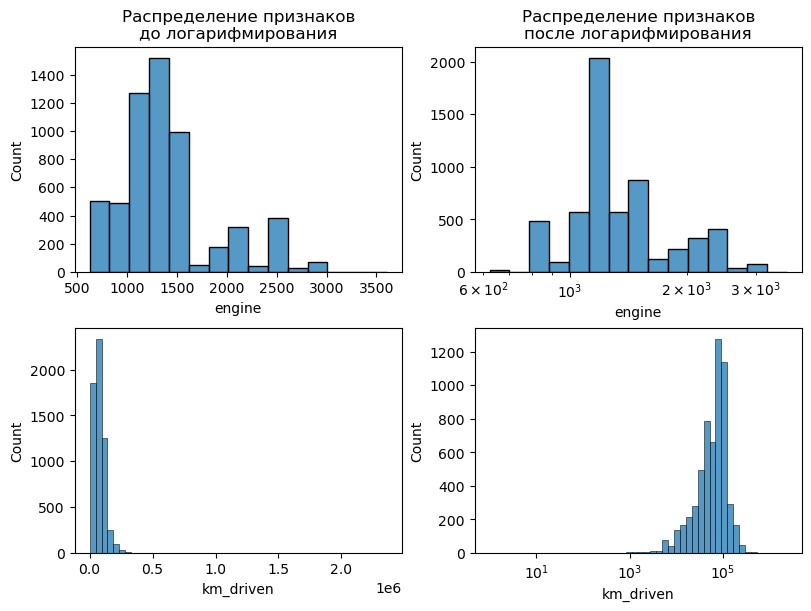

In [68]:
# Покажем также распределения torque и max_torque_rpm до и после логарифмирования

fig, ax = plt.subplots(2, 2, layout="constrained")
fig.set_size_inches(8, 6)
ax = ax.ravel()

bins=50

sns.histplot(data=df_train, x='engine', bins=15, ax=ax[0])
sns.histplot(data=df_train, x='engine', bins=15, log_scale=True, ax=ax[1])

sns.histplot(data=df_train, x='km_driven', bins=50, ax=ax[2])
sns.histplot(data=df_train, x='km_driven', bins=50, log_scale=True, ax=ax[3])

ax[0].set_title("Распределение признаков\nдо логарифмирования")
ax[1].set_title("Распределение признаков\nпосле логарифмирования")

plt.show()

In [69]:
# Модификация 1

# Копируем данные
df_train_1 = df_train.drop(columns=["max_torque_rpm", "torque"]).copy()
df_test_1 = df_test.drop(columns=["max_torque_rpm", "torque"]).copy()

# Добавляем max_power / engine
df_train_1["power_per_volume"] = df_train_1["max_power"] / df_train_1["engine"]
df_test_1["power_per_volume"] = df_test_1["max_power"] / df_test_1["engine"]

# # Добавляем log(year)
# df_train_1["year_log"] = np.log(df_train_1["year"])
# df_test_1["year_log"] = np.log(df_test_1["year"])

# Добавляем year**2
df_train_1["year_square"] = df_train_1["year"]**2
df_test_1["year_square"] = df_test_1["year"]**2

# Добавляем log(engine)
df_train_1["engine_log"] = np.log(df_train_1["engine"])
df_test_1["engine_log"] = np.log(df_test_1["engine"])

# # Добавляем engine / torque
# df_train_1["volume_per_torque"] = df_train_1["engine"] / df_train_1["torque"]
# df_test_1["volume_per_torque"] = df_test_1["engine"] / df_test_1["torque"]

# Добавляем log(km_driven)
df_train_1["km_driven_log"] = np.log(df_train_1["km_driven"])
df_test_1["km_driven_log"] = np.log(df_test_1["km_driven"])

# # Добавляем log(torque)
# df_train_1["torque_log"] = np.log(df_train_1["torque"])
# df_test_1["torque_log"] = np.log(df_test_1["torque"])

# # Добавляем log(ma_torque_rpm)
# df_train_1["max_torque_rpm_log"] = np.log(df_train_1["max_torque_rpm"])
# df_test_1["max_torque_rpm_log"] = np.log(df_test_1["max_torque_rpm"])

# Для удобства сделаем список новых фич, чтобы потом быстро их достать

# new_made_features = ["power_per_volume", "year_log", "engine_log", "volume_per_torque", "km_driven_log", "torque_log", "max_torque_rpm_log"]
new_made_features = ["power_per_volume", "year_square", "engine_log", "km_driven_log"]

# Временно убираем категориальные признаки перед нормализацией
X_train_1 = df_train_1.drop(columns=["name", "fuel", "seller_type", "transmission", "owner", "selling_price"])
X_test_1 = df_test_1.drop(columns=["name", "fuel", "seller_type", "transmission", "owner", "selling_price"])

y_train_1 = df_train_1["selling_price"]
y_test_1 = df_test_1["selling_price"]

# Нормализуем данные

X_train_1, X_test_1, scaler_1 = normalize(X_train_1, X_test_1)

# Добавляем закодированные категориальные признаки

X_train_1 = pd.concat([X_train_1, encoded_train], axis=1)
X_test_1 = pd.concat([X_test_1, encoded_test], axis=1)

X_train_1.sample(3)

,year,km_driven,mileage,engine,max_power,seats,power_per_volume,year_square,engine_log,km_driven_log,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,seller_type_Trustmark Dealer,transmission_Manual,owner_Fourth & Above Owner,owner_Second Owner,owner_Test Drive Car,owner_Third Owner
3153,1.360490,-0.956485,-1.372641,0.044378,1.678176,-0.434419,2.807236,1.362766,0.211087,-1.509529,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4586,0.627938,-0.631842,0.356069,-0.478663,-0.150655,-0.434419,0.553213,0.627972,-0.410765,-0.557647,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
243,-0.592983,0.805876,-1.851862,1.543489,1.014411,3.637823,-0.616667,-0.594257,1.525057,0.935079,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0


In [70]:
# Оценим модель
res_1 = train_model(X_train_1, y_train, X_test_1, y_test, shuffle_cv=True)
pprint_scores(res_1)

r2_train: 0.7029790870738399
r2_test: 0.6723837704924295
mse_train: 85137580938.69702
mse_test: 188323164011.54987
cv_scores: [0.73754177 0.75239004 0.80202667 0.74348683 0.69171291 0.6900803
 0.59063678 0.72864363 0.70560923 0.51835749]
cv_scores_mean: 0.6960485663472754


Результат немного улучшился, на тесте оценка составляет 0.672, а при кросс-валидации на трейне на 10 фолдах в среднем оценка равна 0.696, однако это по-прежнему мало.

### 2 Добавим полиномиальные  фичи

Воспользуемся PolynomialFeatures и набросаем кучу новых признаков в наши данные. Так же сразу добавим новые фичи из предыдущего пункта.

In [71]:
from sklearn.preprocessing import PolynomialFeatures

pf = PolynomialFeatures(degree=2)

df_train_2 = df_train.drop(columns=["torque", "max_torque_rpm"]).copy()
df_test_2 = df_test.drop(columns=["torque", "max_torque_rpm"]).copy()

X_train_2 = df_train_2.drop(columns=["name", "fuel", "seller_type", "transmission", "owner", "selling_price"])
X_test_2 = df_test_2.drop(columns=["name", "fuel", "seller_type", "transmission", "owner", "selling_price"])

y_train_2 = df_train_2["selling_price"]
y_test_2 = df_test_2["selling_price"]

# Создадим полиномиальные признаки

X_train_2 = pd.DataFrame(pf.fit_transform(X_train_2))
X_test_2 = pd.DataFrame(pf.fit_transform(X_test_2))

# Добавляем фичи из предыдущего пункта

X_train_2 = pd.concat([X_train_2, df_train_1[new_made_features]], axis=1)
X_test_2 = pd.concat([X_test_2, df_test_1[new_made_features]], axis=1)

# Нормализуем данные

X_train_2, X_test_2, scaler_2 = normalize(X_train_2, X_test_2)

# Добавляем категориальные признаки

X_train_2 = pd.concat([X_train_2, encoded_train], axis=1)
X_test_2 = pd.concat([X_test_2, encoded_test], axis=1)

X_train_2.shape

(5840, 42)

In [72]:
# Оценим модель
res_2 = train_model(X_train_2, y_train, X_test_2, y_test, shuffle_cv=True)
pprint_scores(res_2)

r2_train: 0.839871962949483
r2_test: 0.8215800484862047
mse_train: 45898834464.6703
mse_test: 102560883025.75623
cv_scores: [0.87067317 0.82208045 0.72880526 0.86752413 0.78081819 0.81597374
 0.82148124 0.85611811 0.84320468 0.69924591]
cv_scores_mean: 0.8105924889096239


Заметно значительное улучшение метрик! Однако, эксперименты показали, что в результате дальнейших манипуляций с данными (далее в этой части задания), метрики получаются почти одинаковыми. К тому же, полиномиальные признаки сильно увеличивают и без того достаточное количество признаков в этой задаче, а в некоторых случаях я получал явное переобучение модели (метрики на кросс-валидации были сильно меньше нуля). Например, если оставить столбцы torque и max_power_rpm, то метрики с полиномиальными признаками получатся плохими. Однако при дальнеших модификациях данных они выровняются и получим примерно такой же результат. Похожее поведение я получал и в ряде других случаев.

Добавление полиномиальных признаков кажется мне неоправданными в данной задаче, поэтому от этой идеи я отказался.

### 3 Логарифмируем целевую переменную

Взглянем на распределение целевой переменной в этой задаче.

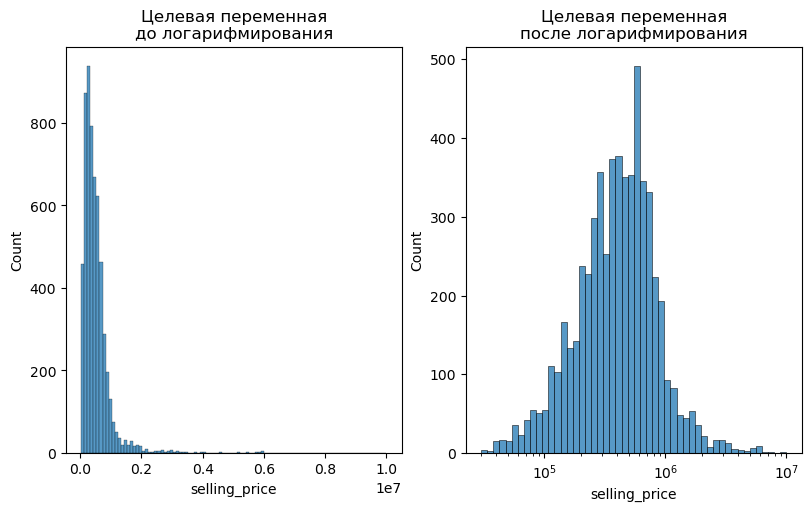

In [73]:
fig, ax = plt.subplots(1, 2, layout="constrained")
fig.set_size_inches(8, 5)

sns.histplot(df_train, x="selling_price", bins=100, ax=ax[0])
sns.histplot(df_train, x="selling_price", log_scale=True, bins=50, ax=ax[1])

ax[0].set_title('Целевая переменная\nдо логарифмирования')
ax[1].set_title('Целевая переменная\nпосле логарифмирования')
plt.show()

Видно, что распределение после логарифмирования получает более симметричный вид. К тому же, ушли большие значения цены на автомобиль, что поспособствует снижению размерности весов. Обучим модель с новой целевой переменной и взглянем на результат. Будем использовать данные с признаками, сгенерированными в пункте 1.

In [74]:
y_train_log = np.log(df_train["selling_price"])
y_test_log = np.log(df_test["selling_price"])

In [75]:
# Оценим модель
res_3 = train_model(X_train_1, y_train_log, X_test_1, y_test_log, shuffle_cv=True)
pprint_scores(res_3)

r2_train: 0.8469608595214309
r2_test: 0.872654112284086
mse_train: 0.0894337628485589
mse_test: 0.09109142519634075
cv_scores: [0.84828652 0.84934984 0.85095145 0.83853402 0.86363834 0.84798363
 0.8456449  0.84012907 0.81335705 0.84519279]
cv_scores_mean: 0.8443067616585284


Снова заметное улучшение качества модели! Метрики R2 на тесте составляет 0.873, а средняя метрика при кросс-валидации составила 0.844. Далее будем работать с логарифмированной целевой переменной.

Возвращаясь к пункту 2, в котором обсуждались полиномиальные признаки, хочу отметить, что с ними результат был бы почти такой же (я честно проверял).

### 4 Поработаем с пропусками

Попробуем указать модели на пропуски, добавив соответствующие столбцы-индикаторы. Каждый столбец отвечает за отдельный признак и принимает значение 0, если признак не пропущен и 1, если он пропущен.

In [76]:
# train и test_skips_mask это датафреймы с булевыми значениями для всех ячеек, где пропуск, а где нет
# Объявлялся в части c EDA
train_skips_df = train_skips_mask.drop(columns=["torque", "max_torque_rpm"]).astype(int)
test_skips_df = test_skips_mask.drop(columns=["torque", "max_torque_rpm"]).astype(int)
train_skips_df.columns = list(map(lambda x: x+'_is_skip', train_skips_df.columns))
test_skips_df.columns = list(map(lambda x: x+'_is_skip', test_skips_df.columns))

In [77]:
X_train_4 = X_train_1.copy()
X_test_4 = X_test_1.copy()

In [78]:
X_train_4 = pd.concat([X_train_4, train_skips_df], axis=1)
X_test_4 = pd.concat([X_test_4, test_skips_df], axis=1)

X_train_4.columns

Index(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats',
       'power_per_volume', 'year_square', 'engine_log', 'km_driven_log',
       'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner', 'name_is_skip',
       'year_is_skip', 'selling_price_is_skip', 'km_driven_is_skip',
       'fuel_is_skip', 'seller_type_is_skip', 'transmission_is_skip',
       'owner_is_skip', 'mileage_is_skip', 'engine_is_skip',
       'max_power_is_skip', 'seats_is_skip'],
      dtype='object')

Обучим модель на новых данных с информацией о пропусках.

In [79]:
# Оценим модель
res_4 = train_model(X_train_4, y_train_log, X_test_4, y_test_log, shuffle_cv=True)
pprint_scores(res_4)

r2_train: 0.8479845183553054
r2_test: 0.8727202576922903
mse_train: 0.08883555208299734
mse_test: 0.09104411091229438
cv_scores: [0.85032373 0.85299255 0.85240692 0.83914636 0.86536225 0.84673613
 0.84562347 0.84008314 0.81450898 0.84564169]
cv_scores_mean: 0.845282521893117


Данная модификация практически не повлияла на качество модели, метрики остались на том же уровне.

В целом смущает идея каким-либо особенным образом обрабатывать пропуски в этой задаче. Во-первых, пропуски есть не во всех признаках, а значит мы вынуждены в будущем либо требовать на вход данные, в которых пропуски допускаются только в отдельных признаках, либо добавлять индикаторы пропусков в модель для всех признаков, что приведет к образованию нескольких нулевых весов. И тот и другой вариант видится мне странным и уступает, на мой взгляд, простому заполнению пропусков медианой.

### 5 Используем признак 'name' 

Из признака name можно достать марку машины, так как она (предположительно) указана самым первым словом. Далее полученные марки закодируем при помощи OHE и обучим модель.

Новые признаки будем кодировать сразу вместе со старыми, чтобы, в случае успеха, в итоге у нас был один обученный OHE кодировщик для всех категориальных признаков модели.

НО! Есть небольшая особенность. В test'е встречаются марки 'Opel' и 'Ashok', а в train'е их нет. Чтобы провести кодировку, добавим к маркам из train'а две строки с недостающими наименованиями, а после кодировки из получившегося датафрейма удалим две последние строки, чтобы не нарушать размерность.

Вообще можно было бы удалить строчки с этими марками из трейна, так как они встречаются всего лишь по одному разу и, вероятнее всего, будут иметь мизерные веса в итоговой модели. Однако я посчитал, что это нехорошая практика.

Кроме того, как мы увидим ниже, распределение марок машин здесь крайне неравномерное, что наводит на мысль о какой-то допольнительной обработке перед кодировкой.

Кодировка 'name' с помощью OrdinalEncoder не принесла результатов, наоборот, ухудшила метрики модели примерно на ~5%. В целом, как лучше поступить при таком неравномерном распределении классов - вопрос для меня открытый.

In [80]:
brand_train = df_train["name"].apply(lambda x: x.split(' ')[0])
brand_test = df_test["name"].apply(lambda x: x.split(' ')[0])

brand_train.value_counts()

Maruti           1804
Hyundai          1058
Mahindra          611
Tata              534
Toyota            309
Ford              308
Honda             308
Chevrolet         188
Renault           171
Volkswagen        153
Nissan             63
Skoda              61
Datsun             49
Mercedes-Benz      44
BMW                41
Fiat               39
Audi               31
Jeep               20
Mitsubishi          8
Volvo               8
Jaguar              7
Force               4
Isuzu               4
Land                3
MG                  3
Daewoo              3
Kia                 3
Ambassador          3
Lexus               1
Peugeot             1
Name: name, dtype: int64

In [81]:
brand_test.value_counts()

Maruti           290
Hyundai          198
Tata             106
Mahindra          90
Toyota            59
Honda             57
Ford              50
Renault           29
Chevrolet         24
Volkswagen        15
Skoda             13
Nissan            11
Volvo             10
BMW               10
Jaguar             8
Datsun             7
Mercedes-Benz      5
Mitsubishi         4
Jeep               3
Lexus              3
Fiat               3
Audi               2
Ambassador         1
Opel               1
Ashok              1
Name: name, dtype: int64

In [82]:
# Делаем фрейм со всеми категориальными фичами
categorical_train = pd.concat([brand_train, df_train[["fuel", "seller_type", "transmission", "owner"]]], axis=1)
categorical_test = pd.concat([brand_test, df_test[["fuel", "seller_type", "transmission", "owner"]]], axis=1)

# Делаем фрейм из двух первых строк и в колонку 'name' записываем недостающие марки машины
tmp_df = categorical_train[:2].copy()
tmp_df["name"] = pd.Series(["Opel", "Ashok"])

# Добавляем вниз две строчки с недостающими марками, резетим индексы (для красоты)
categorical_train = pd.concat([categorical_train, tmp_df])
categorical_train.reset_index(drop=True, inplace=True)

# Проверяем, что они добавились вниз
categorical_train

,name,fuel,seller_type,transmission,owner
0,Maruti,Diesel,Individual,Manual,First Owner
1,Skoda,Diesel,Individual,Manual,Second Owner
2,Hyundai,Diesel,Individual,Manual,First Owner
3,Maruti,Petrol,Individual,Manual,First Owner
4,Hyundai,Petrol,Individual,Manual,First Owner
...,...,...,...,...,...
5837,Hyundai,Petrol,Individual,Manual,First Owner
5838,Hyundai,Diesel,Individual,Manual,Fourth & Above Owner
5839,Maruti,Diesel,Individual,Manual,First Owner
5840,Opel,Diesel,Individual,Manual,First Owner


In [83]:
# Кодирем OHE марки машины

enc_all = OneHotEncoder(drop='first')

encoded_all_train = enc_all.fit_transform(categorical_train).toarray()
encoded_all_train = pd.DataFrame(encoded_all_train, columns=enc_all.get_feature_names_out())

encoded_all_test = enc_all.transform(categorical_test).toarray()
encoded_all_test = pd.DataFrame(encoded_all_test, columns=enc_all.get_feature_names_out())

In [84]:
# Убираем две последние строчки в получившемся фрейме для трейна
encoded_all_train = encoded_all_train[:-2]

In [85]:
# Делаем копии фреймов, удаляя старые категориальные фичи, чтобы они не дублировались
X_train_5 = X_train_1.drop(columns=encoded_train.columns).copy()
X_test_5 = X_test_1.drop(columns=encoded_test.columns).copy()

In [86]:
encoded_all_train.shape, X_train_5.shape

((5840, 41), (5840, 10))

In [87]:
X_train_5 = pd.concat([X_train_5, encoded_all_train], axis=1)
X_test_5 = pd.concat([X_test_5, encoded_all_test], axis=1)

In [88]:
X_train_5.columns

Index(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats',
       'power_per_volume', 'year_square', 'engine_log', 'km_driven_log',
       'name_Ashok', 'name_Audi', 'name_BMW', 'name_Chevrolet', 'name_Daewoo',
       'name_Datsun', 'name_Fiat', 'name_Force', 'name_Ford', 'name_Honda',
       'name_Hyundai', 'name_Isuzu', 'name_Jaguar', 'name_Jeep', 'name_Kia',
       'name_Land', 'name_Lexus', 'name_MG', 'name_Mahindra', 'name_Maruti',
       'name_Mercedes-Benz', 'name_Mitsubishi', 'name_Nissan', 'name_Opel',
       'name_Peugeot', 'name_Renault', 'name_Skoda', 'name_Tata',
       'name_Toyota', 'name_Volkswagen', 'name_Volvo', 'fuel_Diesel',
       'fuel_LPG', 'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner'],
      dtype='object')

In [99]:
X_train_5.columns.values

array(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats',
       'power_per_volume', 'year_square', 'engine_log', 'km_driven_log',
       'name_Ashok', 'name_Audi', 'name_BMW', 'name_Chevrolet',
       'name_Daewoo', 'name_Datsun', 'name_Fiat', 'name_Force',
       'name_Ford', 'name_Honda', 'name_Hyundai', 'name_Isuzu',
       'name_Jaguar', 'name_Jeep', 'name_Kia', 'name_Land', 'name_Lexus',
       'name_MG', 'name_Mahindra', 'name_Maruti', 'name_Mercedes-Benz',
       'name_Mitsubishi', 'name_Nissan', 'name_Opel', 'name_Peugeot',
       'name_Renault', 'name_Skoda', 'name_Tata', 'name_Toyota',
       'name_Volkswagen', 'name_Volvo', 'fuel_Diesel', 'fuel_LPG',
       'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner'], dtype=object)

In [89]:
# Оценим модель
res_5 = train_model(X_train_5, y_train_log, X_test_5, y_test_log, shuffle_cv=True)
pprint_scores(res_5)

r2_train: 0.8925176888853098
r2_test: 0.916487001988784
mse_train: 0.06281103966336196
mse_test: 0.059737445375789504
cv_scores: [0.89671469 0.8814593  0.88094673 0.88021463 0.89904628 0.90387764
 0.88916616 0.88844166 0.8683472  0.89793976]
cv_scores_mean: 0.888615403499086


Метрики заметно улучшились, несмотря на крайне неравномерное распределение марок автомобилей и огромное количество новых категориальных признаков. Оставляем эту модификацию, теперь взглянем на коэффициенты модели:

In [90]:
res_5["model"].coef_

array([-2.87953216e+01,  3.09294784e-03, -9.17870847e-03,  7.50953631e-02,
        4.61514121e-03,  4.10544255e-02,  1.82188838e-01,  2.92366186e+01,
        2.32017605e-01, -3.02537830e-02,  1.11022302e-16,  2.88204409e-01,
        4.27149542e-01, -4.65939046e-01, -7.28714360e-03, -4.29892237e-01,
       -3.82243168e-01, -3.56910634e-01, -2.42617549e-01, -9.12202854e-02,
       -1.47015170e-01, -1.19480721e-01,  3.49231640e-01, -3.37158487e-02,
       -2.45140753e-01,  6.87744430e-01,  7.73910601e-01,  2.70683490e-02,
       -2.62324556e-01, -6.89141866e-02,  4.43824392e-01,  4.19831526e-02,
       -1.46618766e-01,  2.77555756e-16, -5.98163243e-01, -2.12979489e-01,
       -2.04718578e-01, -5.39788978e-01,  1.04065199e-01, -1.92080207e-01,
        3.73649483e-01,  3.36843347e-01,  1.89281258e-01,  6.24304849e-02,
       -4.32775374e-02, -9.45087379e-03, -6.70531343e-02, -1.64304124e-01,
       -7.38800054e-02,  6.45804140e-01, -1.00466280e-01])

Среди весов есть несколько очень близких к 0, в остальном, кажется они выглядят нормально. Попробуем обучить Ridge регрессию чтобы занулить малозначительные признаки и взглянем на результат.

### 6 Попробуем регуляризацию

In [91]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here

ridge = Ridge()

grid = {"alpha": np.arange(0.1, 10.1, 0.1)}

ridge_cv = GridSearchCV(ridge, param_grid=grid, cv=10, scoring='r2', n_jobs=2, verbose=1)

ridge_cv.fit(X_train_5, y_train_log)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


GridSearchCV(cv=10, estimator=Ridge(), n_jobs=2,
             param_grid={'alpha': array([ 0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ,  1.1,
        1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,  1.9,  2. ,  2.1,  2.2,
        2.3,  2.4,  2.5,  2.6,  2.7,  2.8,  2.9,  3. ,  3.1,  3.2,  3.3,
        3.4,  3.5,  3.6,  3.7,  3.8,  3.9,  4. ,  4.1,  4.2,  4.3,  4.4,
        4.5,  4.6,  4.7,  4.8,  4.9,  5. ,  5.1,  5.2,  5.3,  5.4,  5.5,
        5.6,  5.7,  5.8,  5.9,  6. ,  6.1,  6.2,  6.3,  6.4,  6.5,  6.6,
        6.7,  6.8,  6.9,  7. ,  7.1,  7.2,  7.3,  7.4,  7.5,  7.6,  7.7,
        7.8,  7.9,  8. ,  8.1,  8.2,  8.3,  8.4,  8.5,  8.6,  8.7,  8.8,
        8.9,  9. ,  9.1,  9.2,  9.3,  9.4,  9.5,  9.6,  9.7,  9.8,  9.9,
       10. ])},
             scoring='r2', verbose=1)

In [92]:
print(f"best estimator: {ridge_cv.best_estimator_}")
print(f"best params: {ridge_cv.best_params_}")
print(f"best score: {ridge_cv.best_score_}")
print(f"scorer: {ridge_cv.scorer_}")
print(f"n_splits: {ridge_cv.n_splits_}")

best estimator: Ridge(alpha=0.1)
best params: {'alpha': 0.1}
best score: 0.8835666966241172
scorer: make_scorer(r2_score)
n_splits: 10


In [93]:
# Посмотрим на предикты лучшей модели на трейне и на тесте
r_train_predict = ridge_cv.best_estimator_.predict(X_train_5)
r_test_predict = ridge_cv.best_estimator_.predict(X_test_5)

r2_train = R2(y_train_log, r_train_predict)
r2_test = R2(y_test_log, r_test_predict)

print(r2_train, r2_test)

0.8897901111150469 0.9164369726760752


Метрики на трейне и на тесте после регуляризации немного ухудшились, однако на кросс-валидации они остались прежними! Посмотрим на веса:

In [94]:
ridge_cv.best_estimator_.coef_

array([-1.49235597,  0.00629086, -0.00391973,  0.07074183,  0.00993468,
        0.04059922,  0.18122207,  1.92056103,  0.23163215, -0.05195796,
        0.        ,  0.17795544,  0.31851385, -0.57450117,  0.0309318 ,
       -0.50679814, -0.48746707, -0.39668818, -0.33456879, -0.18436768,
       -0.24152133, -0.1665556 ,  0.22597957, -0.10043275, -0.28931755,
        0.58070386,  0.64910126, -0.03137974, -0.33714008, -0.15929397,
        0.33613192,  0.0271251 , -0.24792746,  0.        , -0.37850983,
       -0.30021544, -0.30053973, -0.6315633 ,  0.02161399, -0.29083992,
        0.26535185,  0.33158296,  0.18728944,  0.05739994, -0.04071838,
       -0.00609645, -0.07912485, -0.15561388, -0.08292313,  0.67757061,
       -0.1057381 ])

Регуляризация занулила близкие к нулю коэффициенты. Данную модель будем считать наилучшей и далее будем работать с ней.

In [95]:
best_train_predict = r_train_predict
best_test_predict = r_test_predict

best_model = ridge_cv.best_estimator_
best_alpha = ridge_cv.best_params_["alpha"]

best_scaler = scaler_1
best_encoder = enc_all

### Формируем в pickle 

Сложим все необходимое для работы модели в pickle файл

In [96]:
import pickle

model_data = {
    "model": best_model,
    "model_weights": best_model.coef_,
    "model_intercept": best_model.intercept_,
    "alpha": best_alpha,
    "OHE": best_encoder,
    "StSc": best_scaler
}

with open("model_data.pickle", "wb") as f:
    pickle.dump(model_data, f)

# Часть Бизнесовая (0.5 балла)

Заказчик просил вас посчитать кастомную метрику -- среди всех предсказанных цен на авто посчитать долю предиктов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

<font color='#9933CC'>Сделайте это самостоятельно для лучшей из своих моделей</font>

In [97]:
def business_metrics(y_true: np.array, y_pred: np.array) -> float:
    """Оценить, какая доля предсказанных цен отличается от реальных цен
    не более чем на 10%.
    
    Args:
        y_true -- реальные цены.
        y_pred -- предсказанные цены.
        
    Returns:
        suitable_share -- искомая доля.
    """
    percentage = y_pred / y_true.values  # отношения предсказанных цен к реальным
    suitable = percentage[(percentage >= 0.9) & (percentage <= 1.1)]  # цены, которые подходят нам по условию
    suitable_share = len(suitable) / len(percentage)
    
    return suitable_share

unlog_pred = np.e**best_test_predict

business_metrics(y_test, unlog_pred)

0.373

# Часть 5 (2.5 балла) | Реализация сервиса на FastAPI

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [98]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str 
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

ModuleNotFoundError: No module named 'fastapi'

[CV 7/10] END ........................alpha=9.4;, score=0.525 total time=   0.0s
[CV 3/10] END ........................alpha=9.5;, score=0.686 total time=   0.0s
[CV 4/10] END ........................alpha=9.5;, score=0.619 total time=   0.0s
[CV 5/10] END ........................alpha=9.5;, score=0.489 total time=   0.0s
[CV 6/10] END ........................alpha=9.5;, score=0.723 total time=   0.0s
[CV 7/10] END ........................alpha=9.5;, score=0.525 total time=   0.0s
[CV 3/10] END ........................alpha=9.6;, score=0.686 total time=   0.0s
[CV 4/10] END ........................alpha=9.6;, score=0.619 total time=   0.0s
[CV 5/10] END ........................alpha=9.6;, score=0.489 total time=   0.0s
[CV 6/10] END ........................alpha=9.6;, score=0.723 total time=   0.0s
[CV 7/10] END ........................alpha=9.6;, score=0.525 total time=   0.0s
[CV 3/10] END ..........alpha=9.700000000000001;, score=0.686 total time=   0.0s
[CV 4/10] END ..........alph

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# Часть 6 (1 балл) | Оформление результатов

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете прислать screencast в ТГ
3. Просматривает ноутбук с pure-DS частью
4. Заглядывает в код сервиса
5. Хвалит

# Часть Благодарственная

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

https://drive.google.com/file/d/1LT06nyg9QgVi3r-D5BY-_mQ9TcJQFxJN/view?usp=share_link